# Whelks and lobsters -- context operator

## The system

In [17]:
%display latex

In [1]:
from lbuc import *

In [2]:
from lbuc.bondcalculus import *

In [4]:
!ls

'Lotka-Volterra role reversal.ipynb'
'Sensitivity analysis.ipynb'
 Untitled.ipynb
'W&L context operator context signal test.ipynb'
'W&L physical subdivision.ipynb'
'WandL context mask tidied.ipynb'
'Whelks and lobsters -- Split context, New Context Signals.ipynb'
'Whelks and lobsters -- Split context-Copy2 copy.ipynb'
'Whelks and lobsters -- Split context-Copy2.ipynb'
'Whelks and lobsters context 2.ipynb'
'Whelks and lobsters context 4.ipynb'
'Whelks and lobsters context signals with masks 2 BC.ipynb'
'Whelks and lobsters context signals with masks 2.ipynb'
'Whelks and lobsters context signals with masks.ipynb'
 WhelksAndLobsters.bond
 cysignals_crash_logs


In [79]:
m = BondModel("WhelksAndLobsters.bond")

Running cmd: 'load "WhelksAndLobsters.bond"' ...


In [87]:
p = m.process("[1, 1.2] Whelk || [4, 6] Lobster with network N(0.8, 0.6, 0.3, 0.05, 2)")

In [96]:
!cat /tmp/bond-sage-script-9og57pzx.py

from sage.all import *
import sympy as sym

R, x = PolynomialRing(RIF, 2, ', '.join(map('x{}'.format, range(0, 2)))).objgens()
xsr = [SR.var(str(x1)) for x1 in x]
for v in xsr:
   assume(v, 'real')
xsym = sym.var(','.join(map('x{}'.format, range(0,2))))
asym = sym.var(','.join(map('a{}'.format, range(0,8))))
y0 = [RIF('[4.00000000000000000000 .. 6.00000000000000000000]'), RIF('[0.99999999999999990000 .. 1.20000000000000020000]')]
ysymraw = [(x0) * ((a0) * ((x1) * (2.0))) + (x0) * (((x1) * (-1)) * ((x1) * (2.0))) + (-1) * ((x0) * (a1)) + (-1) * ((x0) * ((x0) * (a2))), (x1) * (a3) + ((x1) * (-1)) * ((x1) * (a4)) + (-1) * ((x0) * ((a5) * ((x1) * (a6)))) + (-1) * ((x0) * (((x1) * (-1)) * ((x1) * (a7))))]
ysym = [sym.simplify(y1) for y1 in ysymraw]
ysr = [y1._sage_().substitute(a0=RIF('[0.79999999999999990000 .. 0.80000000000000000000]'),a1=RIF('[0.04999999999999999600 .. 0.05000000000000000000]'),a2=RIF('[0.04999999999999999600 .. 0.05000000000000000000]'),a3=RIF('[0.60000000000000000000 .

In [88]:
s = p.as_system

Running cmd: 'savesage "[1, 1.2] Whelk || [4, 6] Lobster with network N(0.8, 0.6, 0.3, 0.05, 2)" "/tmp/bond-sage-script-9og57pzx.py"' ...


In [100]:
u = (x, y) = reversed(s.x)

In [101]:
vf = vector(reversed(s.y))

In [102]:
vf

(0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1, -2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0)

In [103]:
x2 = s.y0

In [104]:
v2 = [RIF(1,1.2), RIF(4,6)]

In [105]:
v3 = v2 # [RIF(1,1.1), RIF(4,5)]

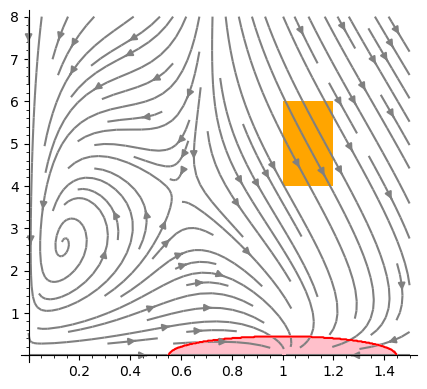

In [106]:
p = streamline_plot(tuple(vf),(x,0,1.5),(y,0,8), color='grey')\
    + polygon([(v3[0].lower(), v3[1].lower()),
               (v3[0].lower(), v3[1].upper()),
               (v3[0].upper(), v3[1].upper()),
               (v3[0].upper(), v3[1].lower())],
              color='orange')\
    + region_plot((lambda x, y: (x - 1)^2 + y^2 - 0.2 < 0),
                  (x, 0, 1.5),
                  (y, 0, 8),
                  incol='pink', plot_points=500, bordercol='red')
p.set_aspect_ratio(1/6)
p.show()

## Simple signal

In [109]:
P = Atomic((var("Whelk") - 1)^2 + var("Lobster")^2 > 0.2)

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 96 flowpipes in 0.4242155279935105 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc74c415820>, 0, symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2020000000000009], [[0.10000000000000000 .. 5.2020000000000009]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.62 seconds
roots = [[0.72899770431682586 .. 2.3396961789293478], [2.4054956907643583 .. 2.4223569572167918]]
domain = [0.0000000000000000 .. 5.2020000000000009]
roots = [[0.728

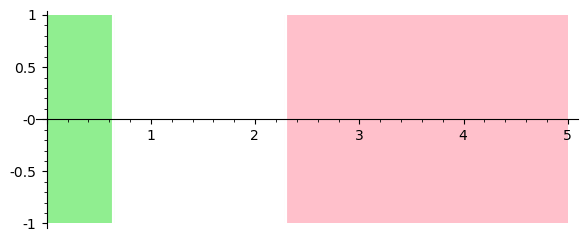

In [110]:
sig = F(RIF(0.1, 0.2), P).signal_for_system(
    s, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
sig.plot()

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fc74c298240>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <lbuc.reach_trees.ReachT

top-level root detection: 1 items in 0.13 seconds
roots = [[1.9494069953384487 .. 2.2661983340704222]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9494069953384487 .. 2.2661983340704222]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9494069953384487 .. 2.2661983340704222]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8494069953384487], True), ([2.1661983340704225 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8494069953384487], True), ([2.1661983340704225 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(L

top-level root detection: 1 items in 0.16 seconds
roots = [[1.1587772868248296 .. 1.9796869398670812]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.1587772868248296 .. 1.9796869398670812]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.1587772868248296 .. 1.9796869398670812]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.0587772868248296], True), ([1.8796869398670812 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.0587772868248296], True), ([1.8796869398670812 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(L

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8705153484842031 .. 2.2286463799981329]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8705153484842031 .. 2.2286463799981329]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8705153484842031 .. 2.2286463799981329]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7705153484842032], True), ([2.1286463799981332 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7705153484842032], True), ([2.1286463799981332 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(L

top-level root detection: 1 items in 0.22 seconds
roots = [[1.0315253521806846 .. 2.1341310578689115]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.0315253521806846 .. 2.1341310578689115]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.0315253521806846 .. 2.1341310578689115]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 0.93152535218068456], True), ([2.0341310578689117 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.93152535218068456], True), ([2.0341310578689117 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lob

top-level root detection: 1 items in 0.20 seconds
roots = [[1.1587772868248296 .. 1.9796869398670812]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.1587772868248296 .. 1.9796869398670812]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.1587772868248296 .. 1.9796869398670812]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.0587772868248296], True), ([1.8796869398670812 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.0587772868248296], True), ([1.8796869398670812 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None


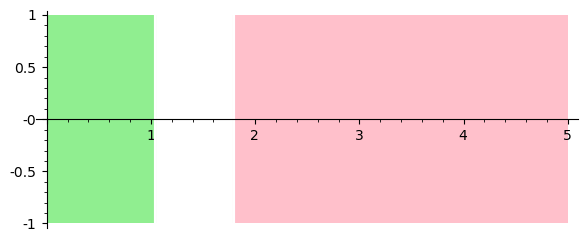

In [111]:
csig = F(RIF(0.1, 0.2), P).context_signal_for_system(
    s, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=False,
)
sig = csig.refined_signal(2)
sig.plot()

 ==> creating ContextSignal with coord=(0, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fc74c298240>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fc74c415ee0>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc74c125ac0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.10 seconds
roots = [[2.1614685741463399 .. 2.2519068338220683]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1614685741463399 .. 2.2519068338220683]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1614685741463399 .. 2.2519068338220683]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 0, 3), signal = Signal([0.000000000000

var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc74c125eb0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.11 seconds
roots = [[2.1071172791754131 .. 2.1944644154186400]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1071172791754131 .. 2.1944644154186400]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1071172791754131 .. 2.1944644154186400]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 2.0071172791754131], True), ([2.0944644154186402 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 2.0071172791754131], T

top-level root detection: 1 items in 0.12 seconds
roots = [[2.1510522806642131 .. 2.2372350426575372]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1510522806642131 .. 2.2372350426575372]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1510522806642131 .. 2.2372350426575372]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 2.0510522806642131], True), ([2.1372350426575374 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 2.0510522806642131], True), ([2.1372350426575374 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0981267709483972 .. 2.1806025175951130]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0981267709483972 .. 2.1806025175951130]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0981267709483972 .. 2.1806025175951130]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9981267709483972], True), ([2.0806025175951132 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9981267709483972], True), ([2.0806025175951132 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0105630356917001 .. 2.0852810870606962]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0105630356917001 .. 2.0852810870606962]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0105630356917001 .. 2.0852810870606962]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9105630356917001], True), ([1.9852810870606962 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9105630356917001], True), ([1.9852810870606962 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8547619678722160 .. 1.9881667162404884]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8547619678722160 .. 1.9881667162404884]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8547619678722160 .. 1.9881667162404884]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7547619678722160], True), ([1.8881667162404884 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7547619678722160], True), ([1.8881667162404884 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.17 seconds
roots = [[1.8656264921058800 .. 1.9356538584611305]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8656264921058800 .. 1.9356538584611305]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8656264921058800 .. 1.9356538584611305]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7656264921058800], True), ([1.8356538584611306 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7656264921058800], True), ([1.8356538584611306 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9793891515582444 .. 1.9796869398670812], [1.9897095252275771 .. 2.0607851017773320]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9793891515582444 .. 1.9796869398670812], 
 [1.9897095252275771 .. 2.0607851017773320]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9793891515582444 .. 1.9796869398670812], 
 [1.9897095252275771 .. 2.0607851017773320]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(0, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8897095252275771], True), ([1.9607851017773321 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8897095252275771], True), ([1.9607851017773321 .. 5.0000000000000000], False)], mask=None), r

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8615035536434236 .. 1.9268030027877024]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8615035536434236 .. 1.9268030027877024]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8615035536434236 .. 1.9268030027877024]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7615035536434236], True), ([1.8268030027877024 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7615035536434236], True), ([1.8268030027877024 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[2.1730469118471789 .. 2.2634825730297350]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1730469118471789 .. 2.2634825730297350]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1730469118471789 .. 2.2634825730297350]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 2.0730469118471789], True), ([2.1634825730297353 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 2.0730469118471789], True), ([2.1634825730297353 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0658884603314033 .. 2.1389662344800003]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0658884603314033 .. 2.1389662344800003]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0658884603314033 .. 2.1389662344800003]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9658884603314033], True), ([2.0389662344800005 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9658884603314033], True), ([2.0389662344800005 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.11 seconds
roots = [[2.1086447280254443 .. 2.1900599263257128]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1086447280254443 .. 2.1900599263257128]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1086447280254443 .. 2.1900599263257128]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 2.0086447280254443], True), ([2.0900599263257131 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 2.0086447280254443], True), ([2.0900599263257131 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.13 seconds
roots = [[2.0571747665678588 .. 2.1341310578689115]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0571747665678588 .. 2.1341310578689115]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0571747665678588 .. 2.1341310578689115]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9571747665678588], True), ([2.0341310578689117 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9571747665678588], True), ([2.0341310578689117 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9721435531171027 .. 1.9796869398670812], [1.9800805032785546 .. 2.0485946578922683]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9721435531171027 .. 1.9796869398670812], 
 [1.9800805032785546 .. 2.0485946578922683]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9721435531171027 .. 1.9796869398670812], 
 [1.9800805032785546 .. 2.0485946578922683]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(0, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8800805032785546], True), ([1.9485946578922683 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8800805032785546], True), ([1.9485946578922683 .. 5.0000000000000000], False)], mask=None), r

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8855373792625331 .. 1.9611264695483135]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8855373792625331 .. 1.9611264695483135]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8855373792625331 .. 1.9611264695483135]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7855373792625331], True), ([1.8611264695483136 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7855373792625331], True), ([1.8611264695483136 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9549723814468733 .. 2.0263467942482989]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9549723814468733 .. 2.0263467942482989]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9549723814468733 .. 2.0263467942482989]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8549723814468733], True), ([1.9263467942482990 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8549723814468733], True), ([1.9263467942482990 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8115091937157896 .. 1.9440443480703609]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8115091937157896 .. 1.9440443480703609]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8115091937157896 .. 1.9440443480703609]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7115091937157896], True), ([1.8440443480703609 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7115091937157896], True), ([1.8440443480703609 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8221032326861392 .. 1.8922681372744286]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8221032326861392 .. 1.8922681372744286]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8221032326861392 .. 1.8922681372744286]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7221032326861392], True), ([1.7922681372744286 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7221032326861392], True), ([1.7922681372744286 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8157127873074860 .. 1.8948508409921403]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8157127873074860 .. 1.8948508409921403]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8157127873074860 .. 1.8948508409921403]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7157127873074860], True), ([1.7948508409921404 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7157127873074860], True), ([1.7948508409921404 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.17 seconds
roots = [[1.6655095653949059 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6655095653949059 .. 1.8177271147421941]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6655095653949059 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5655095653949059], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5655095653949059], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8117740909924153 .. 1.8948508409921403]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8117740909924153 .. 1.8948508409921403]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8117740909924153 .. 1.8948508409921403]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7117740909924153], True), ([1.7948508409921404 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7117740909924153], True), ([1.7948508409921404 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.17 seconds
roots = [[1.6136025393349557 .. 1.8698203113228507]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6136025393349557 .. 1.8698203113228507]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6136025393349557 .. 1.8698203113228507]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5136025393349557], True), ([1.7698203113228507 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5136025393349557], True), ([1.7698203113228507 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.14 seconds
roots = [[1.6633300443254872 .. 1.8018955675639854]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6633300443254872 .. 1.8018955675639854]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6633300443254872 .. 1.8018955675639854]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5633300443254872], True), ([1.7018955675639855 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5633300443254872], True), ([1.7018955675639855 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6110949626679706 .. 1.7907319186341336]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6110949626679706 .. 1.7907319186341336]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6110949626679706 .. 1.7907319186341336]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5110949626679707], True), ([1.6907319186341336 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5110949626679707], True), ([1.6907319186341336 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.15 seconds
roots = [[1.4279681688924155 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4279681688924155 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4279681688924155 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.3279681688924155], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.3279681688924155], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6113104279295142 .. 1.7809743684650932]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6113104279295142 .. 1.7809743684650932]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6113104279295142 .. 1.7809743684650932]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5113104279295142], True), ([1.6809743684650932 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5113104279295142], True), ([1.6809743684650932 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.18 seconds
roots = [[1.2633883083755312 .. 1.2698898155144596], [1.2905842098463022 .. 1.2922298118416325], [1.3054060191187095 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2633883083755312 .. 1.2698898155144596], 
 [1.2905842098463022 .. 1.2922298118416325], 
 [1.3054060191187095 .. 1.8177271147421941]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2633883083755312 .. 1.2698898155144596], 
 [1.2905842098463022 .. 1.2922298118416325], 
 [1.3054060191187095 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.1905842098463022], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3), signal = Signal([0.0000000000000000 .. 5.000000000

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4373257398796772 .. 1.4422565145763576], [1.4461907094808859 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4373257398796772 .. 1.4422565145763576], 
 [1.4461907094808859 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4373257398796772 .. 1.4422565145763576], 
 [1.4461907094808859 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.3461907094808859], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.3461907094808859], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), r

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7961342437225447 .. 1.8669628902954876]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7961342437225447 .. 1.8669628902954876]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7961342437225447 .. 1.8669628902954876]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6961342437225447], True), ([1.7669628902954876 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6961342437225447], True), ([1.7669628902954876 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.14 seconds
roots = [[1.6613344915871259 .. 1.7920867195504382]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6613344915871259 .. 1.7920867195504382]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6613344915871259 .. 1.7920867195504382]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5613344915871259], True), ([1.6920867195504383 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5613344915871259], True), ([1.6920867195504383 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.11 seconds
roots = [[1.4818331808097056 .. 1.5253675136664189], [1.7908485536642637 .. 1.8564064158146168]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4818331808097056 .. 1.5253675136664189], 
 [1.7908485536642637 .. 1.8564064158146168]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4818331808097056 .. 1.5253675136664189], 
 [1.7908485536642637 .. 1.8564064158146168]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6908485536642637], True), ([1.7564064158146168 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6908485536642637], True), ([1.7564064158146168 .. 5.0000000000000000], False)], mask=None), r

top-level root detection: 1 items in 0.14 seconds
roots = [[1.6096225115215880 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6096225115215880 .. 1.8177271147421941]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6096225115215880 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5096225115215880], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5096225115215880], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6511303074786347 .. 1.7648125577458780]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6511303074786347 .. 1.7648125577458780]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6511303074786347 .. 1.7648125577458780]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5511303074786347], True), ([1.6648125577458781 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5511303074786347], True), ([1.6648125577458781 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.14 seconds
roots = [[1.6082731397317473 .. 1.7540522721886956]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6082731397317473 .. 1.7540522721886956]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6082731397317473 .. 1.7540522721886956]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5082731397317473], True), ([1.6540522721886956 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5082731397317473], True), ([1.6540522721886956 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4392733480252521 .. 1.4422565145763576], [1.4500756267549037 .. 1.7430702038148456]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4392733480252521 .. 1.4422565145763576], 
 [1.4500756267549037 .. 1.7430702038148456]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4392733480252521 .. 1.4422565145763576], 
 [1.4500756267549037 .. 1.7430702038148456]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.3500756267549037], True), ([1.6430702038148456 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.3500756267549037], True), ([1.6430702038148456 .. 5.0000000000000000], False)], mask=None), r

top-level root detection: 1 items in 0.14 seconds
roots = [[1.6062564880771832 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6062564880771832 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6062564880771832 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5062564880771832], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5062564880771832], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.18 seconds
roots = [[1.3343314242940507 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3343314242940507 .. 1.8177271147421941]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3343314242940507 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.2343314242940507], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.2343314242940507], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4549720584278582 .. 1.7098708288415013]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4549720584278582 .. 1.7098708288415013]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4549720584278582 .. 1.7098708288415013]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.3549720584278582], True), ([1.6098708288415013 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.3549720584278582], True), ([1.6098708288415013 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0650912854226404 .. 2.1453484483042816]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0650912854226404 .. 2.1453484483042816]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0650912854226404 .. 2.1453484483042816]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9650912854226404], True), ([2.0453484483042818 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9650912854226404], True), ([2.0453484483042818 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0165281680888540 .. 2.0933059630507787]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0165281680888540 .. 2.0933059630507787]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0165281680888540 .. 2.0933059630507787]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9165281680888540], True), ([1.9933059630507787 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9165281680888540], True), ([1.9933059630507787 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0852039210559683 .. 2.1854445133030201]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0852039210559683 .. 2.1854445133030201]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0852039210559683 .. 2.1854445133030201]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9852039210559683], True), ([2.0854445133030203 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9852039210559683], True), ([2.0854445133030203 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9516103031814204 .. 2.0318290049105450]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9516103031814204 .. 2.0318290049105450]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9516103031814204 .. 2.0318290049105450]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8516103031814204], True), ([1.9318290049105451 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8516103031814204], True), ([1.9318290049105451 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8905645071481769 .. 1.9694771355660144]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8905645071481769 .. 1.9694771355660144]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8905645071481769 .. 1.9694771355660144]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7905645071481769], True), ([1.8694771355660144 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7905645071481769], True), ([1.8694771355660144 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8132930367100654 .. 1.8815855207114925]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8132930367100654 .. 1.8815855207114925]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8132930367100654 .. 1.8815855207114925]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7132930367100654], True), ([1.7815855207114925 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7132930367100654], True), ([1.7815855207114925 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9081528039691646 .. 1.9847216249932103]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9081528039691646 .. 1.9847216249932103]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9081528039691646 .. 1.9847216249932103]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8081528039691646], True), ([1.8847216249932103 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8081528039691646], True), ([1.8847216249932103 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7727504331546246 .. 1.9017678109651062]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7727504331546246 .. 1.9017678109651062]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7727504331546246 .. 1.9017678109651062]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6727504331546246], True), ([1.8017678109651062 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6727504331546246], True), ([1.8017678109651062 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7863508060161148 .. 1.8547661022344580]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7863508060161148 .. 1.8547661022344580]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7863508060161148 .. 1.8547661022344580]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6863508060161148], True), ([1.7547661022344580 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6863508060161148], True), ([1.7547661022344580 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0542355147673303 .. 2.1574238546593443]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0542355147673303 .. 2.1574238546593443]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0542355147673303 .. 2.1574238546593443]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9542355147673303], True), ([2.0574238546593446 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9542355147673303], True), ([2.0574238546593446 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9266440759608065 .. 2.0185499007734836]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9266440759608065 .. 2.0185499007734836]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9266440759608065 .. 2.0185499007734836]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8266440759608065], True), ([1.9185499007734836 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8266440759608065], True), ([1.9185499007734836 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 2), signal = functools.partial(<bound method Atomic.sig

domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0363140730182092 .. 2.1440238725562253]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0363140730182092 .. 2.1440238725562253]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9363140730182092], True), ([2.0440238725562256 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9363140730182092], True), ([2.0440238725562256 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 1), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, st

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8525831745936158 .. 2.0693195611206559]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8525831745936158 .. 2.0693195611206559]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8525831745936158 .. 2.0693195611206559]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7525831745936158], True), ([1.9693195611206559 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7525831745936158], True), ([1.9693195611206559 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.13 seconds
roots = [[1.8031240929411975 .. 1.9796869398670812]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8031240929411975 .. 1.9796869398670812]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8031240929411975 .. 1.9796869398670812]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7031240929411975], True), ([1.8796869398670812 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7031240929411975], True), ([1.8796869398670812 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8316725897237133 .. 1.9180723963283398]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8316725897237133 .. 1.9180723963283398]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8316725897237133 .. 1.9180723963283398]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7316725897237133], True), ([1.8180723963283398 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7316725897237133], True), ([1.8180723963283398 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7957702964920674 .. 1.8876976832259405]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7957702964920674 .. 1.8876976832259405]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7957702964920674 .. 1.8876976832259405]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6957702964920674], True), ([1.7876976832259405 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6957702964920674], True), ([1.7876976832259405 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8155162378132567 .. 1.9087239557834202]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8155162378132567 .. 1.9087239557834202]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8155162378132567 .. 1.9087239557834202]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7155162378132567], True), ([1.8087239557834202 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7155162378132567], True), ([1.8087239557834202 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7492715272073207 .. 1.8306018041642090]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7492715272073207 .. 1.8306018041642090]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7492715272073207 .. 1.8306018041642090]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6492715272073207], True), ([1.7306018041642090 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6492715272073207], True), ([1.7306018041642090 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.13 seconds
roots = [[1.7774744994605511 .. 1.8392428760134754]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7774744994605511 .. 1.8392428760134754]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7774744994605511 .. 1.8392428760134754]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6774744994605511], True), ([1.7392428760134754 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6774744994605511], True), ([1.7392428760134754 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.14 seconds
roots = [[1.6022415427963963 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6022415427963963 .. 1.8177271147421941]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6022415427963963 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5022415427963963], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5022415427963963], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6339746614968351 .. 1.7534392290607277]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6339746614968351 .. 1.7534392290607277]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6339746614968351 .. 1.7534392290607277]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5339746614968351], True), ([1.6534392290607278 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5339746614968351], True), ([1.6534392290607278 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7438244068601682 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7438244068601682 .. 1.8177271147421941]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7438244068601682 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6438244068601682], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6438244068601682], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6204309748490115 .. 1.7485255491103143]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6204309748490115 .. 1.7485255491103143]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6204309748490115 .. 1.7485255491103143]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5204309748490115], True), ([1.6485255491103143 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5204309748490115], True), ([1.6485255491103143 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6001037348414501 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6001037348414501 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6001037348414501 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5001037348414501], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5001037348414501], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.15 seconds
roots = [[1.3167120838236787 .. 1.3168038078015226], [1.3312901098976317 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3167120838236787 .. 1.3168038078015226], 
 [1.3312901098976317 .. 1.8177271147421941]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3167120838236787 .. 1.3168038078015226], 
 [1.3312901098976317 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.2312901098976317], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.2312901098976317], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=None), reach_t

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4358783861093131 .. 1.7079256627413336]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4358783861093131 .. 1.7079256627413336]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4358783861093131 .. 1.7079256627413336]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.3358783861093131], True), ([1.6079256627413336 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.3358783861093131], True), ([1.6079256627413336 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5655360336687034 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5655360336687034 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5655360336687034 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4655360336687034], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4655360336687034], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4307079503094246 .. 1.7104331763931325]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4307079503094246 .. 1.7104331763931325]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4307079503094246 .. 1.7104331763931325]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.3307079503094246], True), ([1.6104331763931325 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.3307079503094246], True), ([1.6104331763931325 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.14 seconds
roots = [[1.7339611839235724 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7339611839235724 .. 1.8177271147421941]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7339611839235724 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6339611839235724], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6339611839235724], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.15 seconds
roots = [[1.5514576297959921 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5514576297959921 .. 1.8177271147421941]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5514576297959921 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4514576297959921], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4514576297959921], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5994560030976867 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5994560030976867 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5994560030976867 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4994560030976867], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4994560030976867], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7066280164637905 .. 1.8050219615729240]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7066280164637905 .. 1.8050219615729240]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7066280164637905 .. 1.8050219615729240]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6066280164637905], True), ([1.7050219615729240 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6066280164637905], True), ([1.7050219615729240 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.15 seconds
roots = [[1.5869704078453548 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5869704078453548 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5869704078453548 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4869704078453548], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4869704078453548], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5591739778911815 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5591739778911815 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5591739778911815 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4591739778911815], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4591739778911815], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.15 seconds
roots = [[1.2431164449437559 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2431164449437559 .. 1.8177271147421941]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2431164449437559 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.1431164449437559], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.1431164449437559], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.13 seconds
roots = [[1.3966658493520347 .. 1.7306513368409960]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3966658493520347 .. 1.7306513368409960]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3966658493520347 .. 1.7306513368409960]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.2966658493520347], True), ([1.6306513368409960 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.2966658493520347], True), ([1.6306513368409960 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5214285209266691 .. 1.5253675136664189], [1.5282510042520238 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5214285209266691 .. 1.5253675136664189], 
 [1.5282510042520238 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5214285209266691 .. 1.5253675136664189], 
 [1.5282510042520238 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4282510042520238], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4282510042520238], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), r

top-level root detection: 1 items in 0.13 seconds
roots = [[1.3900338951405961 .. 1.7462351359802542]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3900338951405961 .. 1.7462351359802542]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3900338951405961 .. 1.7462351359802542]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.2900338951405961], True), ([1.6462351359802542 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.2900338951405961], True), ([1.6462351359802542 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 2), signal = functools.partial(<bound method Atomic.sig

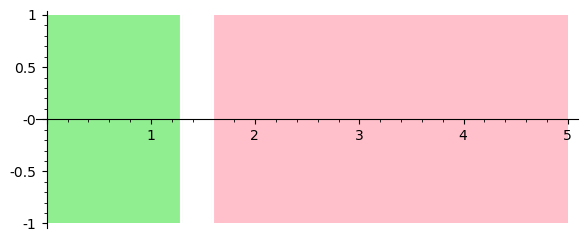

In [112]:
sig = csig.refined_signal(4)
sig.plot()

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 96 flowpipes in 0.38134008200722747 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc7467a0940>, 0, symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2000000000000002], [[0.59999999999999997 .. 1.2000000000000002], [3.0999999999999996 .. 4.2000000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.32 seconds
roots = [[0.72899770431682586 .. 1.2000000000000109]]
domain = [0.0000000000000000 .. 5.2020000000000009]
roots = [[0.72

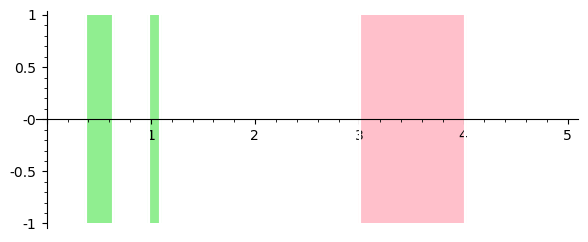

In [113]:
sig = F(RIF(0.1, 0.2), P).signal_for_system(
    s, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
    mask=Mask(RIF(0, 5), [RIF(0.5, 1), RIF(3, 4)]),
)
sig.plot()

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 95 flowpipes in 0.4263168500183383 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc7467a0ee0>, 0, symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.0020000000000007], [[0.0000000000000000 .. 5.0020000000000007]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.66 seconds
roots = [[0.72899770431682586 .. 2.3396961789293478], [2.4054956907643583 .. 2.4223569572167918]]
domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[0.7289

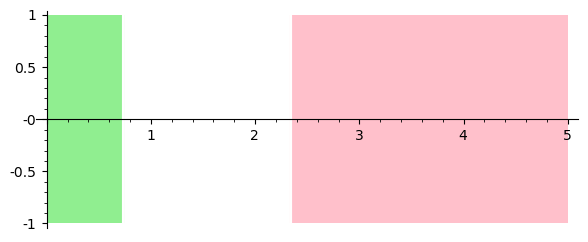

In [115]:
sig = P.signal_for_system(
    s, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
sig.plot()

In [116]:
P

Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fc74ce38640>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <lbuc.reach_trees.ReachT

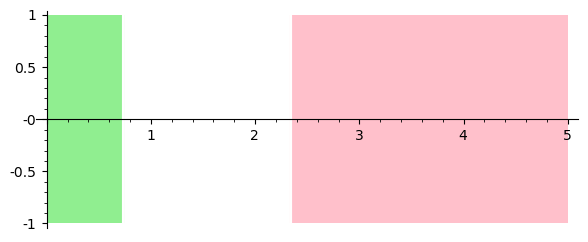

In [117]:
ctx_sig = P.context_signal_for_system(
    s, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

 ==> creating ContextSignal with coord=(0,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fc74ce38640>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fc74ce95a00>
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.

top-level root detection: 1 items in 0.16 seconds
roots = [[1.9494069953384487 .. 2.2661983340704222]]
domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.9494069953384487 .. 2.2661983340704222]]
seg_domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.9494069953384487 .. 2.2661983340704222]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9494069953384488], True), ([2.2661983340704221 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.0000000000000000 .. 5.0000000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000

top-level root detection: 1 items in 0.16 seconds
roots = [[1.1587772868248296 .. 1.9796869398670812]]
domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.1587772868248296 .. 1.9796869398670812]]
seg_domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.1587772868248296 .. 1.9796869398670812]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.1587772868248297], True), ([1.9796869398670811 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.0000000000000000 .. 5.0000000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8705153484842031 .. 2.2286463799981329]]
domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.8705153484842031 .. 2.2286463799981329]]
seg_domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.8705153484842031 .. 2.2286463799981329]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8705153484842032], True), ([2.2286463799981328 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.0000000000000000 .. 5.0000000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000

top-level root detection: 1 items in 0.20 seconds
roots = [[1.0315253521806846 .. 2.1341310578689115]]
domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.0315253521806846 .. 2.1341310578689115]]
seg_domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.0315253521806846 .. 2.1341310578689115]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.0315253521806847], True), ([2.1341310578689114 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.0000000000000000 .. 5.0000000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.0010000000000

top-level root detection: 1 items in 0.16 seconds
roots = [[1.1587772868248296 .. 1.9796869398670812]]
domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.1587772868248296 .. 1.9796869398670812]]
seg_domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.1587772868248296 .. 1.9796869398670812]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.1587772868248297], True), ([1.9796869398670811 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.0000000000000000 .. 5.0000000000000000]])), reach_tree = None, ctx_mask=None


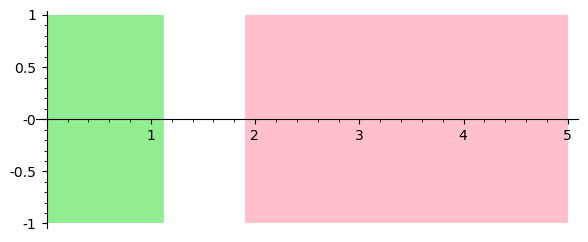

In [118]:
ctx_sig.refined_signal(2).plot()

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fc74b9b9100>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <lbuc.reach_trees.ReachT

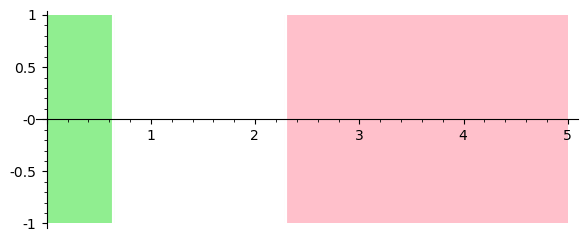

In [119]:
ctx_sig = F(RIF(0.1, 0.2), P).context_signal_for_system(
    s, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

 ==> creating ContextSignal with coord=(0,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fc74b9b9100>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fc74cea42e0>
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.

top-level root detection: 1 items in 0.25 seconds
roots = [[1.0315253521806846 .. 2.1341310578689115]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.0315253521806846 .. 2.1341310578689115]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.0315253521806846 .. 2.1341310578689115]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 0.93152535218068456], True), ([2.0341310578689117 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.93152535218068456], True), ([2.0341310578689117 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.00000000000000

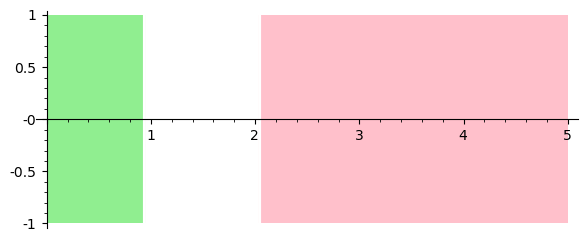

In [120]:
ctx_sig.refined_signal(1).plot()

 ==> creating ContextSignal with coord=(0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fc74b9b9100>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fc744f55f70>
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7938092808537906 .. 2.0598508475266369]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7938092808537906 .. 2.0598508475266369]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.7938092808537906 .. 2.0598508475266369]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6938092808537906], True), ([1.9598508475266369 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6938092808537906], True), ([1.9598508475266369 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000000000

top-level root detection: 1 items in 0.16 seconds
roots = [[1.1923460266102128 .. 1.9796869398670812]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.1923460266102128 .. 1.9796869398670812]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.1923460266102128 .. 1.9796869398670812]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.0923460266102128], True), ([1.8796869398670812 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.0923460266102128], True), ([1.8796869398670812 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000000000

top-level root detection: 1 items in 0.16 seconds
roots = [[1.6591994220215213 .. 1.9975754606800860]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6591994220215213 .. 1.9975754606800860]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.6591994220215213 .. 1.9975754606800860]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5591994220215213], True), ([1.8975754606800860 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5591994220215213], True), ([1.8975754606800860 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000000000

top-level root detection: 1 items in 0.16 seconds
roots = [[1.1587772868248296 .. 1.9796869398670812]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.1587772868248296 .. 1.9796869398670812]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.1587772868248296 .. 1.9796869398670812]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.0587772868248296], True), ([1.8796869398670812 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.0587772868248296], True), ([1.8796869398670812 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000000000

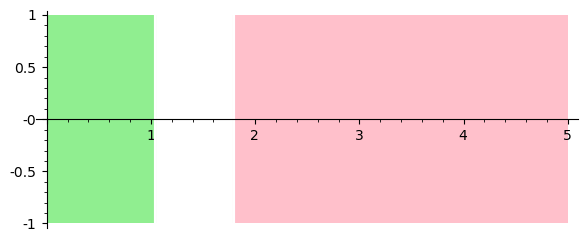

In [121]:
ctx_sig.refined_signal(2).plot()

 ==> creating ContextSignal with coord=(0, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fc74b9b9100>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fc74c0feb50>
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0230384317242866 .. 2.0263467942482989], [2.0279366837973880 .. 2.1904513946812814]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0230384317242866 .. 2.0263467942482989], 
 [2.0279366837973880 .. 2.1904513946812814]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[2.0230384317242866 .. 2.0263467942482989], 
 [2.0279366837973880 .. 2.1904513946812814]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(0, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9279366837973880], True), ([2.0904513946812817 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.92793668

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8453710646460455 .. 1.9796869398670812]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8453710646460455 .. 1.9796869398670812]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.8453710646460455 .. 1.9796869398670812]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7453710646460455], True), ([1.8796869398670812 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7453710646460455], True), ([1.8796869398670812 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.14 seconds
roots = [[1.9724534089065968 .. 1.9796869398670812], [1.9940326001405757 .. 2.1341310578689115]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9724534089065968 .. 1.9796869398670812], 
 [1.9940326001405757 .. 2.1341310578689115]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.9724534089065968 .. 1.9796869398670812], 
 [1.9940326001405757 .. 2.1341310578689115]]
signal given bool roots: 1 items in 0.02 seconds
 ==> creating ContextSignal with coord=(0, 2, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8940326001405757], True), ([2.0341310578689117 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.89403260

top-level root detection: 1 items in 0.15 seconds
roots = [[1.8115091937157896 .. 1.9440443480703609]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8115091937157896 .. 1.9440443480703609]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.8115091937157896 .. 1.9440443480703609]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7115091937157896], True), ([1.8440443480703609 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7115091937157896], True), ([1.8440443480703609 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.16 seconds
roots = [[1.6136025393349557 .. 1.8698203113228507]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6136025393349557 .. 1.8698203113228507]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.6136025393349557 .. 1.8698203113228507]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5136025393349557], True), ([1.7698203113228507 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5136025393349557], True), ([1.7698203113228507 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.14 seconds
roots = [[1.2633883083755312 .. 1.2698898155144596], [1.2905842098463022 .. 1.2922298118416325], [1.3054060191187095 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2633883083755312 .. 1.2698898155144596], 
 [1.2905842098463022 .. 1.2922298118416325], 
 [1.3054060191187095 .. 1.8177271147421941]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.2633883083755312 .. 1.2698898155144596], 
 [1.2905842098463022 .. 1.2922298118416325], 
 [1.3054060191187095 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.1905842098463022], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> crea

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6096225115215880 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6096225115215880 .. 1.8177271147421941]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.6096225115215880 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5096225115215880], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5096225115215880], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.15 seconds
roots = [[1.3343314242940507 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3343314242940507 .. 1.8177271147421941]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.3343314242940507 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.2343314242940507], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.2343314242940507], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.13 seconds
roots = [[1.9223280172237438 .. 2.0869459844172323]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9223280172237438 .. 2.0869459844172323]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.9223280172237438 .. 2.0869459844172323]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8223280172237438], True), ([1.9869459844172323 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8223280172237438], True), ([1.9869459844172323 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7727504331546246 .. 1.9017678109651062]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7727504331546246 .. 1.9017678109651062]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.7727504331546246 .. 1.9017678109651062]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6727504331546246], True), ([1.8017678109651062 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6727504331546246], True), ([1.8017678109651062 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8525831745936158 .. 2.0693195611206559]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8525831745936158 .. 2.0693195611206559]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.8525831745936158 .. 2.0693195611206559]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7525831745936158], True), ([1.9693195611206559 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7525831745936158], True), ([1.9693195611206559 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fc74bb89b80>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2020000000000000], [[0.10000000000000000 .. 5.2020000000000000]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc74b97c2e0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.13 seconds
roots = [[1.7179271009983383 .. 1.8948508409921403]]
domain = [0.

top-level root detection: 1 items in 0.15 seconds
roots = [[1.6802527179342174 .. 1.6838760195976593], [1.6866122067035111 .. 1.8470341471365493]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6802527179342174 .. 1.6838760195976593], 
 [1.6866122067035111 .. 1.8470341471365493]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.6802527179342174 .. 1.6838760195976593], 
 [1.6866122067035111 .. 1.8470341471365493]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 0, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5866122067035112], True), ([1.7470341471365493 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.58661220

top-level root detection: 1 items in 0.14 seconds
roots = [[1.4379229268757689 .. 1.4422565145763576], [1.4503407717912746 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4379229268757689 .. 1.4422565145763576], 
 [1.4503407717912746 .. 1.8177271147421941]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.4379229268757689 .. 1.4422565145763576], 
 [1.4503407717912746 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 1, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.3503407717912746], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.35034077

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6249866739908156 .. 1.6259318225653932], [1.6359259890782864 .. 1.8250467917681823]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6249866739908156 .. 1.6259318225653932], 
 [1.6359259890782864 .. 1.8250467917681823]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.6249866739908156 .. 1.6259318225653932], 
 [1.6359259890782864 .. 1.8250467917681823]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 2, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5359259890782864], True), ([1.7250467917681824 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.53592598

top-level root detection: 1 items in 0.15 seconds
roots = [[1.3693099080908732 .. 1.3735697384688688], [1.3828108980197231 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3693099080908732 .. 1.3735697384688688], 
 [1.3828108980197231 .. 1.8177271147421941]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.3693099080908732 .. 1.3735697384688688], 
 [1.3828108980197231 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 3, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.2828108980197231], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.28281089

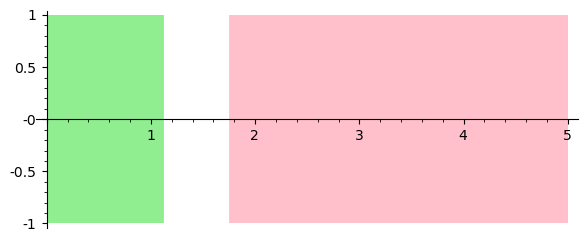

In [122]:
ctx_sig.refined_signal(3).plot()

phi variables sfs = {x1}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Whelk > 1.15000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fc74c4c11c0>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <lbuc.reach_trees.ReachTree object at 0x7fc744f55

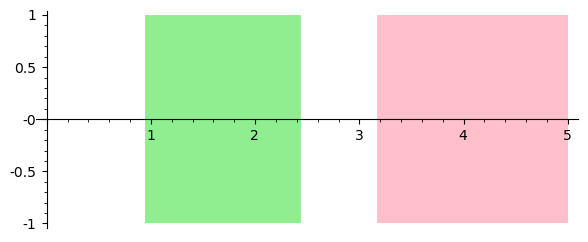

In [124]:
ctx_sig = Atomic(var("Whelk") > 1.15).context_signal_for_system(
    s, 5, order=5, step=(0.01, 0.5),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

In [125]:
prop = (F(RIF(0.1, 0.2), P) & Atomic(var("Whelk") > 1.15))
prop

And([F([0.10000000000000000 .. 0.20000000000000002], Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)), Atomic(Whelk > 1.15000000000000)])

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = <function base_context_signal.<locals>.<lambda> at 0x7fc74ce31dc0>, reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fc74ce8ec10>
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, inst

/usr/lib64/python3.8/site-packages/sage/plot/contour_plot.py:203: UserWarning: No contour levels were found within the data range.
  CS = subplot.contour(self.xy_data_array, contours, cmap=cmap,


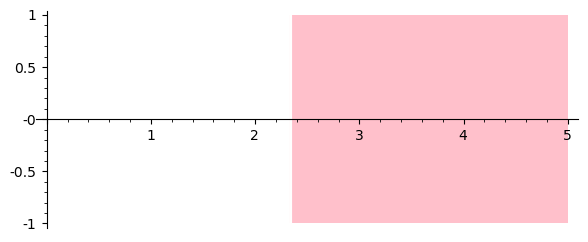

In [126]:
ctx_sig = prop.context_signal_for_system(
    s, 5, order=5, step=(0.01, 0.5),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

 ==> creating ContextSignal with coord=(0,), signal = <function base_context_signal.<locals>.<lambda> at 0x7fc74ce31dc0>, reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fc744f55490>
 ==> creating ContextSignal with coord=(0,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fc744f08e40>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fc74679dc40>
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] 

top-level root detection: 1 items in 0.16 seconds
roots = [[1.5059722083739932 .. 2.2453281791739746]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5059722083739932 .. 2.2453281791739746]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5059722083739932 .. 2.2453281791739746]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4059722083739932], True), ([2.1453281791739748 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4059722083739932], True), ([2.1453281791739748 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal w

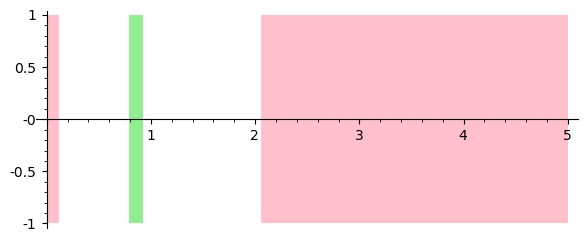

In [127]:
ctx_sig.refined_signal(1).plot()

In [128]:
sig = ctx_sig.refined_signal(2)

 ==> creating ContextSignal with coord=(0, 0), signal = <function base_context_signal.<locals>.<lambda> at 0x7fc74ce31dc0>, reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fc74c4cf190>
 ==> creating ContextSignal with coord=(0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fc744f08e40>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fc7468b81f0>
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.00000000

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8123919211199432 .. 2.0735646940375508]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8123919211199432 .. 2.0735646940375508]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8123919211199432 .. 2.0735646940375508]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7123919211199433], True), ([1.9735646940375508 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7123919211199433], True), ([1.9735646940375508 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSign

top-level root detection: 1 items in 0.16 seconds
roots = [[1.1484310893994829 .. 2.0117314506962068]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.1484310893994829 .. 2.0117314506962068]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.1484310893994829 .. 2.0117314506962068]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.0484310893994829], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.0484310893994829], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSign

top-level root detection: 1 items in 0.19 seconds
roots = [[1.2075578469760097 .. 1.9475741509220326]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2075578469760097 .. 1.9475741509220326]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.2075578469760097 .. 1.9475741509220326]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.1075578469760097], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.1075578469760097], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSign

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7407895833673612 .. 1.7442041432368050], [1.7525481771106843 .. 2.0117314506962068]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7407895833673612 .. 1.7442041432368050], 
 [1.7525481771106843 .. 2.0117314506962068]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7407895833673612 .. 1.7442041432368050], 
 [1.7525481771106843 .. 2.0117314506962068]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6525481771106843], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.65254817711068

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6295523670103906 .. 1.6352295454090771], [1.6639445939962054 .. 1.6681523846319555], [1.6748810749990297 .. 2.0117314506962068]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6295523670103906 .. 1.6352295454090771], 
 [1.6639445939962054 .. 1.6681523846319555], 
 [1.6748810749990297 .. 2.0117314506962068]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6295523670103906 .. 1.6352295454090771], 
 [1.6639445939962054 .. 1.6681523846319555], 
 [1.6748810749990297 .. 2.0117314506962068]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5639445939962054], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creatin

top-level root detection: 1 items in 0.16 seconds
roots = [[1.1484310893994829 .. 1.9475741509220326]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.1484310893994829 .. 1.9475741509220326]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.1484310893994829 .. 1.9475741509220326]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.0484310893994829], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.0484310893994829], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSign

top-level root detection: 1 items in 0.17 seconds
roots = [[1.1484310893994829 .. 1.9475741509220326]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.1484310893994829 .. 1.9475741509220326]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.1484310893994829 .. 1.9475741509220326]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.0484310893994829], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.0484310893994829], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSign

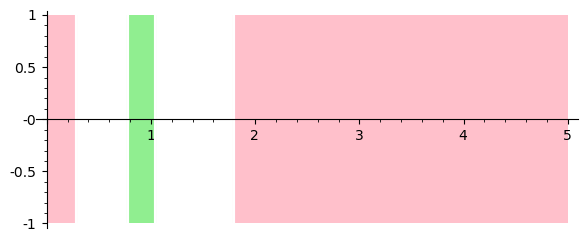

In [129]:
sig.plot()

In [130]:
sig = ctx_sig.refined_signal(3)

 ==> creating ContextSignal with coord=(0, 0, 0), signal = <function base_context_signal.<locals>.<lambda> at 0x7fc74ce31dc0>, reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fc744db0af0>
 ==> creating ContextSignal with coord=(0, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fc744f08e40>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fc74c4e80d0>
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.00

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0235193160008164 .. 2.1794386575298562]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0235193160008164 .. 2.1794386575298562]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0235193160008164 .. 2.1794386575298562]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9235193160008164], True), ([2.0794386575298564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9235193160008164], True), ([2.0794386575298564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.14 seconds
roots = [[1.8591807232686259 .. 2.0007423521234853]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8591807232686259 .. 2.0007423521234853]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8591807232686259 .. 2.0007423521234853]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7591807232686259], True), ([1.9007423521234854 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7591807232686259], True), ([1.9007423521234854 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8498341200410797 .. 1.9758243429895357]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8498341200410797 .. 1.9758243429895357]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8498341200410797 .. 1.9758243429895357]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7498341200410797], True), ([1.8758243429895358 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7498341200410797], True), ([1.8758243429895358 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.14 seconds
roots = [[2.0008215642102094 .. 2.1599348131745489]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0008215642102094 .. 2.1599348131745489]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0008215642102094 .. 2.1599348131745489]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9008215642102094], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9008215642102094], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9880402855112142 .. 2.1433695724374609]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9880402855112142 .. 2.1433695724374609]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9880402855112142 .. 2.1433695724374609]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8880402855112142], True), ([2.0433695724374612 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8880402855112142], True), ([2.0433695724374612 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8328382276305223 .. 1.9518969853062403]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8328382276305223 .. 1.9518969853062403]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8328382276305223 .. 1.9518969853062403]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7328382276305224], True), ([1.8518969853062403 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7328382276305224], True), ([1.8518969853062403 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8218561127536576 .. 1.9467111935052746]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8218561127536576 .. 1.9467111935052746]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8218561127536576 .. 1.9467111935052746]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7218561127536576], True), ([1.8467111935052746 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7218561127536576], True), ([1.8467111935052746 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.15 seconds
roots = [[1.6126275858553422 .. 1.8836031159580114]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6126275858553422 .. 1.8836031159580114]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6126275858553422 .. 1.8836031159580114]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5126275858553422], True), ([1.7836031159580114 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5126275858553422], True), ([1.7836031159580114 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6147555101161423 .. 1.8543469883950377]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6147555101161423 .. 1.8543469883950377]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6147555101161423 .. 1.8543469883950377]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5147555101161423], True), ([1.7543469883950377 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5147555101161423], True), ([1.7543469883950377 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.14 seconds
roots = [[1.2703541244105873 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2703541244105873 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.2703541244105873 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.1703541244105873], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.1703541244105873], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.13 seconds
roots = [[1.2814172985618279 .. 1.2839477104501336], [1.3000614825484806 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2814172985618279 .. 1.2839477104501336], 
 [1.3000614825484806 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.2814172985618279 .. 1.2839477104501336], 
 [1.3000614825484806 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.2000614825484806], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.20006148

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6139351869198472 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6139351869198472 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6139351869198472 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5139351869198472], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5139351869198472], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6107116878676972 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6107116878676972 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6107116878676972 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5107116878676972], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5107116878676972], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.13 seconds
roots = [[1.3082151394723258 .. 1.3146652053999961], [1.3181178645338393 .. 1.8311520467472724]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3082151394723258 .. 1.3146652053999961], 
 [1.3181178645338393 .. 1.8311520467472724]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.3082151394723258 .. 1.3146652053999961], 
 [1.3181178645338393 .. 1.8311520467472724]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.2181178645338394], True), ([1.7311520467472725 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.21811786

top-level root detection: 1 items in 0.16 seconds
roots = [[1.3331507693733841 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3331507693733841 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.3331507693733841 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.2331507693733841], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.2331507693733841], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9594461877156628 .. 2.1088356091213974]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9594461877156628 .. 2.1088356091213974]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9594461877156628 .. 2.1088356091213974]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8594461877156628], True), ([2.0088356091213976 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8594461877156628], True), ([2.0088356091213976 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9266156491171788 .. 2.0852140854249908]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9266156491171788 .. 2.0852140854249908]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9266156491171788 .. 2.0852140854249908]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8266156491171788], True), ([1.9852140854249908 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8266156491171788], True), ([1.9852140854249908 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8020059033213717 .. 1.9206450840741066]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8020059033213717 .. 1.9206450840741066]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8020059033213717 .. 1.9206450840741066]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7020059033213717], True), ([1.8206450840741066 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7020059033213717], True), ([1.8206450840741066 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7751100519314095 .. 1.9036095231399815]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7751100519314095 .. 1.9036095231399815]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7751100519314095 .. 1.9036095231399815]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6751100519314095], True), ([1.8036095231399815 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6751100519314095], True), ([1.8036095231399815 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8853984878563530 .. 1.8892493329455107], [1.8920928607119582 .. 2.0823044804477982]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8853984878563530 .. 1.8892493329455107], 
 [1.8920928607119582 .. 2.0823044804477982]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8853984878563530 .. 1.8892493329455107], 
 [1.8920928607119582 .. 2.0823044804477982]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(2, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7920928607119582], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.79209286

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8596719104127001 .. 2.0810788443518665]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8596719104127001 .. 2.0810788443518665]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8596719104127001 .. 2.0810788443518665]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7596719104127002], True), ([1.9810788443518665 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7596719104127002], True), ([1.9810788443518665 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.14 seconds
roots = [[1.7507713411175740 .. 1.8892493329455107]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7507713411175740 .. 1.8892493329455107]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7507713411175740 .. 1.8892493329455107]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6507713411175740], True), ([1.7892493329455108 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6507713411175740], True), ([1.7892493329455108 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7245773176868535 .. 1.8892493329455107]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7245773176868535 .. 1.8892493329455107]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7245773176868535 .. 1.8892493329455107]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6245773176868535], True), ([1.7892493329455108 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6245773176868535], True), ([1.7892493329455108 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.15 seconds
roots = [[1.6011717885188803 .. 1.8218968493573438]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6011717885188803 .. 1.8218968493573438]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6011717885188803 .. 1.8218968493573438]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5011717885188803], True), ([1.7218968493573438 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5011717885188803], True), ([1.7218968493573438 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5646725931461180 .. 1.8138479289019376]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5646725931461180 .. 1.8138479289019376]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5646725931461180 .. 1.8138479289019376]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4646725931461180], True), ([1.7138479289019377 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4646725931461180], True), ([1.7138479289019377 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.13 seconds
roots = [[1.3113720816283602 .. 1.3146652053999961], [1.3268854501737841 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3113720816283602 .. 1.3146652053999961], 
 [1.3268854501737841 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.3113720816283602 .. 1.3146652053999961], 
 [1.3268854501737841 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.2268854501737841], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.22688545

top-level root detection: 1 items in 0.15 seconds
roots = [[1.2803835961244842 .. 1.2839477104501336], [1.2944805848914044 .. 1.7925293836043255]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2803835961244842 .. 1.2839477104501336], 
 [1.2944805848914044 .. 1.7925293836043255]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.2803835961244842 .. 1.2839477104501336], 
 [1.2944805848914044 .. 1.7925293836043255]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.1944805848914045], True), ([1.6925293836043255 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.19448058

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5495225966363241 .. 1.8091404912144065]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5495225966363241 .. 1.8091404912144065]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5495225966363241 .. 1.8091404912144065]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4495225966363242], True), ([1.7091404912144065 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4495225966363242], True), ([1.7091404912144065 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.17 seconds
roots = [[1.5081597609056387 .. 1.8084476948937676]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5081597609056387 .. 1.8084476948937676]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5081597609056387 .. 1.8084476948937676]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4081597609056387], True), ([1.7084476948937676 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4081597609056387], True), ([1.7084476948937676 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.12 seconds
roots = [[1.2560227150411564 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2560227150411564 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.2560227150411564 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.1560227150411564], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.1560227150411564], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.13 seconds
roots = [[1.2306363555784605 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2306363555784605 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.2306363555784605 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.1306363555784605], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.1306363555784605], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

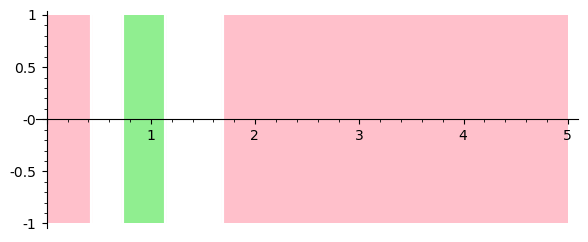

In [131]:
sig.plot()

In [132]:
sig = ctx_sig.refined_signal(4)

 ==> creating ContextSignal with coord=(0, 0, 0, 0), signal = <function base_context_signal.<locals>.<lambda> at 0x7fc74ce31dc0>, reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fc74c3b7a00>
 ==> creating ContextSignal with coord=(0, 0, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fc744f08e40>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fc744d786d0>
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 

top-level root detection: 1 items in 0.10 seconds
roots = [[2.2136442267983711 .. 2.3163133579180047]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.2136442267983711 .. 2.3163133579180047]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.2136442267983711 .. 2.3163133579180047]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.1136442267983711], True), ([2.2163133579180049 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.1136442267983711], True), ([2.2163133579180049 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[2.1120525438718842 .. 2.2010781068192685]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1120525438718842 .. 2.2010781068192685]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1120525438718842 .. 2.2010781068192685]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0120525438718842], True), ([2.1010781068192687 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0120525438718842], True), ([2.1010781068192687 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[2.1031837939149924 .. 2.1884784921354888]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1031837939149924 .. 2.1884784921354888]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1031837939149924 .. 2.1884784921354888]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0031837939149924], True), ([2.0884784921354890 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0031837939149924], True), ([2.0884784921354890 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(0, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.1060646727033210], True), ([2.2000387577206130 .. 2.6187967218133515], False), ([2.8700762786766866 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.1060646727033210], True), ([2.2000387577206130 .. 2.6187967218133515], False), ([2.8700762786766866 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Whelk > 1.15000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.5000000000000

top-level root detection: 1 items in 0.08 seconds
roots = [[2.1953615874556540 .. 2.2842573142784795]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1953615874556540 .. 2.2842573142784795]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1953615874556540 .. 2.2842573142784795]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0953615874556540], True), ([2.1842573142784798 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0953615874556540], True), ([2.1842573142784798 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0930735970601310 .. 2.1754565157503590]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0930735970601310 .. 2.1754565157503590]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0930735970601310 .. 2.1754565157503590]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9930735970601310], True), ([2.0754565157503592 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9930735970601310], True), ([2.0754565157503592 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0815228824970533 .. 2.1622782049808463]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0815228824970533 .. 2.1622782049808463]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0815228824970533 .. 2.1622782049808463]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9815228824970533], True), ([2.0622782049808465 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9815228824970533], True), ([2.0622782049808465 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0052632049156438 .. 2.0845804069335748]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0052632049156438 .. 2.0845804069335748]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0052632049156438 .. 2.0845804069335748]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9052632049156438], True), ([1.9845804069335748 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9052632049156438], True), ([1.9845804069335748 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.9995451258217702 .. 2.0823044804477982]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9995451258217702 .. 2.0823044804477982]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9995451258217702 .. 2.0823044804477982]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8995451258217702], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8995451258217702], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9177336507352658 .. 1.9904171914366447]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9177336507352658 .. 1.9904171914366447]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9177336507352658 .. 1.9904171914366447]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8177336507352658], True), ([1.8904171914366447 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8177336507352658], True), ([1.8904171914366447 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.9120813334625683 .. 1.9806069685572048]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9120813334625683 .. 1.9806069685572048]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9120813334625683 .. 1.9806069685572048]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8120813334625683], True), ([1.8806069685572048 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8120813334625683], True), ([1.8806069685572048 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9935692377407570 .. 2.0766977299734318]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9935692377407570 .. 2.0766977299734318]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9935692377407570 .. 2.0766977299734318]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8935692377407570], True), ([1.9766977299734318 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8935692377407570], True), ([1.9766977299734318 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.9874210569513754 .. 2.0640233314827277]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9874210569513754 .. 2.0640233314827277]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9874210569513754 .. 2.0640233314827277]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8874210569513755], True), ([1.9640233314827277 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8874210569513755], True), ([1.9640233314827277 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9053767917636477 .. 1.9711911527484616]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9053767917636477 .. 1.9711911527484616]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9053767917636477 .. 1.9711911527484616]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8053767917636477], True), ([1.8711911527484617 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8053767917636477], True), ([1.8711911527484617 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8977288956678759 .. 1.9612143370915037]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8977288956678759 .. 1.9612143370915037]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8977288956678759 .. 1.9612143370915037]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7977288956678759], True), ([1.8612143370915037 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7977288956678759], True), ([1.8612143370915037 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.08 seconds
roots = [[2.1819621704564662 .. 2.2683759523692833]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1819621704564662 .. 2.2683759523692833]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1819621704564662 .. 2.2683759523692833]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0819621704564662], True), ([2.1683759523692835 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0819621704564662], True), ([2.1683759523692835 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[2.1675274448203842 .. 2.2525903878816110]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1675274448203842 .. 2.2525903878816110]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1675274448203842 .. 2.2525903878816110]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0675274448203842], True), ([2.1525903878816112 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0675274448203842], True), ([2.1525903878816112 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0726398586411654 .. 2.1599348131745489]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0726398586411654 .. 2.1599348131745489]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0726398586411654 .. 2.1599348131745489]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9726398586411654], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9726398586411654], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.08 seconds
roots = [[2.0631403230311078 .. 2.1498086321112715]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0631403230311078 .. 2.1498086321112715]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0631403230311078 .. 2.1498086321112715]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9631403230311078], True), ([2.0498086321112718 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9631403230311078], True), ([2.0498086321112718 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[2.1547548811945107 .. 2.2453281791739746]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1547548811945107 .. 2.2453281791739746]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1547548811945107 .. 2.2453281791739746]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0547548811945107], True), ([2.1453281791739748 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0547548811945107], True), ([2.1453281791739748 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.08 seconds
roots = [[2.1427013508955945 .. 2.2391547961770196]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1427013508955945 .. 2.2391547961770196]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1427013508955945 .. 2.2391547961770196]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0427013508955945], True), ([2.1391547961770198 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0427013508955945], True), ([2.1391547961770198 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.08 seconds
roots = [[2.0547372895319497 .. 2.1344395593968644]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0547372895319497 .. 2.1344395593968644]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0547372895319497 .. 2.1344395593968644]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9547372895319497], True), ([2.0344395593968647 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9547372895319497], True), ([2.0344395593968647 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0453079343671229 .. 2.1193188998600415]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0453079343671229 .. 2.1193188998600415]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0453079343671229 .. 2.1193188998600415]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9453079343671230], True), ([2.0193188998600417 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9453079343671230], True), ([2.0193188998600417 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9805999666569245 .. 2.0511677869153915]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9805999666569245 .. 2.0511677869153915]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9805999666569245 .. 2.0511677869153915]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8805999666569245], True), ([1.9511677869153916 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8805999666569245], True), ([1.9511677869153916 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9707420385997294 .. 2.0387966073100921]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9707420385997294 .. 2.0387966073100921]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9707420385997294 .. 2.0387966073100921]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8707420385997294], True), ([1.9387966073100921 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8707420385997294], True), ([1.9387966073100921 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8889529153681785 .. 1.9510825263757264]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8889529153681785 .. 1.9510825263757264]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8889529153681785 .. 1.9510825263757264]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7889529153681785], True), ([1.8510825263757264 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7889529153681785], True), ([1.8510825263757264 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8817657439475907 .. 1.9475741509220326]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8817657439475907 .. 1.9475741509220326]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8817657439475907 .. 1.9475741509220326]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7817657439475907], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7817657439475907], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9597786822984988 .. 2.0262885281135992]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9597786822984988 .. 2.0262885281135992]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9597786822984988 .. 2.0262885281135992]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8597786822984988], True), ([1.9262885281135992 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8597786822984988], True), ([1.9262885281135992 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.9081785100476402 .. 1.9698531286137531]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9081785100476402 .. 1.9698531286137531]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9081785100476402 .. 1.9698531286137531]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8081785100476402], True), ([1.8698531286137531 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8081785100476402], True), ([1.8698531286137531 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8341958382992074 .. 1.8894691168147460]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8341958382992074 .. 1.8894691168147460]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8341958382992074 .. 1.8894691168147460]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7341958382992074], True), ([1.7894691168147460 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7341958382992074], True), ([1.7894691168147460 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.14 seconds
roots = [[1.8266592513607708 .. 1.8878908049417334]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8266592513607708 .. 1.8878908049417334]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8266592513607708 .. 1.8878908049417334]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7266592513607709], True), ([1.7878908049417334 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7266592513607709], True), ([1.7878908049417334 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7750604748208018 .. 1.8680827828503033]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7750604748208018 .. 1.8680827828503033]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7750604748208018 .. 1.8680827828503033]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6750604748208018], True), ([1.7680827828503034 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6750604748208018], True), ([1.7680827828503034 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7729327705006039 .. 1.8600514589579725]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7729327705006039 .. 1.8600514589579725]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7729327705006039 .. 1.8600514589579725]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6729327705006039], True), ([1.7600514589579725 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6729327705006039], True), ([1.7600514589579725 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6740191231510324 .. 1.8114448754091988]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6740191231510324 .. 1.8114448754091988]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6740191231510324 .. 1.8114448754091988]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5740191231510324], True), ([1.7114448754091988 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5740191231510324], True), ([1.7114448754091988 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6735241233531128 .. 1.8031698232827283]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6735241233531128 .. 1.8031698232827283]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6735241233531128 .. 1.8031698232827283]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5735241233531128], True), ([1.7031698232827283 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5735241233531128], True), ([1.7031698232827283 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7700627540864799 .. 1.8518012482376263]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7700627540864799 .. 1.8518012482376263]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7700627540864799 .. 1.8518012482376263]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6700627540864799], True), ([1.7518012482376263 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6700627540864799], True), ([1.7518012482376263 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7665338956811849 .. 1.8434115465999697]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7665338956811849 .. 1.8434115465999697]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7665338956811849 .. 1.8434115465999697]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6665338956811849], True), ([1.7434115465999697 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6665338956811849], True), ([1.7434115465999697 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6679344271162248 .. 1.6681523846319555], [1.6718788617668260 .. 1.7949173328188013]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6679344271162248 .. 1.6681523846319555], 
 [1.6718788617668260 .. 1.7949173328188013]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6679344271162248 .. 1.6681523846319555], 
 [1.6718788617668260 .. 1.7949173328188013]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5718788617668261], True), ([1.6949173328188014 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.57

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6661241228441223 .. 1.6681523846319555], [1.6692420535773644 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6661241228441223 .. 1.6681523846319555], 
 [1.6692420535773644 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6661241228441223 .. 1.6681523846319555], 
 [1.6692420535773644 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5692420535773644], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.56

top-level root detection: 1 items in 0.14 seconds
roots = [[1.5533984545993964 .. 1.7752123481025577]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5533984545993964 .. 1.7752123481025577]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5533984545993964 .. 1.7752123481025577]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4533984545993964], True), ([1.6752123481025578 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4533984545993964], True), ([1.6752123481025578 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5552970570800650 .. 1.7652129281908587]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5552970570800650 .. 1.7652129281908587]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5552970570800650 .. 1.7652129281908587]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4552970570800650], True), ([1.6652129281908587 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4552970570800650], True), ([1.6652129281908587 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.14 seconds
roots = [[1.4165916517309211 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4165916517309211 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4165916517309211 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3165916517309211], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3165916517309211], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4205079861028837 .. 1.4265076045124459], [1.4331392547214536 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4205079861028837 .. 1.4265076045124459], 
 [1.4331392547214536 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4205079861028837 .. 1.4265076045124459], 
 [1.4331392547214536 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3331392547214536], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.33

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5564585133732582 .. 1.7557704541454558]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5564585133732582 .. 1.7557704541454558]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5564585133732582 .. 1.7557704541454558]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4564585133732582], True), ([1.6557704541454558 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4564585133732582], True), ([1.6557704541454558 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5569623526041218 .. 1.7468047425644145]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5569623526041218 .. 1.7468047425644145]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5569623526041218 .. 1.7468047425644145]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4569623526041218], True), ([1.6468047425644145 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4569623526041218], True), ([1.6468047425644145 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4238491057700735 .. 1.4265076045124459], [1.4404907870918532 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4238491057700735 .. 1.4265076045124459], 
 [1.4404907870918532 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4238491057700735 .. 1.4265076045124459], 
 [1.4404907870918532 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3404907870918533], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.34

top-level root detection: 1 items in 0.12 seconds
roots = [[1.4459507455024536 .. 1.7329286890478282]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4459507455024536 .. 1.7329286890478282]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4459507455024536 .. 1.7329286890478282]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3459507455024536], True), ([1.6329286890478282 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3459507455024536], True), ([1.6329286890478282 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7611236200496793 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7611236200496793 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7611236200496793 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6611236200496793], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6611236200496793], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7549073472100242 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7549073472100242 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7549073472100242 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6549073472100242], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6549073472100242], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6635626385971369 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6635626385971369 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6635626385971369 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5635626385971369], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5635626385971369], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6609355145735298 .. 1.7840026318696148]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6609355145735298 .. 1.7840026318696148]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6609355145735298 .. 1.7840026318696148]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5609355145735298], True), ([1.6840026318696148 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5609355145735298], True), ([1.6840026318696148 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7481103728417779 .. 1.8269707891009746]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7481103728417779 .. 1.8269707891009746]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7481103728417779 .. 1.8269707891009746]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6481103728417779], True), ([1.7269707891009746 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6481103728417779], True), ([1.7269707891009746 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.7402660885626619 .. 1.8175081041591273]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7402660885626619 .. 1.8175081041591273]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7402660885626619 .. 1.8175081041591273]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6402660885626619], True), ([1.7175081041591273 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6402660885626619], True), ([1.7175081041591273 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6578526285845538 .. 1.7747752183819097]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6578526285845538 .. 1.7747752183819097]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6578526285845538 .. 1.7747752183819097]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5578526285845538], True), ([1.6747752183819097 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5578526285845538], True), ([1.6747752183819097 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6543723876340310 .. 1.7657960634598189]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6543723876340310 .. 1.7657960634598189]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6543723876340310 .. 1.7657960634598189]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5543723876340310], True), ([1.6657960634598190 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5543723876340310], True), ([1.6657960634598190 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5568800062557406 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5568800062557406 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5568800062557406 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4568800062557406], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4568800062557406], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.14 seconds
roots = [[1.5562759157706378 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5562759157706378 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5562759157706378 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4562759157706378], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4562759157706378], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4493999463203517 .. 1.7217941998116573]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4493999463203517 .. 1.7217941998116573]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4493999463203517 .. 1.7217941998116573]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3493999463203517], True), ([1.6217941998116573 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3493999463203517], True), ([1.6217941998116573 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.4506636437435393 .. 1.7119061260415305]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4506636437435393 .. 1.7119061260415305]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4506636437435393 .. 1.7119061260415305]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3506636437435394], True), ([1.6119061260415306 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3506636437435394], True), ([1.6119061260415306 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5552084001677954 .. 1.7405761834498730]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5552084001677954 .. 1.7405761834498730]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5552084001677954 .. 1.7405761834498730]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4552084001677955], True), ([1.6405761834498731 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4552084001677955], True), ([1.6405761834498731 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5537303155126231 .. 1.7315091590816299]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5537303155126231 .. 1.7315091590816299]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5537303155126231 .. 1.7315091590816299]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4537303155126232], True), ([1.6315091590816299 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4537303155126232], True), ([1.6315091590816299 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.14 seconds
roots = [[1.4514868167174521 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4514868167174521 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4514868167174521 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3514868167174521], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3514868167174521], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.4519151278224928 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4519151278224928 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4519151278224928 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3519151278224928], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3519151278224928], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x1)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2020000000000000], [[0.0000000000000000 .. 2.0599348131745492]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc74c101190>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.35002831233524195 .. 0.42745328580442710]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.35002831233524195 .. 0.42745328580442710]]
seg_domain = [0.0000000000000000 .. 2.0599348131745492]
roots = [[0.35002831233524195 .. 0.42745328580442710]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal wit

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x1)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2020000000000000], [[0.0000000000000000 .. 2.0582336270578039]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc74c1016d0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.33900594280022683 .. 0.41320460089339190]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.33900594280022683 .. 0.41320460089339190]]
seg_domain = [0.0000000000000000 .. 2.0582336270578039]
roots = [[0.33900594280022683 .. 0.41320460089339190]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal wit

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9840335687001413 .. 2.0580509009583743]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9840335687001413 .. 2.0580509009583743]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9840335687001413 .. 2.0580509009583743]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8840335687001413], True), ([1.9580509009583744 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8840335687001413], True), ([1.9580509009583744 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.9708839193606733 .. 2.0459509976652353]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9708839193606733 .. 2.0459509976652353]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9708839193606733 .. 2.0459509976652353]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8708839193606733], True), ([1.9459509976652353 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8708839193606733], True), ([1.9459509976652353 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.08 seconds
roots = [[2.0505459291587593 .. 2.1441135009395965]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0505459291587593 .. 2.1441135009395965]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0505459291587593 .. 2.1441135009395965]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9505459291587593], True), ([2.0441135009395967 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9505459291587593], True), ([2.0441135009395967 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0344511704449614 .. 2.1303770184004254]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0344511704449614 .. 2.1303770184004254]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0344511704449614 .. 2.1303770184004254]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9344511704449614], True), ([2.0303770184004257 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9344511704449614], True), ([2.0303770184004257 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9551739704602044 .. 2.0344523421154022]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9551739704602044 .. 2.0344523421154022]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9551739704602044 .. 2.0344523421154022]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8551739704602044], True), ([1.9344523421154022 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8551739704602044], True), ([1.9344523421154022 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.9400682021847610 .. 2.0229478586012238]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9400682021847610 .. 2.0229478586012238]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9400682021847610 .. 2.0229478586012238]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8400682021847610], True), ([1.9229478586012238 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8400682021847610], True), ([1.9229478586012238 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7442041432367887 .. 1.7880244422424563], [1.8953627679467155 .. 1.9581447743880567]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7442041432367887 .. 1.7880244422424563], 
 [1.8953627679467155 .. 1.9581447743880567]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7442041432367887 .. 1.7880244422424563], 
 [1.8953627679467155 .. 1.9581447743880567]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7953627679467155], True), ([1.8581447743880568 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.79

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8830226542729502 .. 1.9481921653205461]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8830226542729502 .. 1.9481921653205461]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8830226542729502 .. 1.9481921653205461]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7830226542729502], True), ([1.8481921653205461 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7830226542729502], True), ([1.8481921653205461 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8184585312424605 .. 1.8773597614322455]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8184585312424605 .. 1.8773597614322455]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8184585312424605 .. 1.8773597614322455]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7184585312424606], True), ([1.7773597614322456 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7184585312424606], True), ([1.7773597614322456 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8095938558590765 .. 1.8685851546863326]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8095938558590765 .. 1.8685851546863326]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8095938558590765 .. 1.8685851546863326]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7095938558590765], True), ([1.7685851546863327 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7095938558590765], True), ([1.7685851546863327 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8725276964523671 .. 1.9475741509220326]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8725276964523671 .. 1.9475741509220326]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8725276964523671 .. 1.9475741509220326]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7725276964523671], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7725276964523671], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8629286582905688 .. 1.9392147645537246]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8629286582905688 .. 1.9392147645537246]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8629286582905688 .. 1.9392147645537246]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7629286582905688], True), ([1.8392147645537246 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7629286582905688], True), ([1.8392147645537246 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7982878092701697 .. 1.8599344346754983]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7982878092701697 .. 1.8599344346754983]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7982878092701697 .. 1.8599344346754983]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6982878092701697], True), ([1.7599344346754983 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6982878092701697], True), ([1.7599344346754983 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7861234195991568 .. 1.8514498504638566]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7861234195991568 .. 1.8514498504638566]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7861234195991568 .. 1.8514498504638566]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6861234195991568], True), ([1.7514498504638567 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6861234195991568], True), ([1.7514498504638567 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0156842118080939 .. 2.1170248673666432]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0156842118080939 .. 2.1170248673666432]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0156842118080939 .. 2.1170248673666432]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9156842118080939], True), ([2.0170248673666435 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9156842118080939], True), ([2.0170248673666435 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9986455271439251 .. 2.1040591489415839]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9986455271439251 .. 2.1040591489415839]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9986455271439251 .. 2.1040591489415839]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8986455271439251], True), ([2.0040591489415842 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8986455271439251], True), ([2.0040591489415842 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9282007641319816 .. 2.0117314506962068]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9282007641319816 .. 2.0117314506962068]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9282007641319816 .. 2.0117314506962068]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8282007641319816], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8282007641319816], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9167218147062987 .. 2.0117314506962068]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9167218147062987 .. 2.0117314506962068]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9167218147062987 .. 2.0117314506962068]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8167218147062987], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8167218147062987], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9864522384314140 .. 2.0914772029838438]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9864522384314140 .. 2.0914772029838438]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9864522384314140 .. 2.0914772029838438]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8864522384314140], True), ([1.9914772029838438 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8864522384314140], True), ([1.9914772029838438 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9712072252128061 .. 2.0823044804477982]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9712072252128061 .. 2.0823044804477982]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9712072252128061 .. 2.0823044804477982]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8712072252128061], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8712072252128061], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9001498549665685 .. 2.0057196413544958]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9001498549665685 .. 2.0057196413544958]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9001498549665685 .. 2.0057196413544958]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8001498549665685], True), ([1.9057196413544958 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8001498549665685], True), ([1.9057196413544958 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8823806927199895 .. 1.9947627061730700]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8823806927199895 .. 1.9947627061730700]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8823806927199895 .. 1.9947627061730700]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7823806927199895], True), ([1.8947627061730700 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7823806927199895], True), ([1.8947627061730700 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.15 seconds
roots = [[1.8492992616245729 .. 1.9291133505284579]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8492992616245729 .. 1.9291133505284579]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8492992616245729 .. 1.9291133505284579]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7492992616245729], True), ([1.8291133505284580 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7492992616245729], True), ([1.8291133505284580 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8340392497212547 .. 1.9190080726183843]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8340392497212547 .. 1.9190080726183843]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8340392497212547 .. 1.9190080726183843]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7340392497212547], True), ([1.8190080726183843 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7340392497212547], True), ([1.8190080726183843 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7763935668223231 .. 1.8431685291788185]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7763935668223231 .. 1.8431685291788185]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7763935668223231 .. 1.8431685291788185]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6763935668223232], True), ([1.7431685291788185 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6763935668223232], True), ([1.7431685291788185 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7678119128832854 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7678119128832854 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7678119128832854 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6678119128832854], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6678119128832854], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8227942622039938 .. 1.9099515859239858]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8227942622039938 .. 1.9099515859239858]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8227942622039938 .. 1.9099515859239858]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7227942622039938], True), ([1.8099515859239858 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7227942622039938], True), ([1.8099515859239858 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8128881788533908 .. 1.9009270171371997]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8128881788533908 .. 1.9009270171371997]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8128881788533908 .. 1.9009270171371997]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7128881788533908], True), ([1.8009270171371998 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7128881788533908], True), ([1.8009270171371998 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7564646694540941 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7564646694540941 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7564646694540941 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6564646694540941], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6564646694540941], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7425911832653806 .. 1.8302912028815970]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7425911832653806 .. 1.8302912028815970]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7425911832653806 .. 1.8302912028815970]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6425911832653806], True), ([1.7302912028815971 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6425911832653806], True), ([1.7302912028815971 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7340349642257266 .. 1.8100048093059394]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7340349642257266 .. 1.8100048093059394]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7340349642257266 .. 1.8100048093059394]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6340349642257266], True), ([1.7100048093059394 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6340349642257266], True), ([1.7100048093059394 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7269020812178184 .. 1.8030139754701995]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7269020812178184 .. 1.8030139754701995]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7269020812178184 .. 1.8030139754701995]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6269020812178184], True), ([1.7030139754701996 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6269020812178184], True), ([1.7030139754701996 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6350792044245605 .. 1.6352295454090771], [1.6491031219484584 .. 1.7596045876659037]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6350792044245605 .. 1.6352295454090771], 
 [1.6491031219484584 .. 1.7596045876659037]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6350792044245605 .. 1.6352295454090771], 
 [1.6491031219484584 .. 1.7596045876659037]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5491031219484584], True), ([1.6596045876659037 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.54

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6274937809894272 .. 1.6352295454090771], [1.6399129984542939 .. 1.7544716881679135]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6274937809894272 .. 1.6352295454090771], 
 [1.6399129984542939 .. 1.7544716881679135]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6274937809894272 .. 1.6352295454090771], 
 [1.6399129984542939 .. 1.7544716881679135]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5399129984542939], True), ([1.6544716881679135 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.53

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7178018025952015 .. 1.7961518774914838]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7178018025952015 .. 1.7961518774914838]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7178018025952015 .. 1.7961518774914838]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6178018025952015], True), ([1.6961518774914838 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6178018025952015], True), ([1.6961518774914838 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7072521104255675 .. 1.7894676115970592]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7072521104255675 .. 1.7894676115970592]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7072521104255675 .. 1.7894676115970592]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6072521104255675], True), ([1.6894676115970592 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6072521104255675], True), ([1.6894676115970592 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6204040941580510 .. 1.7495593708002922]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6204040941580510 .. 1.7495593708002922]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6204040941580510 .. 1.7495593708002922]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5204040941580511], True), ([1.6495593708002922 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5204040941580511], True), ([1.6495593708002922 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6139991457410818 .. 1.7449419974868610]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6139991457410818 .. 1.7449419974868610]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6139991457410818 .. 1.7449419974868610]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5139991457410818], True), ([1.6449419974868610 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5139991457410818], True), ([1.6449419974868610 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5506451272805379 .. 1.7263213135002987]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5506451272805379 .. 1.7263213135002987]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5506451272805379 .. 1.7263213135002987]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4506451272805379], True), ([1.6263213135002987 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4506451272805379], True), ([1.6263213135002987 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5427817165447432 .. 1.7237206763704190]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5427817165447432 .. 1.7237206763704190]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5427817165447432 .. 1.7237206763704190]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4427817165447432], True), ([1.6237206763704190 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4427817165447432], True), ([1.6237206763704190 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.4500924052981107 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4500924052981107 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4500924052981107 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3500924052981107], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3500924052981107], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4408789563163961 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4408789563163961 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4408789563163961 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3408789563163961], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3408789563163961], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5318014882176782 .. 1.7215045745849214]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5318014882176782 .. 1.7215045745849214]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5318014882176782 .. 1.7215045745849214]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4318014882176782], True), ([1.6215045745849214 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4318014882176782], True), ([1.6215045745849214 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5141078937645737 .. 1.7198765055532295]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5141078937645737 .. 1.7198765055532295]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5141078937645737 .. 1.7198765055532295]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4141078937645737], True), ([1.6198765055532295 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4141078937645737], True), ([1.6198765055532295 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.14 seconds
roots = [[1.4207325719233503 .. 1.4265076045124459], [1.4286730810801833 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4207325719233503 .. 1.4265076045124459], 
 [1.4286730810801833 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4207325719233503 .. 1.4265076045124459], 
 [1.4286730810801833 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3286730810801833], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.32

top-level root detection: 1 items in 0.12 seconds
roots = [[1.4151905814913618 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4151905814913618 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4151905814913618 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3151905814913619], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3151905814913619], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6963844553824798 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6963844553824798 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6963844553824798 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5963844553824798], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5963844553824798], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.6887206194600767 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6887206194600767 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6887206194600767 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5887206194600767], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5887206194600767], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6073257130143250 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6073257130143250 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6073257130143250 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5073257130143250], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5073257130143250], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5966706760379578 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5966706760379578 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5966706760379578 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4966706760379578], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4966706760379578], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.6786172623386839 .. 1.7826997112358459]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6786172623386839 .. 1.7826997112358459]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6786172623386839 .. 1.7826997112358459]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5786172623386839], True), ([1.6826997112358459 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5786172623386839], True), ([1.6826997112358459 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6648429890189730 .. 1.7773307950466975]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6648429890189730 .. 1.7773307950466975]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6648429890189730 .. 1.7773307950466975]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5648429890189731], True), ([1.6773307950466975 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5648429890189731], True), ([1.6773307950466975 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5834657813646069 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5834657813646069 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5834657813646069 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4834657813646069], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4834657813646069], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5662942838887132 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5662942838887132 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5662942838887132 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4662942838887132], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4662942838887132], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5080037737387490 .. 1.7189542734535573], [1.7442041432367887 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5080037737387490 .. 1.7189542734535573], 
 [1.7442041432367887 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5080037737387490 .. 1.7189542734535573], 
 [1.7442041432367887 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4080037737387490], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.40

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5015917925178818 .. 1.7188732490202463]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5015917925178818 .. 1.7188732490202463]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5015917925178818 .. 1.7188732490202463]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4015917925178818], True), ([1.6188732490202464 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4015917925178818], True), ([1.6188732490202464 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.4093050002158336 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4093050002158336 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4093050002158336 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3093050002158336], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3093050002158336], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.15 seconds
roots = [[1.3838319739655555 .. 1.3856226187341787], [1.3982253908024693 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3838319739655555 .. 1.3856226187341787], 
 [1.3982253908024693 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.3838319739655555 .. 1.3856226187341787], 
 [1.3982253908024693 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.02 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.2982253908024693], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.29

top-level root detection: 1 items in 0.11 seconds
roots = [[1.4933529938508480 .. 1.7197967743304570]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4933529938508480 .. 1.7197967743304570]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4933529938508480 .. 1.7197967743304570]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3933529938508480], True), ([1.6197967743304571 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3933529938508480], True), ([1.6197967743304571 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4679216602482452 .. 1.4714810888685397], [1.4775968676704769 .. 1.7219334646958649]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4679216602482452 .. 1.4714810888685397], 
 [1.4775968676704769 .. 1.7219334646958649]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4679216602482452 .. 1.4714810888685397], 
 [1.4775968676704769 .. 1.7219334646958649]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3775968676704769], True), ([1.6219334646958649 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.37

top-level root detection: 1 items in 0.12 seconds
roots = [[1.3766119431524443 .. 1.7103317076621217]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3766119431524443 .. 1.7103317076621217]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.3766119431524443 .. 1.7103317076621217]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.2766119431524444], True), ([1.6103317076621217 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.2766119431524444], True), ([1.6103317076621217 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.3695223464969725 .. 1.7208479721643737]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3695223464969725 .. 1.7208479721643737]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.3695223464969725 .. 1.7208479721643737]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.2695223464969725], True), ([1.6208479721643738 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.2695223464969725], True), ([1.6208479721643738 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

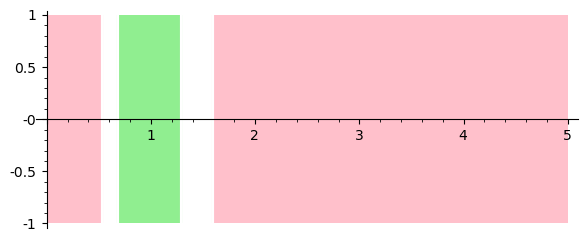

In [133]:
sig.plot()

In [134]:
sig = ctx_sig.refined_signal(5)

 ==> creating ContextSignal with coord=(0, 0, 0, 0, 0), signal = <function base_context_signal.<locals>.<lambda> at 0x7fc74ce31dc0>, reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fc7434d8850>
 ==> creating ContextSignal with coord=(0, 0, 0, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fc744f08e40>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fc744dae430>
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.00000

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.4020000000000002], [[0.10000000000000000 .. 5.4020000000000002]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc7434bec10>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.10 seconds
roots = [[2.2613603984804013 .. 2.3146223034165617]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.2613603984804013 .. 2.3146223034165617]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.2613603984804013 .. 2.3146223034165617]]
si

top-level root detection: 1 items in 0.08 seconds
roots = [[2.1771134472891651 .. 2.2284723674342631]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1771134472891651 .. 2.2284723674342631]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1771134472891651 .. 2.2284723674342631]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0771134472891651], True), ([2.1284723674342633 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0771134472891651], True), ([2.1284723674342633 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.1734643841554892 .. 2.2227418972938918]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1734643841554892 .. 2.2227418972938918]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1734643841554892 .. 2.2227418972938918]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0734643841554892], True), ([2.1227418972938920 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0734643841554892], True), ([2.1227418972938920 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.08 seconds
roots = [[2.2247787095960247 .. 2.2736987020202846]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.2247787095960247 .. 2.2736987020202846]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.2247787095960247 .. 2.2736987020202846]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.1247787095960247], True), ([2.1736987020202849 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.1247787095960247], True), ([2.1736987020202849 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.08 seconds
roots = [[2.1986464407009762 .. 2.2453281791739746]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1986464407009762 .. 2.2453281791739746]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1986464407009762 .. 2.2453281791739746]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0986464407009762], True), ([2.1453281791739748 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0986464407009762], True), ([2.1453281791739748 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.1656698103007259 .. 2.2108742797214927]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1656698103007259 .. 2.2108742797214927]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1656698103007259 .. 2.2108742797214927]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0656698103007259], True), ([2.1108742797214929 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0656698103007259], True), ([2.1108742797214929 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.1232579924504886 .. 2.1646429179332239]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1232579924504886 .. 2.1646429179332239]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1232579924504886 .. 2.1646429179332239]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0232579924504886], True), ([2.0646429179332241 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0232579924504886], True), ([2.0646429179332241 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[2.1195432178746873 .. 2.1599348131745489]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1195432178746873 .. 2.1599348131745489]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1195432178746873 .. 2.1599348131745489]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0195432178746873], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0195432178746873], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0676245987268164 .. 2.1114062973603880]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0676245987268164 .. 2.1114062973603880]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0676245987268164 .. 2.1114062973603880]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9676245987268164], True), ([2.0114062973603883 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9676245987268164], True), ([2.0114062973603883 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0641210858813949 .. 2.1066017059763285]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0641210858813949 .. 2.1066017059763285]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0641210858813949 .. 2.1066017059763285]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9641210858813949], True), ([2.0066017059763288 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9641210858813949], True), ([2.0066017059763288 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[2.1148563542050817 .. 2.1599348131745489]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1148563542050817 .. 2.1599348131745489]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1148563542050817 .. 2.1599348131745489]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0148563542050817], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0148563542050817], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.4020000000000002], [[0.10000000000000000 .. 5.4020000000000002]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc743409eb0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.09 seconds
roots = [[2.0885522396601245 .. 2.1313731433973220]]
domain = [0.

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0816253818674224 .. 2.0823044804477982], [2.0847311616562995 .. 2.1258841931322770]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0816253818674224 .. 2.0823044804477982], 
 [2.0847311616562995 .. 2.1258841931322770]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0816253818674224 .. 2.0823044804477982], 
 [2.0847311616562995 .. 2.1258841931322770]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(0, 0, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9847311616562995], True), ([2.0258841931322773 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(0, 0, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.1474966352441692], True), ([2.1940744342183444 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.1474966352441692], True), ([2.1940744342183444 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Whelk > 1.15000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000

top-level root detection: 1 items in 0.07 seconds
roots = [[2.2382743195822278 .. 2.2876881831909342]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.2382743195822278 .. 2.2876881831909342]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.2382743195822278 .. 2.2876881831909342]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.1382743195822279], True), ([2.1876881831909344 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.1382743195822279], True), ([2.1876881831909344 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc7433e56d0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.09 seconds
roots = [[2.1575940387960650 .. 2.1599348131745489], [2.1610550299890669 .. 2.2042730989676689]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1575940387960650 .. 2.1599348131745489], 
 [2.1610550299890669 .. 2.2042730989676689]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1575940387960650 .. 2.1599348131745489], 
 [2.1610550299890669 .. 2.2042730989676689]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(0, 0, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0610550299890669], True), ([2.1042730989676692 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000

fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc7433e5c10>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.11 seconds
roots = [[2.1528425954795742 .. 2.1984675320758731]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1528425954795742 .. 2.1984675320758731]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1528425954795742 .. 2.1984675320758731]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0528425954795742], True), ([2.0984675320758734 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000],

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.4020000000000002], [[0.10000000000000000 .. 5.4020000000000002]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc74338a190>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.09 seconds
roots = [[2.2062653567235588 .. 2.2476762254042222]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.2062653567235588 .. 2.2476762254042222]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.2062653567235588 .. 2.2476762254042222]]
si

top-level root detection: 1 items in 0.08 seconds
roots = [[2.2010388617816940 .. 2.2453281791739746]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.2010388617816940 .. 2.2453281791739746]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.2010388617816940 .. 2.2453281791739746]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.1010388617816940], True), ([2.1453281791739748 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.1010388617816940], True), ([2.1453281791739748 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.4020000000000002], [[0.10000000000000000 .. 5.4020000000000002]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc74338aeb0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.11 seconds
roots = [[2.1718924580653178 .. 2.2172598289188664]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1718924580653178 .. 2.2172598289188664]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1718924580653178 .. 2.2172598289188664]]
si

top-level root detection: 1 items in 0.09 seconds
roots = [[2.1315359458674456 .. 2.1733262969936798]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1315359458674456 .. 2.1733262969936798]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1315359458674456 .. 2.1733262969936798]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0315359458674456], True), ([2.0733262969936800 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0315359458674456], True), ([2.0733262969936800 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0999935953520232 .. 2.1446693009093112]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0999935953520232 .. 2.1446693009093112]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0999935953520232 .. 2.1446693009093112]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9999935953520232], True), ([2.0446693009093115 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9999935953520232], True), ([2.0446693009093115 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.08 seconds
roots = [[2.0536974084647399 .. 2.0914099694391851]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0536974084647399 .. 2.0914099694391851]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0536974084647399 .. 2.0914099694391851]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9536974084647399], True), ([1.9914099694391851 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9536974084647399], True), ([1.9914099694391851 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x1)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2020000000000000], [[0.0000000000000000 .. 1.9861287649110289]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc74336c820>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.31885619905270640 .. 0.36358222220884107]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.31885619905270640 .. 0.36358222220884107]]
seg_domain = [0.0000000000000000 .. 1.9861287649110289]
roots = [[0.31885619905270640 .. 0.36358222220884107]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 3, 1, 3), signal = Signal([0.00000

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0914292911366363 .. 2.1326312262249490]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0914292911366363 .. 2.1326312262249490]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0914292911366363 .. 2.1326312262249490]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9914292911366363], True), ([2.0326312262249492 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9914292911366363], True), ([2.0326312262249492 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0458851653822351 .. 2.0823044804477982]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0458851653822351 .. 2.0823044804477982]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0458851653822351 .. 2.0823044804477982]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9458851653822352], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9458851653822352], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0406646934775474 .. 2.0816251392908734]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0406646934775474 .. 2.0816251392908734]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0406646934775474 .. 2.0816251392908734]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9406646934775474], True), ([1.9816251392908734 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9406646934775474], True), ([1.9816251392908734 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0188906481186288 .. 2.0607642923242043]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0188906481186288 .. 2.0607642923242043]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0188906481186288 .. 2.0607642923242043]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9188906481186288], True), ([1.9607642923242043 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9188906481186288], True), ([1.9607642923242043 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0161335440327623 .. 2.0562979875245558]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0161335440327623 .. 2.0562979875245558]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0161335440327623 .. 2.0562979875245558]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9161335440327623], True), ([1.9562979875245558 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9161335440327623], True), ([1.9562979875245558 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.9706522343604078 .. 2.0117314506962068]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9706522343604078 .. 2.0117314506962068]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9706522343604078 .. 2.0117314506962068]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8706522343604078], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8706522343604078], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9673309991837275 .. 2.0078103155765188]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9673309991837275 .. 2.0078103155765188]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9673309991837275 .. 2.0078103155765188]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8673309991837275], True), ([1.9078103155765189 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8673309991837275], True), ([1.9078103155765189 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[2.0103742169775111 .. 2.0117314506962068], [2.0128891736019576 .. 2.0515549368054807]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0103742169775111 .. 2.0117314506962068], 
 [2.0128891736019576 .. 2.0515549368054807]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0103742169775111 .. 2.0117314506962068], 
 [2.0128891736019576 .. 2.0515549368054807]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9128891736019576], True), ([1.9515549368054807 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0069469730752653 .. 2.0465240205359950]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0069469730752653 .. 2.0465240205359950]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0069469730752653 .. 2.0465240205359950]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9069469730752653], True), ([1.9465240205359950 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9069469730752653], True), ([1.9465240205359950 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9637412202619419 .. 2.0035288178154441]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9637412202619419 .. 2.0035288178154441]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9637412202619419 .. 2.0035288178154441]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8637412202619419], True), ([1.9035288178154441 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8637412202619419], True), ([1.9035288178154441 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9606150025554633 .. 1.9990941670974765]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9606150025554633 .. 1.9990941670974765]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9606150025554633 .. 1.9990941670974765]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8606150025554634], True), ([1.8990941670974765 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8606150025554634], True), ([1.8990941670974765 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9246545668554198 .. 1.9593025497066637]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9246545668554198 .. 1.9593025497066637]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9246545668554198 .. 1.9593025497066637]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8246545668554198], True), ([1.8593025497066637 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8246545668554198], True), ([1.8593025497066637 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.9223742981929119 .. 1.9556873599256564]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9223742981929119 .. 1.9556873599256564]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9223742981929119 .. 1.9556873599256564]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8223742981929119], True), ([1.8556873599256564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8223742981929119], True), ([1.8556873599256564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8800667612767893 .. 1.9147243314307958]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8800667612767893 .. 1.9147243314307958]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8800667612767893 .. 1.9147243314307958]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7800667612767894], True), ([1.8147243314307959 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7800667612767894], True), ([1.8147243314307959 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8777522655273160 .. 1.9113823585247083]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8777522655273160 .. 1.9113823585247083]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8777522655273160 .. 1.9113823585247083]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7777522655273160], True), ([1.8113823585247084 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7777522655273160], True), ([1.8113823585247084 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9198919700744090 .. 1.9519256355162047]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9198919700744090 .. 1.9519256355162047]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9198919700744090 .. 1.9519256355162047]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8198919700744090], True), ([1.8519256355162048 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8198919700744090], True), ([1.8519256355162048 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9169204556152754 .. 1.9480319146387322]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9169204556152754 .. 1.9480319146387322]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9169204556152754 .. 1.9480319146387322]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8169204556152754], True), ([1.8480319146387322 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8169204556152754], True), ([1.8480319146387322 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8752162762399040 .. 1.9078960760358548]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8752162762399040 .. 1.9078960760358548]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8752162762399040 .. 1.9078960760358548]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7752162762399040], True), ([1.8078960760358548 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7752162762399040], True), ([1.8078960760358548 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8726493430208845 .. 1.9042805077799617]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8726493430208845 .. 1.9042805077799617]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8726493430208845 .. 1.9042805077799617]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7726493430208846], True), ([1.8042805077799617 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7726493430208846], True), ([1.8042805077799617 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0032176848949210 .. 2.0419455494713712]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0032176848949210 .. 2.0419455494713712]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0032176848949210 .. 2.0419455494713712]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9032176848949210], True), ([1.9419455494713713 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9032176848949210], True), ([1.9419455494713713 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9992821531395619 .. 2.0369066045560107]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9992821531395619 .. 2.0369066045560107]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9992821531395619 .. 2.0369066045560107]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8992821531395619], True), ([1.9369066045560108 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8992821531395619], True), ([1.9369066045560108 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.4020000000000002], [[0.10000000000000000 .. 5.4020000000000002]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc743318580>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.12 seconds
roots = [[1.9575066877546543 .. 1.9945353837353923]]
domain = [0.

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0205985142573199 .. 2.0591811218010952]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0205985142573199 .. 2.0591811218010952]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0205985142573199 .. 2.0591811218010952]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9205985142573199], True), ([1.9591811218010952 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9205985142573199], True), ([1.9591811218010952 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[2.0166832257698041 .. 2.0537361723519374]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0166832257698041 .. 2.0537361723519374]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0166832257698041 .. 2.0537361723519374]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9166832257698041], True), ([1.9537361723519375 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9166832257698041], True), ([1.9537361723519375 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9732377119517965 .. 2.0111114617067334]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9732377119517965 .. 2.0111114617067334]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9732377119517965 .. 2.0111114617067334]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8732377119517965], True), ([1.9111114617067335 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8732377119517965], True), ([1.9111114617067335 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9685613847321146 .. 2.0060239593178780]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9685613847321146 .. 2.0060239593178780]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9685613847321146 .. 2.0060239593178780]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8685613847321146], True), ([1.9060239593178780 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8685613847321146], True), ([1.9060239593178780 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9340090485652001 .. 1.9687287163254462]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9340090485652001 .. 1.9687287163254462]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9340090485652001 .. 1.9687287163254462]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8340090485652001], True), ([1.8687287163254462 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8340090485652001], True), ([1.8687287163254462 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9304857532515844 .. 1.9643019225821506]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9304857532515844 .. 1.9643019225821506]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9304857532515844 .. 1.9643019225821506]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8304857532515844], True), ([1.8643019225821506 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8304857532515844], True), ([1.8643019225821506 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8920260155418955 .. 1.9244042255928920]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8920260155418955 .. 1.9244042255928920]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8920260155418955 .. 1.9244042255928920]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7920260155418955], True), ([1.8244042255928920 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7920260155418955], True), ([1.8244042255928920 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8872161613442925 .. 1.9201017626636821]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8872161613442925 .. 1.9201017626636821]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8872161613442925 .. 1.9201017626636821]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7872161613442926], True), ([1.8201017626636821 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7872161613442926], True), ([1.8201017626636821 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9272936516061041 .. 1.9597868931834562]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9272936516061041 .. 1.9597868931834562]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9272936516061041 .. 1.9597868931834562]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8272936516061041], True), ([1.8597868931834562 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8272936516061041], True), ([1.8597868931834562 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9239988459633170 .. 1.9551941945145280]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9239988459633170 .. 1.9551941945145280]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9239988459633170 .. 1.9551941945145280]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8239988459633170], True), ([1.8551941945145280 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8239988459633170], True), ([1.8551941945145280 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.5209519216602287 .. 1.5753698377311163], [1.8839225140630848 .. 1.9160865698223986]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5209519216602287 .. 1.5753698377311163], 
 [1.8839225140630848 .. 1.9160865698223986]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5209519216602287 .. 1.5753698377311163], 
 [1.8839225140630848 .. 1.9160865698223986]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(0, 1, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7839225140630848], True), ([1.8160865698223986 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8804671692431382 .. 1.9117740591889450]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8804671692431382 .. 1.9117740591889450]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8804671692431382 .. 1.9117740591889450]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7804671692431382], True), ([1.8117740591889450 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7804671692431382], True), ([1.8117740591889450 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc7432eaeb0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.50270474167303469 .. 0.56598401347671257]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.50270474167303469 .. 0.56598401347671257]]
seg_domain = [0.0000000000000000 .. 2.1663036162162280]
roots = [[0.50270474167303469 .. 0.56598401347671257]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.50270474167303470], False), ([0.56598401347671256 .. 2.1208123068441820], True), ([2.1663036162162279 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.00000000000000

top-level root detection: 1 items in 0.08 seconds
roots = [[2.1873863669844753 .. 2.2356797097105359]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1873863669844753 .. 2.2356797097105359]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1873863669844753 .. 2.2356797097105359]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0873863669844753], True), ([2.1356797097105362 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0873863669844753], True), ([2.1356797097105362 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

res = b''
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x1)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2020000000000000], [[0.0000000000000000 .. 2.0790760155273441]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc74328bc10>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.40955442458299334 .. 0.46166125417357385]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.40955442458299334 .. 0.46166125417357385]]
seg_domain = [0.0000000000000000 .. 2.0790760155273441]
roots = [[0.40955442458299334 .. 0.46166125417357385]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0, 1, 1), signal = Signa

top-level root detection: 1 items in 0.09 seconds
roots = [[2.1322309885905088 .. 2.1725229697620927]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1322309885905088 .. 2.1725229697620927]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1322309885905088 .. 2.1725229697620927]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0322309885905088], True), ([2.0725229697620930 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0322309885905088], True), ([2.0725229697620930 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.1810269596317319 .. 2.2285101230612612]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1810269596317319 .. 2.2285101230612612]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1810269596317319 .. 2.2285101230612612]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0810269596317319], True), ([2.1285101230612615 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0810269596317319], True), ([2.1285101230612615 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.01 seconds
roots = [[0.44611466335994814 .. 0.49808084014328708]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.44611466335994814 .. 0.49808084014328708]]
seg_domain = [0.0000000000000000 .. 2.1212590653460164]
roots = [[0.44611466335994814 .. 0.49808084014328708]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.44611466335994815], False), ([0.49808084014328707 .. 2.0755800969315126], True), ([2.1212590653460163 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.44611466335994815], False), ([0.49808084014328707 .. 2.0755800969315126], True), ([2.1212590653460163 .. 5.0000000000000000], False)], mask=None), reach_tree = No

domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1225738404128153 .. 2.1599348131745489]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1225738404128153 .. 2.1599348131745489]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0225738404128153], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0225738404128153], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 3, 3), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0869035817495769 .. 2.1264579642721766]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0869035817495769 .. 2.1264579642721766]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0869035817495769 .. 2.1264579642721766]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9869035817495769], True), ([2.0264579642721769 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9869035817495769], True), ([2.0264579642721769 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.08 seconds
roots = [[2.0790560220614482 .. 2.1199720959506161]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0790560220614482 .. 2.1199720959506161]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0790560220614482 .. 2.1199720959506161]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9790560220614482], True), ([2.0199720959506164 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9790560220614482], True), ([2.0199720959506164 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0352338122607114 .. 2.0758593849808058]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0352338122607114 .. 2.0758593849808058]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0352338122607114 .. 2.0758593849808058]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9352338122607114], True), ([1.9758593849808059 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9352338122607114], True), ([1.9758593849808059 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0298513852670168 .. 2.0700239358973059]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0298513852670168 .. 2.0700239358973059]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0298513852670168 .. 2.0700239358973059]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9298513852670168], True), ([1.9700239358973059 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9298513852670168], True), ([1.9700239358973059 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc74321d190>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.34147125252643339 .. 0.38322874020433323]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.34147125252643339 .. 0.38322874020433323]]
seg_domain = [0.0000000000000000 .. 2.0139347933993453]
roots = [[0.34147125252643339 .. 0.38322874020433323]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.34147125252643340], False), ([0.38322874020433322 .. 1.9738550441029390], True), ([2.0139347933993452 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.34

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.4020000000000002], [[0.10000000000000000 .. 5.4020000000000002]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc74321d820>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.12 seconds
roots = [[2.0506251816947846 .. 2.0855331768489705]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0506251816947846 .. 2.0855331768489705]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0506251816947846 .. 2.0855331768489705]]
si

top-level root detection: 1 items in 0.08 seconds
roots = [[2.0208681933279897 .. 2.0581272173067014]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0208681933279897 .. 2.0581272173067014]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0208681933279897 .. 2.0581272173067014]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9208681933279897], True), ([1.9581272173067014 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9208681933279897], True), ([1.9581272173067014 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc7431c66d0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.43823317856061350 .. 0.48825233486396047]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.43823317856061350 .. 0.48825233486396047]]
seg_domain = [0.0000000000000000 .. 2.1139714462165014]
roots = [[0.43823317856061350 .. 0.48825233486396047]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.43823317856061351], False), ([0.48825233486396046 .. 2.0702014908284512], True), ([2.1139714462165013 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.00000000000000

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.4020000000000002], [[0.10000000000000000 .. 5.4020000000000002]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc7431c6d60>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.10 seconds
roots = [[2.1408326762594365 .. 2.1825729076376042]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1408326762594365 .. 2.1825729076376042]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1408326762594365 .. 2.1825729076376042]]
signal given bool roots: 1 items in 0.00 

top-level root detection: 1 items in 0.10 seconds
roots = [[2.1348626536364760 .. 2.1755270659755742]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1348626536364760 .. 2.1755270659755742]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1348626536364760 .. 2.1755270659755742]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0348626536364761], True), ([2.0755270659755744 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0348626536364761], True), ([2.0755270659755744 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.4020000000000002], [[0.10000000000000000 .. 5.4020000000000002]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc7431e7ac0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.08 seconds
roots = [[2.1553665421158529 .. 2.1993063241333646]]
domain = [0.0000000000000000 .. 5.2020000000000000]

top-level root detection: 1 items in 0.08 seconds
roots = [[2.1490360798075367 .. 2.1918212615799933]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1490360798075367 .. 2.1918212615799933]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1490360798075367 .. 2.1918212615799933]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0490360798075367], True), ([2.0918212615799935 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0490360798075367], True), ([2.0918212615799935 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.1027796661355298 .. 2.1462218705283909]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1027796661355298 .. 2.1462218705283909]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1027796661355298 .. 2.1462218705283909]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0027796661355298], True), ([2.0462218705283912 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0027796661355298], True), ([2.0462218705283912 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0972960926680688 .. 2.1392217337083488]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0972960926680688 .. 2.1392217337083488]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0972960926680688 .. 2.1392217337083488]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9972960926680688], True), ([2.0392217337083491 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9972960926680688], True), ([2.0392217337083491 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.08 seconds
roots = [[2.0629526972491341 .. 2.1011497693080368]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0629526972491341 .. 2.1011497693080368]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0629526972491341 .. 2.1011497693080368]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9629526972491341], True), ([2.0011497693080371 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9629526972491341], True), ([2.0011497693080371 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.08 seconds
roots = [[2.0578593883924103 .. 2.0947449086142727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0578593883924103 .. 2.0947449086142727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0578593883924103 .. 2.0947449086142727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9578593883924103], True), ([1.9947449086142727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9578593883924103], True), ([1.9947449086142727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.08 seconds
roots = [[2.0162777044346431 .. 2.0521076574588162]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0162777044346431 .. 2.0521076574588162]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0162777044346431 .. 2.0521076574588162]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9162777044346431], True), ([1.9521076574588163 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9162777044346431], True), ([1.9521076574588163 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0088197979354185 .. 2.0458220913047507]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0088197979354185 .. 2.0458220913047507]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0088197979354185 .. 2.0458220913047507]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9088197979354185], True), ([1.9458220913047508 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9088197979354185], True), ([1.9458220913047508 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0530762739973522 .. 2.0883376461310790]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0530762739973522 .. 2.0883376461310790]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0530762739973522 .. 2.0883376461310790]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9530762739973522], True), ([1.9883376461310791 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9530762739973522], True), ([1.9883376461310791 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc743169c10>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.31380584854371718 .. 0.34885524396759815]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.31380584854371718 .. 0.34885524396759815]]
seg_domain = [0.0000000000000000 .. 1.9823044804477983]
roots = [[0.31380584854371718 .. 0.34885524396759815]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.31380584854371719], False), ([0.34885524396759814 .. 1.9481760673509295], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.00000000000000

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9982512558241309 .. 2.0337326571236285]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9982512558241309 .. 2.0337326571236285]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9982512558241309 .. 2.0337326571236285]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8982512558241310], True), ([1.9337326571236286 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8982512558241310], True), ([1.9337326571236286 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9873205464505991 .. 2.0213331528973613]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9873205464505991 .. 2.0213331528973613]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9873205464505991 .. 2.0213331528973613]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8873205464505992], True), ([1.9213331528973613 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8873205464505992], True), ([1.9213331528973613 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9834176717004052 .. 2.0160198444486027]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9834176717004052 .. 2.0160198444486027]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9834176717004052 .. 2.0160198444486027]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8834176717004052], True), ([1.9160198444486027 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8834176717004052], True), ([1.9160198444486027 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9409738969162240 .. 1.9752544613002892]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9409738969162240 .. 1.9752544613002892]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9409738969162240 .. 1.9752544613002892]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8409738969162240], True), ([1.8752544613002892 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8409738969162240], True), ([1.8752544613002892 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9368077973512696 .. 1.9702028180911769]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9368077973512696 .. 1.9702028180911769]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9368077973512696 .. 1.9702028180911769]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8368077973512696], True), ([1.8702028180911769 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8368077973512696], True), ([1.8702028180911769 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9793024845336264 .. 2.0117314506962068]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9793024845336264 .. 2.0117314506962068]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9793024845336264 .. 2.0117314506962068]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8793024845336264], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8793024845336264], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9739951603161993 .. 2.0105723577996515]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9739951603161993 .. 2.0105723577996515]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9739951603161993 .. 2.0105723577996515]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8739951603161993], True), ([1.9105723577996516 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8739951603161993], True), ([1.9105723577996516 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9324933393061900 .. 1.9651104190046500]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9324933393061900 .. 1.9651104190046500]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9324933393061900 .. 1.9651104190046500]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8324933393061900], True), ([1.8651104190046501 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8324933393061900], True), ([1.8651104190046501 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9283173553329899 .. 1.9599844539986191]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9283173553329899 .. 1.9599844539986191]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9283173553329899 .. 1.9599844539986191]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8283173553329899], True), ([1.8599844539986192 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8283173553329899], True), ([1.8599844539986192 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8985785546802209 .. 1.9310699624372723]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8985785546802209 .. 1.9310699624372723]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8985785546802209 .. 1.9310699624372723]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7985785546802209], True), ([1.8310699624372723 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7985785546802209], True), ([1.8310699624372723 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8950751943786072 .. 1.9264171004419862]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8950751943786072 .. 1.9264171004419862]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8950751943786072 .. 1.9264171004419862]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7950751943786072], True), ([1.8264171004419862 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7950751943786072], True), ([1.8264171004419862 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.8575235526190905 .. 1.8886554674121408]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8575235526190905 .. 1.8886554674121408]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8575235526190905 .. 1.8886554674121408]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7575235526190905], True), ([1.7886554674121408 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7575235526190905], True), ([1.7886554674121408 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8535403011885951 .. 1.8843662595497146]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8535403011885951 .. 1.8843662595497146]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8535403011885951 .. 1.8843662595497146]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7535403011885951], True), ([1.7843662595497147 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7535403011885951], True), ([1.7843662595497147 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8913865739546928 .. 1.9216149673024486]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8913865739546928 .. 1.9216149673024486]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8913865739546928 .. 1.9216149673024486]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7913865739546929], True), ([1.8216149673024486 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7913865739546929], True), ([1.8216149673024486 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.8856815543367653 .. 1.9168487684046994]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8856815543367653 .. 1.9168487684046994]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8856815543367653 .. 1.9168487684046994]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7856815543367653], True), ([1.8168487684046994 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7856815543367653], True), ([1.8168487684046994 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8495584861709164 .. 1.8800187161407865]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8495584861709164 .. 1.8800187161407865]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8495584861709164 .. 1.8800187161407865]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7495584861709164], True), ([1.7800187161407865 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7495584861709164], True), ([1.7800187161407865 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8460797811887568 .. 1.8756083001426321]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8460797811887568 .. 1.8756083001426321]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8460797811887568 .. 1.8756083001426321]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7460797811887568], True), ([1.7756083001426321 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7460797811887568], True), ([1.7756083001426321 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9685260652670233 .. 2.0049405460461625]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9685260652670233 .. 2.0049405460461625]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9685260652670233 .. 2.0049405460461625]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8685260652670233], True), ([1.9049405460461625 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8685260652670233], True), ([1.9049405460461625 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9633445271760294 .. 1.9992658445126464]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9633445271760294 .. 1.9992658445126464]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9633445271760294 .. 1.9992658445126464]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8633445271760294], True), ([1.8992658445126464 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8633445271760294], True), ([1.8992658445126464 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9244417248586709 .. 1.9548315839885873]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9244417248586709 .. 1.9548315839885873]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9244417248586709 .. 1.9548315839885873]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8244417248586709], True), ([1.8548315839885873 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8244417248586709], True), ([1.8548315839885873 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9204575200266422 .. 1.9496577724558069]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9204575200266422 .. 1.9496577724558069]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9204575200266422 .. 1.9496577724558069]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8204575200266422], True), ([1.8496577724558069 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8204575200266422], True), ([1.8496577724558069 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.17 seconds
roots = [[1.9588246815457099 .. 1.9935445829543169]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9588246815457099 .. 1.9935445829543169]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9588246815457099 .. 1.9935445829543169]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8588246815457100], True), ([1.8935445829543169 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8588246815457100], True), ([1.8935445829543169 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9543184872256278 .. 1.9878044617450446]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9543184872256278 .. 1.9878044617450446]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9543184872256278 .. 1.9878044617450446]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8543184872256278], True), ([1.8878044617450446 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8543184872256278], True), ([1.8878044617450446 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9158553752663913 .. 1.9475741509220326]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9158553752663913 .. 1.9475741509220326]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9158553752663913 .. 1.9475741509220326]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8158553752663913], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8158553752663913], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9106128281077017 .. 1.9437180476166614]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9106128281077017 .. 1.9437180476166614]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9106128281077017 .. 1.9437180476166614]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8106128281077017], True), ([1.8437180476166614 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8106128281077017], True), ([1.8437180476166614 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8815700023358599 .. 1.9120491596970673]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8815700023358599 .. 1.9120491596970673]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8815700023358599 .. 1.9120491596970673]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7815700023358599], True), ([1.8120491596970673 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7815700023358599], True), ([1.8120491596970673 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8773448033257345 .. 1.9071643616271581]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8773448033257345 .. 1.9071643616271581]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8773448033257345 .. 1.9071643616271581]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7773448033257345], True), ([1.8071643616271582 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7773448033257345], True), ([1.8071643616271582 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8425747760436219 .. 1.8711568593248025]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8425747760436219 .. 1.8711568593248025]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8425747760436219 .. 1.8711568593248025]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7425747760436219], True), ([1.7711568593248026 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7425747760436219], True), ([1.7711568593248026 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.8389949414582265 .. 1.8666600975959305]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8389949414582265 .. 1.8666600975959305]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8389949414582265 .. 1.8666600975959305]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7389949414582265], True), ([1.7666600975959305 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7389949414582265], True), ([1.7666600975959305 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x1)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2020000000000000], [[0.0000000000000000 .. 1.8022688633865077]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc742f63190>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.15207121558654937 .. 0.17415282416911532]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.15207121558654937 .. 0.17415282416911532]]
seg_domain = [0.0000000000000000 .. 1.8022688633865077]
roots = [[0.15207121558654937 .. 0.17415282416911532]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal wit

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8692398084311727 .. 1.8973676862475422]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8692398084311727 .. 1.8973676862475422]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8692398084311727 .. 1.8973676862475422]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7692398084311727], True), ([1.7973676862475422 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7692398084311727], True), ([1.7973676862475422 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8336309337310616 .. 1.8619855007070969]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8336309337310616 .. 1.8619855007070969]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8336309337310616 .. 1.8619855007070969]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7336309337310616], True), ([1.7619855007070970 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7336309337310616], True), ([1.7619855007070970 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8296606969422304 .. 1.8575463557316377]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8296606969422304 .. 1.8575463557316377]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8296606969422304 .. 1.8575463557316377]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7296606969422304], True), ([1.7575463557316377 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7296606969422304], True), ([1.7575463557316377 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8341355954902067 .. 1.8761128899691891]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8341355954902067 .. 1.8761128899691891]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8341355954902067 .. 1.8761128899691891]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7341355954902067], True), ([1.7761128899691891 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7341355954902067], True), ([1.7761128899691891 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.8322184694957761 .. 1.8728849194996116]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8322184694957761 .. 1.8728849194996116]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8322184694957761 .. 1.8728849194996116]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7322184694957761], True), ([1.7728849194996116 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7322184694957761], True), ([1.7728849194996116 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7882495871783179 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7882495871783179 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7882495871783179 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6882495871783179], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6882495871783179], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7866447513748300 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7866447513748300 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7866447513748300 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6866447513748300], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6866447513748300], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8300881187320634 .. 1.8695241231312754]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8300881187320634 .. 1.8695241231312754]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8300881187320634 .. 1.8695241231312754]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7300881187320634], True), ([1.7695241231312754 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7300881187320634], True), ([1.7695241231312754 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8277575715655562 .. 1.8659402272801052]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8277575715655562 .. 1.8659402272801052]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8277575715655562 .. 1.8659402272801052]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7277575715655563], True), ([1.7659402272801052 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7277575715655563], True), ([1.7659402272801052 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7849346264354530 .. 1.8359605759166849]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7849346264354530 .. 1.8359605759166849]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7849346264354530 .. 1.8359605759166849]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6849346264354530], True), ([1.7359605759166849 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6849346264354530], True), ([1.7359605759166849 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7830278181771483 .. 1.8325230213133017]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7830278181771483 .. 1.8325230213133017]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7830278181771483 .. 1.8325230213133017]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6830278181771484], True), ([1.7325230213133018 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6830278181771484], True), ([1.7325230213133018 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7430734683361808 .. 1.8035626095728979]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7430734683361808 .. 1.8035626095728979]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7430734683361808 .. 1.8035626095728979]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6430734683361808], True), ([1.7035626095728979 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6430734683361808], True), ([1.7035626095728979 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7419979129826961 .. 1.8007549887374444]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7419979129826961 .. 1.8007549887374444]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7419979129826961 .. 1.8007549887374444]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6419979129826961], True), ([1.7007549887374444 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6419979129826961], True), ([1.7007549887374444 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.14 seconds
roots = [[1.6987677610256504 .. 1.7756356310410347]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6987677610256504 .. 1.7756356310410347]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6987677610256504 .. 1.7756356310410347]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5987677610256504], True), ([1.6756356310410347 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5987677610256504], True), ([1.6756356310410347 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6981166487754344 .. 1.7727709030292574]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6981166487754344 .. 1.7727709030292574]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6981166487754344 .. 1.7727709030292574]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5981166487754344], True), ([1.6727709030292574 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5981166487754344], True), ([1.6727709030292574 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.7407106613176128 .. 1.7978341880047242]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7407106613176128 .. 1.7978341880047242]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7407106613176128 .. 1.7978341880047242]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6407106613176128], True), ([1.6978341880047242 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6407106613176128], True), ([1.6978341880047242 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7392255673880716 .. 1.7948127521316995]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7392255673880716 .. 1.7948127521316995]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7392255673880716 .. 1.7948127521316995]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6392255673880716], True), ([1.6948127521316995 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6392255673880716], True), ([1.6948127521316995 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6972946921960319 .. 1.7697784536473674]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6972946921960319 .. 1.7697784536473674]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6972946921960319 .. 1.7697784536473674]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5972946921960319], True), ([1.6697784536473674 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5972946921960319], True), ([1.6697784536473674 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6963797849291255 .. 1.7666079845425367]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6963797849291255 .. 1.7666079845425367]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6963797849291255 .. 1.7666079845425367]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5963797849291255], True), ([1.6666079845425367 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5963797849291255], True), ([1.6666079845425367 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8252389265582240 .. 1.8622756852182614]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8252389265582240 .. 1.8622756852182614]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8252389265582240 .. 1.8622756852182614]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7252389265582240], True), ([1.7622756852182615 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7252389265582240], True), ([1.7622756852182615 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8225746782007676 .. 1.8587839786173415]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8225746782007676 .. 1.8587839786173415]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8225746782007676 .. 1.8587839786173415]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7225746782007676], True), ([1.7587839786173415 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7225746782007676], True), ([1.7587839786173415 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7809365758314041 .. 1.8289960922679654]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7809365758314041 .. 1.8289960922679654]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7809365758314041 .. 1.8289960922679654]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6809365758314042], True), ([1.7289960922679654 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6809365758314042], True), ([1.7289960922679654 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7786723427346808 .. 1.8253913096272710]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7786723427346808 .. 1.8253913096272710]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7786723427346808 .. 1.8253913096272710]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6786723427346809], True), ([1.7253913096272710 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6786723427346809], True), ([1.7253913096272710 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8201080916436531 .. 1.8550254110086926]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8201080916436531 .. 1.8550254110086926]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8201080916436531 .. 1.8550254110086926]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7201080916436531], True), ([1.7550254110086926 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7201080916436531], True), ([1.7550254110086926 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8175057362272819 .. 1.8511953562722872]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8175057362272819 .. 1.8511953562722872]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8175057362272819 .. 1.8511953562722872]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7175057362272819], True), ([1.7511953562722872 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7175057362272819], True), ([1.7511953562722872 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7763268180135052 .. 1.8217194961909609]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7763268180135052 .. 1.8217194961909609]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7763268180135052 .. 1.8217194961909609]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6763268180135052], True), ([1.7217194961909609 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6763268180135052], True), ([1.7217194961909609 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7741058093124864 .. 1.8179905479501195]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7741058093124864 .. 1.8179905479501195]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7741058093124864 .. 1.8179905479501195]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6741058093124864], True), ([1.7179905479501196 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6741058093124864], True), ([1.7179905479501196 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7375555035831213 .. 1.7917013019140449]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7375555035831213 .. 1.7917013019140449]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7375555035831213 .. 1.7917013019140449]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6375555035831213], True), ([1.6917013019140449 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6375555035831213], True), ([1.6917013019140449 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7357124781845079 .. 1.7885141443624578]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7357124781845079 .. 1.7885141443624578]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7357124781845079 .. 1.7885141443624578]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6357124781845079], True), ([1.6885141443624578 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6357124781845079], True), ([1.6885141443624578 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6953052181593881 .. 1.7636741058324333]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6953052181593881 .. 1.7636741058324333]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6953052181593881 .. 1.7636741058324333]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5953052181593881], True), ([1.6636741058324333 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5953052181593881], True), ([1.6636741058324333 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6940810539281516 .. 1.7605108618965498]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6940810539281516 .. 1.7605108618965498]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6940810539281516 .. 1.7605108618965498]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5940810539281516], True), ([1.6605108618965498 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5940810539281516], True), ([1.6605108618965498 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7339152120874681 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7339152120874681 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7339152120874681 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6339152120874681], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6339152120874681], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7320626146072184 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7320626146072184 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7320626146072184 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6320626146072184], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6320626146072184], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6927168017752913 .. 1.7572979514366594]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6927168017752913 .. 1.7572979514366594]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6927168017752913 .. 1.7572979514366594]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5927168017752913], True), ([1.6572979514366594 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5927168017752913], True), ([1.6572979514366594 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6912214794188134 .. 1.7540441451508484]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6912214794188134 .. 1.7540441451508484]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6912214794188134 .. 1.7540441451508484]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5912214794188134], True), ([1.6540441451508485 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5912214794188134], True), ([1.6540441451508485 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6561638320387659 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6561638320387659 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6561638320387659 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5561638320387659], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5561638320387659], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6559668503705355 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6559668503705355 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6559668503705355 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5559668503705356], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5559668503705356], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6072779145199358 .. 1.7204863071379859]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6072779145199358 .. 1.7204863071379859]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6072779145199358 .. 1.7204863071379859]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5072779145199358], True), ([1.6204863071379860 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5072779145199358], True), ([1.6204863071379860 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6075489944897054 .. 1.7177915184530793]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6075489944897054 .. 1.7177915184530793]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6075489944897054 .. 1.7177915184530793]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5075489944897054], True), ([1.6177915184530793 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5075489944897054], True), ([1.6177915184530793 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6555857916195195 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6555857916195195 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6555857916195195 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5555857916195195], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5555857916195195], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6550323681668228 .. 1.7429156922509542]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6550323681668228 .. 1.7429156922509542]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6550323681668228 .. 1.7429156922509542]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5550323681668228], True), ([1.6429156922509542 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5550323681668228], True), ([1.6429156922509542 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6076420923580803 .. 1.7150371394200859]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6076420923580803 .. 1.7150371394200859]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6076420923580803 .. 1.7150371394200859]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5076420923580803], True), ([1.6150371394200859 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5076420923580803], True), ([1.6150371394200859 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6075688060565871 .. 1.7122335101185342]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6075688060565871 .. 1.7122335101185342]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6075688060565871 .. 1.7122335101185342]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5075688060565871], True), ([1.6122335101185343 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5075688060565871], True), ([1.6122335101185343 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5569405276858270 .. 1.7040808886462784]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5569405276858270 .. 1.7040808886462784]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5569405276858270 .. 1.7040808886462784]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4569405276858270], True), ([1.6040808886462785 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4569405276858270], True), ([1.6040808886462785 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5576413108371995 .. 1.7010383037740158]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5576413108371995 .. 1.7010383037740158]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5576413108371995 .. 1.7010383037740158]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4576413108371995], True), ([1.6010383037740159 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4576413108371995], True), ([1.6010383037740159 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5060157369558726 .. 1.6773074956710692]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5060157369558726 .. 1.6773074956710692]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5060157369558726 .. 1.6773074956710692]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4060157369558726], True), ([1.5773074956710693 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4060157369558726], True), ([1.5773074956710693 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5071366608171732 .. 1.6745297269007034]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5071366608171732 .. 1.6745297269007034]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5071366608171732 .. 1.6745297269007034]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4071366608171732], True), ([1.5745297269007034 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4071366608171732], True), ([1.5745297269007034 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5581710896883285 .. 1.6979840429410225]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5581710896883285 .. 1.6979840429410225]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5581710896883285 .. 1.6979840429410225]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4581710896883285], True), ([1.5979840429410225 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4581710896883285], True), ([1.5979840429410225 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5585414054305830 .. 1.6949257455937068]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5585414054305830 .. 1.6949257455937068]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5585414054305830 .. 1.6949257455937068]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4585414054305830], True), ([1.5949257455937069 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4585414054305830], True), ([1.5949257455937069 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5080954072439027 .. 1.6717470315697885]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5080954072439027 .. 1.6717470315697885]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5080954072439027 .. 1.6717470315697885]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4080954072439027], True), ([1.5717470315697885 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4080954072439027], True), ([1.5717470315697885 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5089034922184463 .. 1.6689667662423056]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5089034922184463 .. 1.6689667662423056]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5089034922184463 .. 1.6689667662423056]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4089034922184463], True), ([1.5689667662423056 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4089034922184463], True), ([1.5689667662423056 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6543175996401329 .. 1.7397220423734555]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6543175996401329 .. 1.7397220423734555]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6543175996401329 .. 1.7397220423734555]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5543175996401329], True), ([1.6397220423734555 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5543175996401329], True), ([1.6397220423734555 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6534518854961324 .. 1.7364957655158726]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6534518854961324 .. 1.7364957655158726]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6534518854961324 .. 1.7364957655158726]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5534518854961324], True), ([1.6364957655158727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5534518854961324], True), ([1.6364957655158727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6073400545870428 .. 1.7093899686189867]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6073400545870428 .. 1.7093899686189867]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6073400545870428 .. 1.7093899686189867]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5073400545870428], True), ([1.6093899686189867 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5073400545870428], True), ([1.6093899686189867 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.14 seconds
roots = [[1.6069661417026335 .. 1.7065152949942415]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6069661417026335 .. 1.7065152949942415]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6069661417026335 .. 1.7065152949942415]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5069661417026335], True), ([1.6065152949942416 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5069661417026335], True), ([1.6065152949942416 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6524450689895349 .. 1.7332452261043759]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6524450689895349 .. 1.7332452261043759]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6524450689895349 .. 1.7332452261043759]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5524450689895349], True), ([1.6332452261043759 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5524450689895349], True), ([1.6332452261043759 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6222786230951689 .. 1.7180715906606277]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6222786230951689 .. 1.7180715906606277]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6222786230951689 .. 1.7180715906606277]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5222786230951689], True), ([1.6180715906606277 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5222786230951689], True), ([1.6180715906606277 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.14 seconds
roots = [[1.6215305994187587 .. 1.7149906746909181]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6215305994187587 .. 1.7149906746909181]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6215305994187587 .. 1.7149906746909181]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5215305994187587], True), ([1.6149906746909181 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5215305994187587], True), ([1.6149906746909181 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.14 seconds
roots = [[1.5826923129981451 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5826923129981451 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5826923129981451 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4826923129981451], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4826923129981451], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5824067504892509 .. 1.7024944283956878]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5824067504892509 .. 1.7024944283956878]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5824067504892509 .. 1.7024944283956878]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4824067504892509], True), ([1.6024944283956878 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4824067504892509], True), ([1.6024944283956878 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5391940271654978 .. 1.6787271287253081]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5391940271654978 .. 1.6787271287253081]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5391940271654978 .. 1.6787271287253081]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4391940271654978], True), ([1.5787271287253081 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4391940271654978], True), ([1.5787271287253081 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5396011563006344 .. 1.6758346868711441]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5396011563006344 .. 1.6758346868711441]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5396011563006344 .. 1.6758346868711441]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4396011563006344], True), ([1.5758346868711441 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4396011563006344], True), ([1.5758346868711441 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5819015545933690 .. 1.6992898667760579]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5819015545933690 .. 1.6992898667760579]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5819015545933690 .. 1.6992898667760579]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4819015545933690], True), ([1.5992898667760580 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4819015545933690], True), ([1.5992898667760580 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5811940757438613 .. 1.6961051713590601]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5811940757438613 .. 1.6961051713590601]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5811940757438613 .. 1.6961051713590601]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4811940757438614], True), ([1.5961051713590601 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4811940757438614], True), ([1.5961051713590601 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5397911385194635 .. 1.6729582947157760]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5397911385194635 .. 1.6729582947157760]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5397911385194635 .. 1.6729582947157760]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4397911385194635], True), ([1.5729582947157760 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4397911385194635], True), ([1.5729582947157760 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5397828774942179 .. 1.6701080220896508]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5397828774942179 .. 1.6701080220896508]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5397828774942179 .. 1.6701080220896508]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4397828774942179], True), ([1.5701080220896508 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4397828774942179], True), ([1.5701080220896508 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8351545808352411 .. 1.8362267711486727], [1.8366182341199599 .. 1.8671680488051939]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8351545808352411 .. 1.8362267711486727], 
 [1.8366182341199599 .. 1.8671680488051939]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8351545808352411 .. 1.8362267711486727], 
 [1.8366182341199599 .. 1.8671680488051939]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7366182341199599], True), ([1.7671680488051939 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

top-level root detection: 1 items in 0.13 seconds
roots = [[1.8318534865889724 .. 1.8627748322521769]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8318534865889724 .. 1.8627748322521769]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8318534865889724 .. 1.8627748322521769]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7318534865889724], True), ([1.7627748322521770 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7318534865889724], True), ([1.7627748322521770 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7919624756928298 .. 1.8331504186559360]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7919624756928298 .. 1.8331504186559360]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7919624756928298 .. 1.8331504186559360]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6919624756928298], True), ([1.7331504186559361 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6919624756928298], True), ([1.7331504186559361 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7893299601586980 .. 1.8291947191112304]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7893299601586980 .. 1.8291947191112304]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7893299601586980 .. 1.8291947191112304]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6893299601586980], True), ([1.7291947191112304 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6893299601586980], True), ([1.7291947191112304 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8283942917896220 .. 1.8588225346290633]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8283942917896220 .. 1.8588225346290633]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8283942917896220 .. 1.8588225346290633]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7283942917896221], True), ([1.7588225346290633 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7283942917896221], True), ([1.7588225346290633 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8248175912936748 .. 1.8545675615432958]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8248175912936748 .. 1.8545675615432958]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8248175912936748 .. 1.8545675615432958]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7248175912936748], True), ([1.7545675615432958 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7248175912936748], True), ([1.7545675615432958 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7857865233903624 .. 1.8251504117379307]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7857865233903624 .. 1.8251504117379307]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7857865233903624 .. 1.8251504117379307]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6857865233903624], True), ([1.7251504117379308 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6857865233903624], True), ([1.7251504117379308 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7826440630550410 .. 1.8210375967309252]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7826440630550410 .. 1.8210375967309252]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7826440630550410 .. 1.8210375967309252]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6826440630550410], True), ([1.7210375967309252 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6826440630550410], True), ([1.7210375967309252 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7504089356539740 .. 1.7960122194969038]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7504089356539740 .. 1.7960122194969038]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7504089356539740 .. 1.7960122194969038]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6504089356539740], True), ([1.6960122194969038 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6504089356539740], True), ([1.6960122194969038 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7474041678590932 .. 1.7924105861685789]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7474041678590932 .. 1.7924105861685789]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7474041678590932 .. 1.7924105861685789]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6474041678590932], True), ([1.6924105861685789 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6474041678590932], True), ([1.6924105861685789 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7093572926184408 .. 1.7671088333203533]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7093572926184408 .. 1.7671088333203533]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7093572926184408 .. 1.7671088333203533]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6093572926184408], True), ([1.6671088333203534 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6093572926184408], True), ([1.6671088333203534 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7068080870135702 .. 1.7637435807520641]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7068080870135702 .. 1.7637435807520641]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7068080870135702 .. 1.7637435807520641]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6068080870135702], True), ([1.6637435807520641 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6068080870135702], True), ([1.6637435807520641 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7441733302049029 .. 1.7442041432368050], [1.7442623186281127 .. 1.7887745491252485]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7441733302049029 .. 1.7442041432368050], 
 [1.7442623186281127 .. 1.7887745491252485]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7441733302049029 .. 1.7442041432368050], 
 [1.7442623186281127 .. 1.7887745491252485]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6442623186281127], True), ([1.6887745491252486 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7415201133266993 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7415201133266993 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7415201133266993 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6415201133266993], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6415201133266993], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7036369224222809 .. 1.7602128939813695]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7036369224222809 .. 1.7602128939813695]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7036369224222809 .. 1.7602128939813695]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6036369224222809], True), ([1.6602128939813696 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6036369224222809], True), ([1.6602128939813696 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7013174667850285 .. 1.7566699032503533]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7013174667850285 .. 1.7566699032503533]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7013174667850285 .. 1.7566699032503533]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6013174667850286], True), ([1.6566699032503533 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6013174667850286], True), ([1.6566699032503533 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8212343762743361 .. 1.8502849688466874]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8212343762743361 .. 1.8502849688466874]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8212343762743361 .. 1.8502849688466874]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7212343762743361], True), ([1.7502849688466874 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7212343762743361], True), ([1.7502849688466874 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8179640196027206 .. 1.8459814735680769]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8179640196027206 .. 1.8459814735680769]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8179640196027206 .. 1.8459814735680769]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7179640196027207], True), ([1.7459814735680769 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7179640196027207], True), ([1.7459814735680769 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7793964041183085 .. 1.8168925564000549]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7793964041183085 .. 1.8168925564000549]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7793964041183085 .. 1.8168925564000549]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6793964041183085], True), ([1.7168925564000550 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6793964041183085], True), ([1.7168925564000550 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7760507301678443 .. 1.8125646079554574]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7760507301678443 .. 1.8125646079554574]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7760507301678443 .. 1.8125646079554574]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6760507301678443], True), ([1.7125646079554575 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6760507301678443], True), ([1.7125646079554575 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8146087496691818 .. 1.8416626776481456]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8146087496691818 .. 1.8416626776481456]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8146087496691818 .. 1.8416626776481456]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7146087496691818], True), ([1.7416626776481456 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7146087496691818], True), ([1.7416626776481456 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8109669431207389 .. 1.8373340758533839]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8109669431207389 .. 1.8373340758533839]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8109669431207389 .. 1.8373340758533839]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7109669431207389], True), ([1.7373340758533839 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7109669431207389], True), ([1.7373340758533839 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7730685986583540 .. 1.8086310155835242]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7730685986583540 .. 1.8086310155835242]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7730685986583540 .. 1.8086310155835242]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6730685986583541], True), ([1.7086310155835242 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6730685986583541], True), ([1.7086310155835242 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7700271690248026 .. 1.8044907842817928]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7700271690248026 .. 1.8044907842817928]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7700271690248026 .. 1.8044907842817928]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6700271690248026], True), ([1.7044907842817929 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6700271690248026], True), ([1.7044907842817929 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7386836705919239 .. 1.7868202252176942]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7386836705919239 .. 1.7868202252176942]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7386836705919239 .. 1.7868202252176942]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6386836705919239], True), ([1.6868202252176942 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6386836705919239], True), ([1.6868202252176942 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7357522081915013 .. 1.7828138323184895]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7357522081915013 .. 1.7828138323184895]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7357522081915013 .. 1.7828138323184895]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6357522081915013], True), ([1.6828138323184895 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6357522081915013], True), ([1.6828138323184895 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.6988737705245167 .. 1.7531205402537969]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6988737705245167 .. 1.7531205402537969]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6988737705245167 .. 1.7531205402537969]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5988737705245167], True), ([1.6531205402537969 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5988737705245167], True), ([1.6531205402537969 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.6963363759083160 .. 1.7495697196184761]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6963363759083160 .. 1.7495697196184761]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6963363759083160 .. 1.7495697196184761]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5963363759083161], True), ([1.6495697196184762 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5963363759083161], True), ([1.6495697196184762 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7329368844050287 .. 1.7788176910947089]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7329368844050287 .. 1.7788176910947089]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7329368844050287 .. 1.7788176910947089]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6329368844050288], True), ([1.6788176910947090 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6329368844050288], True), ([1.6788176910947090 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7302628072520549 .. 1.7748360808743649]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7302628072520549 .. 1.7748360808743649]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7302628072520549 .. 1.7748360808743649]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6302628072520549], True), ([1.6748360808743649 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6302628072520549], True), ([1.6748360808743649 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6940766217966931 .. 1.7460222994377135]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6940766217966931 .. 1.7460222994377135]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6940766217966931 .. 1.7460222994377135]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5940766217966931], True), ([1.6460222994377136 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5940766217966931], True), ([1.6460222994377136 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6917517801620798 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6917517801620798 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6917517801620798 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5917517801620798], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5917517801620798], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.6672970841331027 .. 1.6681523846319555], [1.6684461842372515 .. 1.7422685628714550]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6672970841331027 .. 1.6681523846319555], 
 [1.6684461842372515 .. 1.7422685628714550]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6672970841331027 .. 1.6681523846319555], 
 [1.6684461842372515 .. 1.7422685628714550]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 3, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5684461842372515], True), ([1.6422685628714550 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6655737381670259 .. 1.7387802716921069]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6655737381670259 .. 1.7387802716921069]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6655737381670259 .. 1.7387802716921069]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5655737381670259], True), ([1.6387802716921069 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5655737381670259], True), ([1.6387802716921069 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6206677621117904 .. 1.7118997145417954]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6206677621117904 .. 1.7118997145417954]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6206677621117904 .. 1.7118997145417954]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5206677621117904], True), ([1.6118997145417954 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5206677621117904], True), ([1.6118997145417954 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6196981547074458 .. 1.7088047031114478]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6196981547074458 .. 1.7088047031114478]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6196981547074458 .. 1.7088047031114478]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5196981547074458], True), ([1.6088047031114478 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5196981547074458], True), ([1.6088047031114478 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.6637316290928563 .. 1.7352957233600537]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6637316290928563 .. 1.7352957233600537]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6637316290928563 .. 1.7352957233600537]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5637316290928563], True), ([1.6352957233600537 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5637316290928563], True), ([1.6352957233600537 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6617926556495634 .. 1.7318201585970255]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6617926556495634 .. 1.7318201585970255]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6617926556495634 .. 1.7318201585970255]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5617926556495634], True), ([1.6318201585970255 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5617926556495634], True), ([1.6318201585970255 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6186294277281088 .. 1.7057116328100373]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6186294277281088 .. 1.7057116328100373]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6186294277281088 .. 1.7057116328100373]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5186294277281088], True), ([1.6057116328100373 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5186294277281088], True), ([1.6057116328100373 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.14 seconds
roots = [[1.6174688681645255 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6174688681645255 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6174688681645255 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 0, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5174688681645255], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5174688681645255], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5803002523212252 .. 1.6929452778562109]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5803002523212252 .. 1.6929452778562109]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5803002523212252 .. 1.6929452778562109]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4803002523212252], True), ([1.5929452778562109 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4803002523212252], True), ([1.5929452778562109 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5751963687205465 .. 1.5753698377311163], [1.5792347603965988 .. 1.6898050587193461]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5751963687205465 .. 1.5753698377311163], 
 [1.5792347603965988 .. 1.6898050587193461]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5751963687205465 .. 1.5753698377311163], 
 [1.5792347603965988 .. 1.6898050587193461]]
signal given bool roots: 1 items in 0.02 seconds
 ==> creating ContextSignal with coord=(1, 3, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4792347603965988], True), ([1.5898050587193461 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5395936365489950 .. 1.6681523846319555]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5395936365489950 .. 1.6681523846319555]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5395936365489950 .. 1.6681523846319555]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4395936365489950], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4395936365489950], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5392392144571138 .. 1.6681523846319555]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5392392144571138 .. 1.6681523846319555]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5392392144571138 .. 1.6681523846319555]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4392392144571138], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4392392144571138], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5745554178182130 .. 1.5753698377311163], [1.5780111421605171 .. 1.6865892898415996]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5745554178182130 .. 1.5753698377311163], 
 [1.5780111421605171 .. 1.6865892898415996]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5745554178182130 .. 1.5753698377311163], 
 [1.5780111421605171 .. 1.6865892898415996]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 3, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4780111421605171], True), ([1.5865892898415996 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5738171266961116 .. 1.5753698377311163], [1.5766419159513094 .. 1.6836578307840389]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5738171266961116 .. 1.5753698377311163], 
 [1.5766419159513094 .. 1.6836578307840389]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5738171266961116 .. 1.5753698377311163], 
 [1.5766419159513094 .. 1.6836578307840389]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 3, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4766419159513094], True), ([1.5836578307840389 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5387340953902775 .. 1.6681523846319555]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5387340953902775 .. 1.6681523846319555]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5387340953902775 .. 1.6681523846319555]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4387340953902775], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4387340953902775], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5380915766107752 .. 1.6681523846319555]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5380915766107752 .. 1.6681523846319555]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5380915766107752 .. 1.6681523846319555]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4380915766107752], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4380915766107752], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6600387132720060 .. 1.7283518194410128]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6600387132720060 .. 1.7283518194410128]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6600387132720060 .. 1.7283518194410128]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5600387132720060], True), ([1.6283518194410129 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5600387132720060], True), ([1.6283518194410129 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6582024327984397 .. 1.7247707175583403]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6582024327984397 .. 1.7247707175583403]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6582024327984397 .. 1.7247707175583403]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5582024327984397], True), ([1.6247707175583403 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5582024327984397], True), ([1.6247707175583403 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.14 seconds
roots = [[1.6162234247203091 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6162234247203091 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6162234247203091 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5162234247203091], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5162234247203091], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6148997291239177 .. 1.7041049711870789]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6148997291239177 .. 1.7041049711870789]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6148997291239177 .. 1.7041049711870789]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5148997291239177], True), ([1.6041049711870789 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5148997291239177], True), ([1.6041049711870789 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6562904218262579 .. 1.7214928750052983]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6562904218262579 .. 1.7214928750052983]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6562904218262579 .. 1.7214928750052983]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5562904218262579], True), ([1.6214928750052983 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5562904218262579], True), ([1.6214928750052983 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6543090480965509 .. 1.7180966499895492]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6543090480965509 .. 1.7180966499895492]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6543090480965509 .. 1.7180966499895492]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5543090480965510], True), ([1.6180966499895492 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5543090480965510], True), ([1.6180966499895492 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6135041137584429 .. 1.7007671376159835]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6135041137584429 .. 1.7007671376159835]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6135041137584429 .. 1.7007671376159835]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5135041137584429], True), ([1.6007671376159835 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5135041137584429], True), ([1.6007671376159835 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6120426258151132 .. 1.6974798482456038]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6120426258151132 .. 1.6974798482456038]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6120426258151132 .. 1.6974798482456038]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5120426258151132], True), ([1.5974798482456038 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5120426258151132], True), ([1.5974798482456038 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.15 seconds
roots = [[1.5729335042099064 .. 1.6806386865105907]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5729335042099064 .. 1.6806386865105907]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5729335042099064 .. 1.6806386865105907]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4729335042099064], True), ([1.5806386865105908 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4729335042099064], True), ([1.5806386865105908 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5718655825231282 .. 1.6776637221521740]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5718655825231282 .. 1.6776637221521740]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5718655825231282 .. 1.6776637221521740]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4718655825231282], True), ([1.5776637221521740 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4718655825231282], True), ([1.5776637221521740 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5373238768463617 .. 1.6661718456154518]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5373238768463617 .. 1.6661718456154518]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5373238768463617 .. 1.6661718456154518]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4373238768463617], True), ([1.5661718456154518 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4373238768463617], True), ([1.5661718456154518 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.14 seconds
roots = [[1.5364422277547156 .. 1.6632269662549908]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5364422277547156 .. 1.6632269662549908]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5364422277547156 .. 1.6632269662549908]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4364422277547156], True), ([1.5632269662549909 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4364422277547156], True), ([1.5632269662549909 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5707104181805684 .. 1.6747356991558978]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5707104181805684 .. 1.6747356991558978]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5707104181805684 .. 1.6747356991558978]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4707104181805684], True), ([1.5747356991558978 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4707104181805684], True), ([1.5747356991558978 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5694751417606438 .. 1.6718555508198619]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5694751417606438 .. 1.6718555508198619]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5694751417606438 .. 1.6718555508198619]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4694751417606438], True), ([1.5718555508198619 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4694751417606438], True), ([1.5718555508198619 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5354569504462725 .. 1.6603683718664735]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5354569504462725 .. 1.6603683718664735]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5354569504462725 .. 1.6603683718664735]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4354569504462725], True), ([1.5603683718664735 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4354569504462725], True), ([1.5603683718664735 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5343775186719936 .. 1.6575973084981098]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5343775186719936 .. 1.6575973084981098]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5343775186719936 .. 1.6575973084981098]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4343775186719936], True), ([1.5575973084981098 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4343775186719936], True), ([1.5575973084981098 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.08 seconds
roots = [[2.1710014627619989 .. 2.2159160506958249]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1710014627619989 .. 2.2159160506958249]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1710014627619989 .. 2.2159160506958249]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0710014627619989], True), ([2.1159160506958252 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0710014627619989], True), ([2.1159160506958252 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x1))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x1)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2020000000000000], [[0.0000000000000000 .. 2.1088999425789581]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc742972970>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.43101135483176095 .. 0.47569564959360173]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.43101135483176095 .. 0.47569564959360173]]
seg_domain = [0.0000000000000000 .. 2.1088999425789581]
roots = [[0.43101135483176095 .. 0.4756956495936017

top-level root detection: 1 items in 0.13 seconds
roots = [[2.0914173284745687 .. 2.1322979533800562]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0914173284745687 .. 2.1322979533800562]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0914173284745687 .. 2.1322979533800562]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9914173284745687], True), ([2.0322979533800564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9914173284745687], True), ([2.0322979533800564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[2.1543351412922793 .. 2.2014524745066538]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1543351412922793 .. 2.2014524745066538]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1543351412922793 .. 2.2014524745066538]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0543351412922793], True), ([2.1014524745066540 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0543351412922793], True), ([2.1014524745066540 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.1229282161749116 .. 2.1639724209667573]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1229282161749116 .. 2.1639724209667573]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1229282161749116 .. 2.1639724209667573]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0229282161749116], True), ([2.0639724209667575 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0229282161749116], True), ([2.0639724209667575 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0950718901174707 .. 2.1425273788790578]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0950718901174707 .. 2.1425273788790578]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0950718901174707 .. 2.1425273788790578]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 0, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9950718901174707], True), ([2.0425273788790581 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9950718901174707], True), ([2.0425273788790581 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0414682808200339 .. 2.0819736082199345]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0414682808200339 .. 2.0819736082199345]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0414682808200339 .. 2.0819736082199345]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9414682808200339], True), ([1.9819736082199346 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9414682808200339], True), ([1.9819736082199346 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

roots = [[0.30457216742909126 .. 0.33735375086736797]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.30457216742909126 .. 0.33735375086736797]]
seg_domain = [0.0000000000000000 .. 1.9760086746787795]
roots = [[0.30457216742909126 .. 0.33735375086736797]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.30457216742909127], False), ([0.33735375086736796 .. 1.9341735113873760], True), ([1.9760086746787794 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.30457216742909127], False), ([0.33735375086736796 .. 1.9341735113873760], True), ([1.9760086746787794 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with

top-level root detection: 1 items in 0.08 seconds
roots = [[1.9871934951500271 .. 2.0219561559678434]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9871934951500271 .. 2.0219561559678434]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9871934951500271 .. 2.0219561559678434]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8871934951500272], True), ([1.9219561559678435 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8871934951500272], True), ([1.9219561559678435 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.08 seconds
roots = [[2.0272647704262292 .. 2.0700117155916216]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0272647704262292 .. 2.0700117155916216]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0272647704262292 .. 2.0700117155916216]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9272647704262292], True), ([1.9700117155916216 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9272647704262292], True), ([1.9700117155916216 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0213494892753529 .. 2.0639660521878587]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0213494892753529 .. 2.0639660521878587]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0213494892753529 .. 2.0639660521878587]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9213494892753529], True), ([1.9639660521878588 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9213494892753529], True), ([1.9639660521878588 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9820308484908406 .. 2.0162998412920424]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9820308484908406 .. 2.0162998412920424]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9820308484908406 .. 2.0162998412920424]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8820308484908406], True), ([1.9162998412920424 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8820308484908406], True), ([1.9162998412920424 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9759424291885319 .. 2.0117314506962068]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9759424291885319 .. 2.0117314506962068]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9759424291885319 .. 2.0117314506962068]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8759424291885319], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8759424291885319], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.1152398170882920 .. 2.1599348131745489]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1152398170882920 .. 2.1599348131745489]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1152398170882920 .. 2.1599348131745489]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0152398170882920], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0152398170882920], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.4020000000000002], [[0.10000000000000000 .. 5.4020000000000002]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc7428082e0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.09 seconds
roots = [[2.0887983056564776 .. 2.1358886141269791]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0887983056564776 .. 2.1358886141269791]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0887983056564776 .. 2.1358886141269791]]
signal given bool roots: 1 items in 0.00 

fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc742808820>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.09 seconds
roots = [[2.0798719356343333 .. 2.1292252790650950]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0798719356343333 .. 2.1292252790650950]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0798719356343333 .. 2.1292252790650950]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9798719356343333], True), ([2.0292252790650953 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000],

top-level root detection: 1 items in 0.09 seconds
roots = [[2.1264360656451004 .. 2.1734015275969299]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1264360656451004 .. 2.1734015275969299]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1264360656451004 .. 2.1734015275969299]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0264360656451004], True), ([2.0734015275969301 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0264360656451004], True), ([2.0734015275969301 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.08 seconds
roots = [[2.1197355000132094 .. 2.1663949285279954]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1197355000132094 .. 2.1663949285279954]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1197355000132094 .. 2.1663949285279954]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0197355000132094], True), ([2.0663949285279956 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0197355000132094], True), ([2.0663949285279956 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.08 seconds
roots = [[2.0728887301958156 .. 2.1218591167960530]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0728887301958156 .. 2.1218591167960530]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0728887301958156 .. 2.1218591167960530]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9728887301958156], True), ([2.0218591167960533 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9728887301958156], True), ([2.0218591167960533 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0656933331966467 .. 2.1156236640845246]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0656933331966467 .. 2.1156236640845246]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0656933331966467 .. 2.1156236640845246]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9656933331966467], True), ([2.0156236640845248 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9656933331966467], True), ([2.0156236640845248 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.08 seconds
roots = [[2.0393781776901298 .. 2.0823044804477982]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0393781776901298 .. 2.0823044804477982]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0393781776901298 .. 2.0823044804477982]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9393781776901298], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9393781776901298], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0316066371640371 .. 2.0796853812253784]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0316066371640371 .. 2.0796853812253784]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0316066371640371 .. 2.0796853812253784]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9316066371640371], True), ([1.9796853812253785 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9316066371640371], True), ([1.9796853812253785 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9909022824373363 .. 2.0307215852964596]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9909022824373363 .. 2.0307215852964596]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9909022824373363 .. 2.0307215852964596]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8909022824373363], True), ([1.9307215852964596 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8909022824373363], True), ([1.9307215852964596 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9619441942525905 .. 2.0056430831237671]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9619441942525905 .. 2.0056430831237671]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9619441942525905 .. 2.0056430831237671]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8619441942525906], True), ([1.9056430831237671 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8619441942525906], True), ([1.9056430831237671 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.4020000000000002], [[0.10000000000000000 .. 5.4020000000000002]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc742797ac0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.12 seconds
roots = [[2.0006502074350001 .. 2.0454226699197005]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0006502074350001 .. 2.0454226699197005]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0006502074350001 .. 2.0454226699197005]]
signal given bool roots: 1 items in 0.00 

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9801453674787166 .. 2.0189581919941731]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9801453674787166 .. 2.0189581919941731]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9801453674787166 .. 2.0189581919941731]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8801453674787166], True), ([1.9189581919941731 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8801453674787166], True), ([1.9189581919941731 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.9731017757711717 .. 2.0131332668820710]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9731017757711717 .. 2.0131332668820710]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9731017757711717 .. 2.0131332668820710]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8731017757711717], True), ([1.9131332668820710 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8731017757711717], True), ([1.9131332668820710 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.9705689604386915 .. 2.0074595344587523]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9705689604386915 .. 2.0074595344587523]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9705689604386915 .. 2.0074595344587523]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8705689604386915], True), ([1.9074595344587523 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8705689604386915], True), ([1.9074595344587523 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9639631440247409 .. 2.0020476178702143]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9639631440247409 .. 2.0020476178702143]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9639631440247409 .. 2.0020476178702143]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8639631440247409], True), ([1.9020476178702143 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8639631440247409], True), ([1.9020476178702143 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9262113707828349 .. 1.9574645864732930]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9262113707828349 .. 1.9574645864732930]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9262113707828349 .. 1.9574645864732930]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8262113707828350], True), ([1.8574645864732930 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8262113707828350], True), ([1.8574645864732930 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9215278578120187 .. 1.9523753470819590]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9215278578120187 .. 1.9523753470819590]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9215278578120187 .. 1.9523753470819590]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8215278578120187], True), ([1.8523753470819590 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8215278578120187], True), ([1.8523753470819590 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.9585193783600602 .. 1.9965799289968061]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9585193783600602 .. 1.9965799289968061]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9585193783600602 .. 1.9965799289968061]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8585193783600603], True), ([1.8965799289968061 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8585193783600603], True), ([1.8965799289968061 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9531892278883478 .. 1.9911004796752024]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9531892278883478 .. 1.9911004796752024]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9531892278883478 .. 1.9911004796752024]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8531892278883478], True), ([1.8911004796752024 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8531892278883478], True), ([1.8911004796752024 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9163261185984084 .. 1.9475741509220326]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9163261185984084 .. 1.9475741509220326]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9163261185984084 .. 1.9475741509220326]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8163261185984084], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8163261185984084], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9101845039972271 .. 1.9473049056528589]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9101845039972271 .. 1.9473049056528589]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9101845039972271 .. 1.9473049056528589]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8101845039972271], True), ([1.8473049056528589 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8101845039972271], True), ([1.8473049056528589 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8838911193138467 .. 1.9150527361676260]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8838911193138467 .. 1.9150527361676260]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8838911193138467 .. 1.9150527361676260]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7838911193138467], True), ([1.8150527361676260 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7838911193138467], True), ([1.8150527361676260 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8788623157173018 .. 1.9102526623198371]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8788623157173018 .. 1.9102526623198371]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8788623157173018 .. 1.9102526623198371]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7788623157173019], True), ([1.8102526623198371 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7788623157173019], True), ([1.8102526623198371 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8450056335862163 .. 1.8744910269194646]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8450056335862163 .. 1.8744910269194646]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8450056335862163 .. 1.8744910269194646]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7450056335862163], True), ([1.7744910269194646 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7450056335862163], True), ([1.7744910269194646 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8406734157031476 .. 1.8701238465183412]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8406734157031476 .. 1.8701238465183412]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8406734157031476 .. 1.8701238465183412]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7406734157031476], True), ([1.7701238465183413 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7406734157031476], True), ([1.7701238465183413 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8737373565113573 .. 1.9054589321418123]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8737373565113573 .. 1.9054589321418123]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8737373565113573 .. 1.9054589321418123]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7737373565113573], True), ([1.8054589321418124 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7737373565113573], True), ([1.8054589321418124 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8692580872186927 .. 1.9006769801044461]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8692580872186927 .. 1.9006769801044461]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8692580872186927 .. 1.9006769801044461]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7692580872186928], True), ([1.8006769801044462 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7692580872186928], True), ([1.8006769801044462 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.8347246500162643 .. 1.8656190321971862]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8347246500162643 .. 1.8656190321971862]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8347246500162643 .. 1.8656190321971862]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7347246500162644], True), ([1.7656190321971862 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7347246500162644], True), ([1.7656190321971862 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8300424555767806 .. 1.8612307128800226]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8300424555767806 .. 1.8612307128800226]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8300424555767806 .. 1.8612307128800226]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7300424555767807], True), ([1.7612307128800226 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7300424555767807], True), ([1.7612307128800226 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9457629378588949 .. 1.9855690377727289]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9457629378588949 .. 1.9855690377727289]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9457629378588949 .. 1.9855690377727289]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8457629378588949], True), ([1.8855690377727289 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8457629378588949], True), ([1.8855690377727289 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9399321482815934 .. 1.9795899952908676]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9399321482815934 .. 1.9795899952908676]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9399321482815934 .. 1.9795899952908676]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8399321482815934], True), ([1.8795899952908676 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8399321482815934], True), ([1.8795899952908676 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9039113900191888 .. 1.9422363517492567]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9039113900191888 .. 1.9422363517492567]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9039113900191888 .. 1.9422363517492567]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8039113900191888], True), ([1.8422363517492568 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8039113900191888], True), ([1.8422363517492568 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8983216240068097 .. 1.9371505106656566]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8983216240068097 .. 1.9371505106656566]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8983216240068097 .. 1.9371505106656566]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7983216240068097], True), ([1.8371505106656567 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7983216240068097], True), ([1.8371505106656567 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9339536464136395 .. 1.9744120589572816]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9339536464136395 .. 1.9744120589572816]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9339536464136395 .. 1.9744120589572816]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8339536464136395], True), ([1.8744120589572816 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8339536464136395], True), ([1.8744120589572816 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9283231296046141 .. 1.9688730091674803]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9283231296046141 .. 1.9688730091674803]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9283231296046141 .. 1.9688730091674803]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8283231296046141], True), ([1.8688730091674803 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8283231296046141], True), ([1.8688730091674803 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.15 seconds
roots = [[1.8932263756891705 .. 1.9320597303847958]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8932263756891705 .. 1.9320597303847958]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8932263756891705 .. 1.9320597303847958]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7932263756891705], True), ([1.8320597303847958 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7932263756891705], True), ([1.8320597303847958 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.15 seconds
roots = [[1.8865920789149619 .. 1.9269502728233073]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8865920789149619 .. 1.9269502728233073]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8865920789149619 .. 1.9269502728233073]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7865920789149619], True), ([1.8269502728233073 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7865920789149619], True), ([1.8269502728233073 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8647801532113703 .. 1.8959118704771503]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8647801532113703 .. 1.8959118704771503]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8647801532113703 .. 1.8959118704771503]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7647801532113703], True), ([1.7959118704771503 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7647801532113703], True), ([1.7959118704771503 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.8596092013737184 .. 1.8911681683682576]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8596092013737184 .. 1.8911681683682576]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8596092013737184 .. 1.8911681683682576]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7596092013737184], True), ([1.7911681683682576 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7596092013737184], True), ([1.7911681683682576 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8252681083468702 .. 1.8568078349489450]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8252681083468702 .. 1.8568078349489450]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8252681083468702 .. 1.8568078349489450]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7252681083468702], True), ([1.7568078349489451 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7252681083468702], True), ([1.7568078349489451 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8206554789875759 .. 1.8523734410659705]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8206554789875759 .. 1.8523734410659705]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8206554789875759 .. 1.8523734410659705]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7206554789875759], True), ([1.7523734410659705 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7206554789875759], True), ([1.7523734410659705 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8538250338008264 .. 1.8892493329455107]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8538250338008264 .. 1.8892493329455107]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8538250338008264 .. 1.8892493329455107]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7538250338008264], True), ([1.7892493329455108 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7538250338008264], True), ([1.7892493329455108 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8479335105990799 .. 1.8866956649247480]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8479335105990799 .. 1.8866956649247480]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8479335105990799 .. 1.8866956649247480]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7479335105990799], True), ([1.7866956649247480 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7479335105990799], True), ([1.7866956649247480 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8164659169976546 .. 1.8479686570482510]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8164659169976546 .. 1.8479686570482510]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8164659169976546 .. 1.8479686570482510]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7164659169976547], True), ([1.7479686570482511 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7164659169976547], True), ([1.7479686570482511 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8122238660546425 .. 1.8435973713886511]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8122238660546425 .. 1.8435973713886511]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8122238660546425 .. 1.8435973713886511]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7122238660546425], True), ([1.7435973713886512 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7122238660546425], True), ([1.7435973713886512 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x1))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x1)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2020000000000000], [[0.0000000000000000 .. 2.0599348131745492]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc742542970>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.38675698172921285 .. 0.42559169542173059]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.38675698172921285 .. 0.42559169542173059]]
seg_domain = [0.0000000000000000 .. 2.0599348131745492]
roots = [[0.38675698172921285 .. 0.4255916954217305

top-level root detection: 1 items in 0.10 seconds
roots = [[2.1019696814688932 .. 2.1599348131745489]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1019696814688932 .. 2.1599348131745489]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1019696814688932 .. 2.1599348131745489]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0019696814688933], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0019696814688933], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

roots = [[2.0589814319350492 .. 2.1089035017311267]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0589814319350492 .. 2.1089035017311267]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9589814319350492], True), ([2.0089035017311269 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9589814319350492], True), ([2.0089035017311269 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 1, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Whelk > 1.15000000000000)>, precompose

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.4020000000000002], [[0.10000000000000000 .. 5.4020000000000002]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc7424f8ac0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.09 seconds
roots = [[2.0273230435958646 .. 2.0823044804477982]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0273230435958646 .. 2.0823044804477982]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0273230435958646 .. 2.0823044804477982]]
signal given bool roots: 1 items in 0.00 

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0684218991251634 .. 2.1249248929727354]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0684218991251634 .. 2.1249248929727354]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0684218991251634 .. 2.1249248929727354]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9684218991251635], True), ([2.0249248929727357 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9684218991251635], True), ([2.0249248929727357 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.08 seconds
roots = [[2.0610955753031916 .. 2.1183464193563851]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0610955753031916 .. 2.1183464193563851]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0610955753031916 .. 2.1183464193563851]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9610955753031916], True), ([2.0183464193563853 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9610955753031916], True), ([2.0183464193563853 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0192018360845569 .. 2.0770652543625779]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0192018360845569 .. 2.0770652543625779]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0192018360845569 .. 2.0770652543625779]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9192018360845569], True), ([1.9770652543625779 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9192018360845569], True), ([1.9770652543625779 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fc7467a0160>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.4020000000000002], [[0.10000000000000000 .. 5.4020000000000002]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc7424d02e0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.09 seconds
roots = [[2.0100949021205734 .. 2.0611052263616756]]
domain = [0.0000000000000000 .. 5.2020000000000000]

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0034619532185433 .. 2.0546737887130187]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0034619532185433 .. 2.0546737887130187]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0034619532185433 .. 2.0546737887130187]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9034619532185433], True), ([1.9546737887130187 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9034619532185433], True), ([1.9546737887130187 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9657546504694696 .. 2.0117314506962068]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9657546504694696 .. 2.0117314506962068]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9657546504694696 .. 2.0117314506962068]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8657546504694696], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8657546504694696], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9582515479957254 .. 2.0090939206142116]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9582515479957254 .. 2.0090939206142116]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9582515479957254 .. 2.0090939206142116]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8582515479957254], True), ([1.9090939206142116 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8582515479957254], True), ([1.9090939206142116 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9966105017866802 .. 2.0478984863499532]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9966105017866802 .. 2.0478984863499532]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9966105017866802 .. 2.0478984863499532]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8966105017866802], True), ([1.9478984863499533 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8966105017866802], True), ([1.9478984863499533 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc74247eeb0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.28263662452492727 .. 0.31140081251518765]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.28263662452492727 .. 0.31140081251518765]]
seg_domain = [0.0000000000000000 .. 1.9421018704393361]
roots = [[0.28263662452492727 .. 0.31140081251518765]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.28263662452492728], False), ([0.31140081251518764 .. 1.8903629044096520], True), ([1.9421018704393360 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.00000000000000

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9451455051747623 .. 1.9976154254914818]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9451455051747623 .. 1.9976154254914818]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9451455051747623 .. 1.9976154254914818]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8451455051747623], True), ([1.8976154254914818 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8451455051747623], True), ([1.8976154254914818 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.00 seconds
roots = [[0.36552380706867787 .. 0.40154220580599154]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.36552380706867787 .. 0.40154220580599154]]
seg_domain = [0.0000000000000000 .. 2.0426386728976862]
roots = [[0.36552380706867787 .. 0.40154220580599154]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.36552380706867788], False), ([0.40154220580599153 .. 1.9780089921560556], True), ([2.0426386728976861 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.36552380706867788], False), ([0.40154220580599153 .. 1.9780089921560556], True), ([2.0426386728976861 .. 5.0000000000000000], False)], mask=None), reach_tree = No

top-level root detection: 1 items in 0.08 seconds
roots = [[2.0488295316877880 .. 2.1048162851576651]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0488295316877880 .. 2.1048162851576651]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0488295316877880 .. 2.1048162851576651]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9488295316877880], True), ([2.0048162851576654 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9488295316877880], True), ([2.0048162851576654 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fc74245ec10>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.29918073053305849 .. 0.32923842864204356]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.29918073053305849 .. 0.32923842864204356]]
seg_domain = [0.0000000000000000 .. 1.9642484565160492]
roots = [[0.29918073053305849 .. 0.32923842864204356]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.29918073053305850], False), ([0.32923842864204355 .. 1.9054747858107155], True), ([1.9642484565160491 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.299180730533

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0626301703901712 .. 2.1283112346996820]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0626301703901712 .. 2.1283112346996820]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0626301703901712 .. 2.1283112346996820]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9626301703901712], True), ([2.0283112346996823 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9626301703901712], True), ([2.0283112346996823 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

roots = [[0.35112893074077600 .. 0.38528051500061700]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.35112893074077600 .. 0.38528051500061700]]
seg_domain = [0.0000000000000000 .. 2.0208887578386428]
roots = [[0.35112893074077600 .. 0.38528051500061700]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.35112893074077601], False), ([0.38528051500061699 .. 1.9563907080666048], True), ([2.0208887578386427 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.35112893074077601], False), ([0.38528051500061699 .. 1.9563907080666048], True), ([2.0208887578386427 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with

roots = [[0.31199669786873390 .. 0.34272840014154566]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.31199669786873391], False), ([0.34272840014154565 .. 1.9126882714823422], True), ([1.9812645490308444 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.31199669786873391], False), ([0.34272840014154565 .. 1.9126882714823422], True), ([1.9812645490308444 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 3, 1), signal = <function base_context_signal.<locals>.<lambda> at 0x7fc74ce31dc0>, reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fc74242ed90>
 ==> creating ContextSignal wit

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9609023939233045 .. 2.0117314506962068]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9609023939233045 .. 2.0117314506962068]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9609023939233045 .. 2.0117314506962068]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8609023939233045], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8609023939233045], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9529652543216879 .. 2.0117314506962068]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9529652543216879 .. 2.0117314506962068]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9529652543216879 .. 2.0117314506962068]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8529652543216880], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8529652543216880], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9200176515669449 .. 1.9660205547654342]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9200176515669449 .. 1.9660205547654342]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9200176515669449 .. 1.9660205547654342]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8200176515669449], True), ([1.8660205547654342 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8200176515669449], True), ([1.8660205547654342 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9134689643212545 .. 1.9605475295464612]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9134689643212545 .. 1.9605475295464612]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9134689643212545 .. 1.9605475295464612]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8134689643212545], True), ([1.8605475295464612 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8134689643212545], True), ([1.8605475295464612 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9464251512149537 .. 2.0072124135185084]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9464251512149537 .. 2.0072124135185084]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9464251512149537 .. 2.0072124135185084]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8464251512149537], True), ([1.9072124135185084 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8464251512149537], True), ([1.9072124135185084 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9399227925320292 .. 2.0011979282896375]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9399227925320292 .. 2.0011979282896375]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9399227925320292 .. 2.0011979282896375]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8399227925320292], True), ([1.9011979282896376 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8399227925320292], True), ([1.9011979282896376 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9062814303825079 .. 1.9551496858764186]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9062814303825079 .. 1.9551496858764186]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9062814303825079 .. 1.9551496858764186]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8062814303825079], True), ([1.8551496858764187 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8062814303825079], True), ([1.8551496858764187 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.8989475453754245 .. 1.9498275324189487]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8989475453754245 .. 1.9498275324189487]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8989475453754245 .. 1.9498275324189487]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7989475453754245], True), ([1.8498275324189488 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7989475453754245], True), ([1.8498275324189488 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9013355532670939 .. 1.9457147971551532]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9013355532670939 .. 1.9457147971551532]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9013355532670939 .. 1.9457147971551532]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8013355532670939], True), ([1.8457147971551532 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8013355532670939], True), ([1.8457147971551532 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8952035502601376 .. 1.9405521382330700]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8952035502601376 .. 1.9405521382330700]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8952035502601376 .. 1.9405521382330700]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7952035502601376], True), ([1.8405521382330700 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7952035502601376], True), ([1.8405521382330700 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8632697824116488 .. 1.8987951495582940]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8632697824116488 .. 1.8987951495582940]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8632697824116488 .. 1.8987951495582940]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7632697824116488], True), ([1.7987951495582941 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7632697824116488], True), ([1.7987951495582941 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.8573883747517150 .. 1.8939384173836898]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8573883747517150 .. 1.8939384173836898]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8573883747517150 .. 1.8939384173836898]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7573883747517150], True), ([1.7939384173836898 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7573883747517150], True), ([1.7939384173836898 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8889974448582245 .. 1.8892493329455107], [1.8897905368171445 .. 1.9353930213590421]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8889974448582245 .. 1.8892493329455107], 
 [1.8897905368171445 .. 1.9353930213590421]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8889974448582245 .. 1.8892493329455107], 
 [1.8897905368171445 .. 1.9353930213590421]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(2, 3, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7897905368171446], True), ([1.8353930213590421 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8833527568793055 .. 1.9300784446369950]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8833527568793055 .. 1.9300784446369950]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8833527568793055 .. 1.9300784446369950]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7833527568793056], True), ([1.8300784446369950 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7833527568793056], True), ([1.8300784446369950 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8512583496378165 .. 1.8892493329455107]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8512583496378165 .. 1.8892493329455107]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8512583496378165 .. 1.8892493329455107]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7512583496378165], True), ([1.7892493329455108 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7512583496378165], True), ([1.7892493329455108 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8450191066995671 .. 1.8892493329455107]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8450191066995671 .. 1.8892493329455107]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8450191066995671 .. 1.8892493329455107]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7450191066995671], True), ([1.7892493329455108 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7450191066995671], True), ([1.7892493329455108 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8238559469462656 .. 1.8601218027939126]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8238559469462656 .. 1.8601218027939126]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8238559469462656 .. 1.8601218027939126]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7238559469462656], True), ([1.7601218027939127 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7238559469462656], True), ([1.7601218027939127 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8193049181788707 .. 1.8555796544097741]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8193049181788707 .. 1.8555796544097741]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8193049181788707 .. 1.8555796544097741]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7193049181788707], True), ([1.7555796544097741 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7193049181788707], True), ([1.7555796544097741 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.09 seconds
roots = [[1.7879560742733204 .. 1.7880244422424563], [1.7888724793492245 .. 1.8234718091111537]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7879560742733204 .. 1.7880244422424563], 
 [1.7888724793492245 .. 1.8234718091111537]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7879560742733204 .. 1.7880244422424563], 
 [1.7888724793492245 .. 1.8234718091111537]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(2, 3, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6888724793492245], True), ([1.7234718091111538 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7834249499324759 .. 1.8192808802339438]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7834249499324759 .. 1.8192808802339438]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7834249499324759 .. 1.8192808802339438]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6834249499324759], True), ([1.7192808802339438 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6834249499324759], True), ([1.7192808802339438 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8149255463725233 .. 1.8510902674171699]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8149255463725233 .. 1.8510902674171699]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8149255463725233 .. 1.8510902674171699]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7149255463725233], True), ([1.7510902674171699 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7149255463725233], True), ([1.7510902674171699 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.14 seconds
roots = [[1.8100885102038952 .. 1.8466560025292403]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8100885102038952 .. 1.8466560025292403]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8100885102038952 .. 1.8466560025292403]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7100885102038952], True), ([1.7466560025292403 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7100885102038952], True), ([1.7466560025292403 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7787619874445363 .. 1.8150221929006099]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7787619874445363 .. 1.8150221929006099]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7787619874445363 .. 1.8150221929006099]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6787619874445364], True), ([1.7150221929006099 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6787619874445364], True), ([1.7150221929006099 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7743099846541983 .. 1.8109740772498675]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7743099846541983 .. 1.8109740772498675]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7743099846541983 .. 1.8109740772498675]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6743099846541983], True), ([1.7109740772498676 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6743099846541983], True), ([1.7109740772498676 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.8774953585858986 .. 1.9248175729448925]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8774953585858986 .. 1.9248175729448925]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8774953585858986 .. 1.9248175729448925]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7774953585858986], True), ([1.8248175729448925 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7774953585858986], True), ([1.8248175729448925 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8720834179305980 .. 1.9193406382365613]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8720834179305980 .. 1.9193406382365613]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8720834179305980 .. 1.9193406382365613]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7720834179305980], True), ([1.8193406382365613 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7720834179305980], True), ([1.8193406382365613 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8390324765374588 .. 1.8857226304290389]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8390324765374588 .. 1.8857226304290389]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8390324765374588 .. 1.8857226304290389]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7390324765374588], True), ([1.7857226304290390 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7390324765374588], True), ([1.7857226304290390 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.8336422529791496 .. 1.8809872516247855]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8336422529791496 .. 1.8809872516247855]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8336422529791496 .. 1.8809872516247855]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7336422529791496], True), ([1.7809872516247855 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7336422529791496], True), ([1.7809872516247855 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8671205536345785 .. 1.9145484058326139]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8671205536345785 .. 1.9145484058326139]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8671205536345785 .. 1.9145484058326139]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7671205536345785], True), ([1.8145484058326140 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7671205536345785], True), ([1.8145484058326140 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8619114427932204 .. 1.9095345025057249]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8619114427932204 .. 1.9095345025057249]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8619114427932204 .. 1.9095345025057249]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7619114427932204], True), ([1.8095345025057250 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7619114427932204], True), ([1.8095345025057250 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8282063965945172 .. 1.8762028464714904]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8282063965945172 .. 1.8762028464714904]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8282063965945172 .. 1.8762028464714904]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7282063965945172], True), ([1.7762028464714905 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7282063965945172], True), ([1.7762028464714905 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8228097194961758 .. 1.8715055118724749]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8228097194961758 .. 1.8715055118724749]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8228097194961758 .. 1.8715055118724749]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7228097194961758], True), ([1.7715055118724749 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7228097194961758], True), ([1.7715055118724749 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8044636909746412 .. 1.8422790232708406]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8044636909746412 .. 1.8422790232708406]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8044636909746412 .. 1.8422790232708406]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7044636909746412], True), ([1.7422790232708407 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7044636909746412], True), ([1.7422790232708407 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7987490098544267 .. 1.8379611803601941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7987490098544267 .. 1.8379611803601941]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7987490098544267 .. 1.8379611803601941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6987490098544267], True), ([1.7379611803601942 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6987490098544267], True), ([1.7379611803601942 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7702478879908543 .. 1.8069695867309772]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7702478879908543 .. 1.8069695867309772]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7702478879908543 .. 1.8069695867309772]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6702478879908543], True), ([1.7069695867309773 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6702478879908543], True), ([1.7069695867309773 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7661504904064451 .. 1.8029866426601687]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7661504904064451 .. 1.8029866426601687]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7661504904064451 .. 1.8029866426601687]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6661504904064451], True), ([1.7029866426601687 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6661504904064451], True), ([1.7029866426601687 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7929436368578732 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7929436368578732 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7929436368578732 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6929436368578732], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6929436368578732], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7875283077581551 .. 1.8356047740480573]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7875283077581551 .. 1.8356047740480573]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7875283077581551 .. 1.8356047740480573]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6875283077581551], True), ([1.7356047740480573 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6875283077581551], True), ([1.7356047740480573 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.7610174327754508 .. 1.7990672620007493]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7610174327754508 .. 1.7990672620007493]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7610174327754508 .. 1.7990672620007493]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6610174327754508], True), ([1.6990672620007494 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6610174327754508], True), ([1.6990672620007494 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7558013830897529 .. 1.7952125114455771]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7558013830897529 .. 1.7952125114455771]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7558013830897529 .. 1.7952125114455771]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6558013830897529], True), ([1.6952125114455771 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6558013830897529], True), ([1.6952125114455771 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.7853648176537681 .. 1.8187636835867301]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7853648176537681 .. 1.8187636835867301]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7853648176537681 .. 1.8187636835867301]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6853648176537682], True), ([1.7187636835867301 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6853648176537682], True), ([1.7187636835867301 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7812183933055489 .. 1.8147418047637956]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7812183933055489 .. 1.8147418047637956]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7812183933055489 .. 1.8147418047637956]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6812183933055489], True), ([1.7147418047637956 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6812183933055489], True), ([1.7147418047637956 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7453494464169647 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7453494464169647 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7453494464169647 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6453494464169647], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6453494464169647], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7416323417273122 .. 1.7848991590955799]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7416323417273122 .. 1.7848991590955799]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7416323417273122 .. 1.7848991590955799]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6416323417273123], True), ([1.6848991590955799 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6416323417273123], True), ([1.6848991590955799 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7769964232602777 .. 1.8109039193586041]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7769964232602777 .. 1.8109039193586041]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7769964232602777 .. 1.8109039193586041]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6769964232602777], True), ([1.7109039193586041 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6769964232602777], True), ([1.7109039193586041 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7731163440977379 .. 1.8070419124876583]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7731163440977379 .. 1.8070419124876583]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7731163440977379 .. 1.8070419124876583]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6731163440977380], True), ([1.7070419124876583 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6731163440977380], True), ([1.7070419124876583 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7377349727274120 .. 1.7813167622497024]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7377349727274120 .. 1.7813167622497024]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7377349727274120 .. 1.7813167622497024]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6377349727274120], True), ([1.6813167622497025 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6377349727274120], True), ([1.6813167622497025 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7337976027411707 .. 1.7777559251302324]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7337976027411707 .. 1.7777559251302324]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7337976027411707 .. 1.7777559251302324]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6337976027411707], True), ([1.6777559251302325 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6337976027411707], True), ([1.6777559251302325 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7072254310511678 .. 1.7550121627572280]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7072254310511678 .. 1.7550121627572280]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7072254310511678 .. 1.7550121627572280]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6072254310511678], True), ([1.6550121627572280 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6072254310511678], True), ([1.6550121627572280 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7030489351516495 .. 1.7519059227087637]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7030489351516495 .. 1.7519059227087637]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7030489351516495 .. 1.7519059227087637]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6030489351516495], True), ([1.6519059227087637 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6030489351516495], True), ([1.6519059227087637 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6694382413455548 .. 1.7299266150915654]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6694382413455548 .. 1.7299266150915654]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6694382413455548 .. 1.7299266150915654]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5694382413455548], True), ([1.6299266150915654 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5694382413455548], True), ([1.6299266150915654 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.14 seconds
roots = [[1.6652914123583451 .. 1.7271378323057583]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6652914123583451 .. 1.7271378323057583]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6652914123583451 .. 1.7271378323057583]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5652914123583451], True), ([1.6271378323057583 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5652914123583451], True), ([1.6271378323057583 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6994347977766619 .. 1.7488103393448736]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6994347977766619 .. 1.7488103393448736]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6994347977766619 .. 1.7488103393448736]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5994347977766619], True), ([1.6488103393448736 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5994347977766619], True), ([1.6488103393448736 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6957936830519320 .. 1.7457316405204502]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6957936830519320 .. 1.7457316405204502]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6957936830519320 .. 1.7457316405204502]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5957936830519320], True), ([1.6457316405204502 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5957936830519320], True), ([1.6457316405204502 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6619231861918828 .. 1.7243003853349537]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6619231861918828 .. 1.7243003853349537]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6619231861918828 .. 1.7243003853349537]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5619231861918828], True), ([1.6243003853349538 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5619231861918828], True), ([1.6243003853349538 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6589322656338783 .. 1.7217768531220703]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6589322656338783 .. 1.7217768531220703]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6589322656338783 .. 1.7217768531220703]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5589322656338783], True), ([1.6217768531220704 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5589322656338783], True), ([1.6217768531220704 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7693721389881460 .. 1.8031647476050994]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7693721389881460 .. 1.8031647476050994]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7693721389881460 .. 1.8031647476050994]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6693721389881460], True), ([1.7031647476050995 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6693721389881460], True), ([1.7031647476050995 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7654543908544357 .. 1.7993112991159229]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7654543908544357 .. 1.7993112991159229]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7654543908544357 .. 1.7993112991159229]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6654543908544357], True), ([1.6993112991159229 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6654543908544357], True), ([1.6993112991159229 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7303409448727982 .. 1.7742223214036748]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7303409448727982 .. 1.7742223214036748]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7303409448727982 .. 1.7742223214036748]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6303409448727982], True), ([1.6742223214036748 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6303409448727982], True), ([1.6742223214036748 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7268359247606168 .. 1.7707163943143800]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7268359247606168 .. 1.7707163943143800]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7268359247606168 .. 1.7707163943143800]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6268359247606168], True), ([1.6707163943143801 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6268359247606168], True), ([1.6707163943143801 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7607223198524311 .. 1.7954862407215762]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7607223198524311 .. 1.7954862407215762]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7607223198524311 .. 1.7954862407215762]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6607223198524311], True), ([1.6954862407215762 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6607223198524311], True), ([1.6954862407215762 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.7559103225521155 .. 1.7916938892025510]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7559103225521155 .. 1.7916938892025510]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7559103225521155 .. 1.7916938892025510]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6559103225521155], True), ([1.6916938892025510 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6559103225521155], True), ([1.6916938892025510 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7230435408529600 .. 1.7671063025746164]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7230435408529600 .. 1.7671063025746164]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7230435408529600 .. 1.7671063025746164]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6230435408529600], True), ([1.6671063025746164 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6230435408529600], True), ([1.6671063025746164 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7185641890585521 .. 1.7638354489170534]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7185641890585521 .. 1.7638354489170534]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7185641890585521 .. 1.7638354489170534]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6185641890585521], True), ([1.6638354489170534 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6185641890585521], True), ([1.6638354489170534 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6925935244468286 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6925935244468286 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6925935244468286 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5925935244468286], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5925935244468286], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.6893466411074347 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6893466411074347 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6893466411074347 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5893466411074347], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5893466411074347], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6559630096102453 .. 1.7191212511434178]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6559630096102453 .. 1.7191212511434178]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6559630096102453 .. 1.7191212511434178]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5559630096102453], True), ([1.6191212511434178 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5559630096102453], True), ([1.6191212511434178 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.6529478945447739 .. 1.7165061480740421]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6529478945447739 .. 1.7165061480740421]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6529478945447739 .. 1.7165061480740421]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5529478945447739], True), ([1.6165061480740421 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5529478945447739], True), ([1.6165061480740421 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6860029494534669 .. 1.7425915949164708]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6860029494534669 .. 1.7425915949164708]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6860029494534669 .. 1.7425915949164708]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5860029494534669], True), ([1.6425915949164708 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5860029494534669], True), ([1.6425915949164708 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.15 seconds
roots = [[1.6817913052634214 .. 1.7395735905935046]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6817913052634214 .. 1.7395735905935046]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6817913052634214 .. 1.7395735905935046]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5817913052634214], True), ([1.6395735905935047 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5817913052634214], True), ([1.6395735905935047 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.6493787519671403 .. 1.7139370969000388]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6493787519671403 .. 1.7139370969000388]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6493787519671403 .. 1.7139370969000388]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5493787519671403], True), ([1.6139370969000388 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5493787519671403], True), ([1.6139370969000388 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6453722752178119 .. 1.7114193414110468]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6453722752178119 .. 1.7114193414110468]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6453722752178119 .. 1.7114193414110468]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5453722752178119], True), ([1.6114193414110469 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5453722752178119], True), ([1.6114193414110469 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6257399617591501 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6257399617591501 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6257399617591501 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5257399617591501], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5257399617591501], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6225244716478739 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6225244716478739 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6225244716478739 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5225244716478739], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5225244716478739], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5905717021141974 .. 1.6820342977553225]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5905717021141974 .. 1.6820342977553225]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5905717021141974 .. 1.6820342977553225]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4905717021141974], True), ([1.5820342977553225 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4905717021141974], True), ([1.5820342977553225 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.5869048600858481 .. 1.6802005493054387]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5869048600858481 .. 1.6802005493054387]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5869048600858481 .. 1.6802005493054387]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4869048600858482], True), ([1.5802005493054387 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4869048600858482], True), ([1.5802005493054387 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6196721481018288 .. 1.7040109505362243]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6196721481018288 .. 1.7040109505362243]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6196721481018288 .. 1.7040109505362243]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5196721481018288], True), ([1.6040109505362243 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5196721481018288], True), ([1.6040109505362243 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6170972828543968 .. 1.7017743316983385]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6170972828543968 .. 1.7017743316983385]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6170972828543968 .. 1.7017743316983385]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5170972828543968], True), ([1.6017743316983386 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5170972828543968], True), ([1.6017743316983386 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5831038933713004 .. 1.6784100968891700]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5831038933713004 .. 1.6784100968891700]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5831038933713004 .. 1.6784100968891700]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4831038933713004], True), ([1.5784100968891701 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4831038933713004], True), ([1.5784100968891701 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5791668181925626 .. 1.6766708866682861]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5791668181925626 .. 1.6766708866682861]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5791668181925626 .. 1.6766708866682861]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4791668181925626], True), ([1.5766708866682861 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4791668181925626], True), ([1.5766708866682861 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5526108331438235 .. 1.6671211214701998]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5526108331438235 .. 1.6671211214701998]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5526108331438235 .. 1.6671211214701998]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4526108331438235], True), ([1.5671211214701998 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4526108331438235], True), ([1.5671211214701998 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5505223147150548 .. 1.6659209934426059]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5505223147150548 .. 1.6659209934426059]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5505223147150548 .. 1.6659209934426059]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4505223147150548], True), ([1.5659209934426059 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4505223147150548], True), ([1.5659209934426059 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.14 seconds
roots = [[1.5093097420678591 .. 1.6453196615255926]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5093097420678591 .. 1.6453196615255926]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5093097420678591 .. 1.6453196615255926]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4093097420678591], True), ([1.5453196615255926 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4093097420678591], True), ([1.5453196615255926 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5074967339937987 .. 1.6446818550695280]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5074967339937987 .. 1.6446818550695280]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5074967339937987 .. 1.6446818550695280]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4074967339937988], True), ([1.5446818550695280 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4074967339937988], True), ([1.5446818550695280 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5483819560721425 .. 1.6647985089302604]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5483819560721425 .. 1.6647985089302604]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5483819560721425 .. 1.6647985089302604]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4483819560721425], True), ([1.5647985089302605 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4483819560721425], True), ([1.5647985089302605 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5450793526474604 .. 1.6637636342139877]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5450793526474604 .. 1.6637636342139877]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5450793526474604 .. 1.6637636342139877]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4450793526474604], True), ([1.5637636342139877 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4450793526474604], True), ([1.5637636342139877 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5056333057136872 .. 1.6441435055922909]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5056333057136872 .. 1.6441435055922909]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5056333057136872 .. 1.6441435055922909]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4056333057136872], True), ([1.5441435055922909 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4056333057136872], True), ([1.5441435055922909 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5037210743565838 .. 1.6437167718224138]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5037210743565838 .. 1.6437167718224138]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5037210743565838 .. 1.6437167718224138]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4037210743565838], True), ([1.5437167718224138 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4037210743565838], True), ([1.5437167718224138 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6144742156477576 .. 1.6995896084542040]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6144742156477576 .. 1.6995896084542040]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6144742156477576 .. 1.6995896084542040]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5144742156477576], True), ([1.5995896084542040 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5144742156477576], True), ([1.5995896084542040 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6118051044113896 .. 1.6974633148365044]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6118051044113896 .. 1.6974633148365044]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6118051044113896 .. 1.6974633148365044]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5118051044113896], True), ([1.5974633148365044 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5118051044113896], True), ([1.5974633148365044 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.5737749749155558 .. 1.6749901253920081]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5737749749155558 .. 1.6749901253920081]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5737749749155558 .. 1.6749901253920081]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4737749749155558], True), ([1.5749901253920082 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4737749749155558], True), ([1.5749901253920082 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5707126028552753 .. 1.6733751204412342]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5707126028552753 .. 1.6733751204412342]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5707126028552753 .. 1.6733751204412342]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4707126028552753], True), ([1.5733751204412342 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4707126028552753], True), ([1.5733751204412342 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.14 seconds
roots = [[1.6090918528025450 .. 1.6954016830836054]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6090918528025450 .. 1.6954016830836054]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6090918528025450 .. 1.6954016830836054]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5090918528025450], True), ([1.5954016830836055 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5090918528025450], True), ([1.5954016830836055 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.6063361055150437 .. 1.6934106608709736]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6063361055150437 .. 1.6934106608709736]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6063361055150437 .. 1.6934106608709736]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5063361055150438], True), ([1.5934106608709737 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5063361055150438], True), ([1.5934106608709737 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.5674510476304668 .. 1.6718300974481451]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5674510476304668 .. 1.6718300974481451]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5674510476304668 .. 1.6718300974481451]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4674510476304668], True), ([1.5718300974481451 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4674510476304668], True), ([1.5718300974481451 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.14 seconds
roots = [[1.5642067543944608 .. 1.6703702795159772]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5642067543944608 .. 1.6703702795159772]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5642067543944608 .. 1.6703702795159772]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4642067543944608], True), ([1.5703702795159772 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4642067543944608], True), ([1.5703702795159772 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.17 seconds
roots = [[1.5415143997140687 .. 1.6628263400522925]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5415143997140687 .. 1.6628263400522925]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5415143997140687 .. 1.6628263400522925]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4415143997140687], True), ([1.5628263400522925 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4415143997140687], True), ([1.5628263400522925 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5378032942364794 .. 1.6619966624804410]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5378032942364794 .. 1.6619966624804410]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5378032942364794 .. 1.6619966624804410]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4378032942364794], True), ([1.5619966624804411 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4378032942364794], True), ([1.5619966624804411 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5017612446247297 .. 1.6434139468560119]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5017612446247297 .. 1.6434139468560119]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5017612446247297 .. 1.6434139468560119]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4017612446247297], True), ([1.5434139468560119 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4017612446247297], True), ([1.5434139468560119 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.4997546032432007 .. 1.6432480257500002]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4997546032432007 .. 1.6432480257500002]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4997546032432007 .. 1.6432480257500002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3997546032432007], True), ([1.5432480257500003 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3997546032432007], True), ([1.5432480257500003 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5339392461075191 .. 1.6612847691895266]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5339392461075191 .. 1.6612847691895266]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5339392461075191 .. 1.6612847691895266]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4339392461075192], True), ([1.5612847691895266 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4339392461075192], True), ([1.5612847691895266 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5299142308034374 .. 1.6607010335700075]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5299142308034374 .. 1.6607010335700075]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5299142308034374 .. 1.6607010335700075]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4299142308034374], True), ([1.5607010335700075 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4299142308034374], True), ([1.5607010335700075 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.4977015121631838 .. 1.6432325446292238]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4977015121631838 .. 1.6432325446292238]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4977015121631838 .. 1.6432325446292238]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3977015121631838], True), ([1.5432325446292238 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3977015121631838], True), ([1.5432325446292238 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4951584748405044 .. 1.6433817533680289]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4951584748405044 .. 1.6433817533680289]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4951584748405044 .. 1.6433817533680289]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3951584748405044], True), ([1.5433817533680289 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3951584748405044], True), ([1.5433817533680289 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.7510195557065688 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7510195557065688 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7510195557065688 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6510195557065688], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6510195557065688], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7460509134331272 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7460509134331272 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7460509134331272 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6460509134331272], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6460509134331272], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7140061264670971 .. 1.7604593479841527]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7140061264670971 .. 1.7604593479841527]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7140061264670971 .. 1.7604593479841527]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6140061264670971], True), ([1.6604593479841527 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6140061264670971], True), ([1.6604593479841527 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7093697061811927 .. 1.7571328069328245]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7093697061811927 .. 1.7571328069328245]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7093697061811927 .. 1.7571328069328245]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6093697061811927], True), ([1.6571328069328246 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6093697061811927], True), ([1.6571328069328246 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7417755055024988 .. 1.7855474689385085]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7417755055024988 .. 1.7855474689385085]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7417755055024988 .. 1.7855474689385085]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6417755055024988], True), ([1.6855474689385085 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6417755055024988], True), ([1.6855474689385085 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.15 seconds
roots = [[1.7374211767688148 .. 1.7818079377087577]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7374211767688148 .. 1.7818079377087577]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7374211767688148 .. 1.7818079377087577]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6374211767688148], True), ([1.6818079377087578 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6374211767688148], True), ([1.6818079377087578 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7043216697699170 .. 1.7043675077771219], [1.7046549732895930 .. 1.7538592917405434]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7043216697699170 .. 1.7043675077771219], 
 [1.7046549732895930 .. 1.7538592917405434]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7043216697699170 .. 1.7043675077771219], 
 [1.7046549732895930 .. 1.7538592917405434]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 2, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6046549732895930], True), ([1.6538592917405434 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7003078108768692 .. 1.7506419485381995]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7003078108768692 .. 1.7506419485381995]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7003078108768692 .. 1.7506419485381995]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6003078108768692], True), ([1.6506419485381995 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6003078108768692], True), ([1.6506419485381995 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6774976427172427 .. 1.7366131193041703]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6774976427172427 .. 1.7366131193041703]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6774976427172427 .. 1.7366131193041703]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5774976427172427], True), ([1.6366131193041704 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5774976427172427], True), ([1.6366131193041704 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.6731214994455465 .. 1.7337143071218153]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6731214994455465 .. 1.7337143071218153]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6731214994455465 .. 1.7337143071218153]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5731214994455465], True), ([1.6337143071218154 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5731214994455465], True), ([1.6337143071218154 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6339608867600168 .. 1.6352295454090771], [1.6412769019494322 .. 1.7089578302232747]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6339608867600168 .. 1.6352295454090771], 
 [1.6412769019494322 .. 1.7089578302232747]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6339608867600168 .. 1.6352295454090771], 
 [1.6412769019494322 .. 1.7089578302232747]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 2, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5412769019494322], True), ([1.6089578302232747 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6303963933392668 .. 1.6352295454090771], [1.6370911010052935 .. 1.7065572369350768]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6303963933392668 .. 1.6352295454090771], 
 [1.6370911010052935 .. 1.7065572369350768]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6303963933392668 .. 1.6352295454090771], 
 [1.6370911010052935 .. 1.7065572369350768]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 2, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5370911010052935], True), ([1.6065572369350769 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6678724528436419 .. 1.6681523846319555], [1.6686620186559775 .. 1.7308809625247430]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6678724528436419 .. 1.6681523846319555], 
 [1.6686620186559775 .. 1.7308809625247430]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6678724528436419 .. 1.6681523846319555], 
 [1.6686620186559775 .. 1.7308809625247430]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 2, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5686620186559775], True), ([1.6308809625247431 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

top-level root detection: 1 items in 0.10 seconds
roots = [[1.6640526361199095 .. 1.7281016317846075]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6640526361199095 .. 1.7281016317846075]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6640526361199095 .. 1.7281016317846075]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5640526361199095], True), ([1.6281016317846075 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5640526361199095], True), ([1.6281016317846075 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6265578671491593 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6265578671491593 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6265578671491593 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5265578671491594], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5265578671491594], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6226379095576097 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6226379095576097 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6226379095576097 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5226379095576097], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5226379095576097], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7331673276065018 .. 1.7781351302739146]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7331673276065018 .. 1.7781351302739146]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7331673276065018 .. 1.7781351302739146]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6331673276065018], True), ([1.6781351302739146 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6331673276065018], True), ([1.6781351302739146 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7293763901179637 .. 1.7745308625287913]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7293763901179637 .. 1.7745308625287913]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7293763901179637 .. 1.7745308625287913]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6293763901179637], True), ([1.6745308625287913 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6293763901179637], True), ([1.6745308625287913 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6961663421959463 .. 1.7474825716352481]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6961663421959463 .. 1.7474825716352481]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6961663421959463 .. 1.7474825716352481]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5961663421959463], True), ([1.6474825716352481 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5961663421959463], True), ([1.6474825716352481 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6926061208771245 .. 1.7443867943178733]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6926061208771245 .. 1.7443867943178733]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6926061208771245 .. 1.7443867943178733]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5926061208771245], True), ([1.6443867943178733 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5926061208771245], True), ([1.6443867943178733 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7255548889841487 .. 1.7709967292647007]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7255548889841487 .. 1.7709967292647007]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7255548889841487 .. 1.7709967292647007]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6255548889841487], True), ([1.6709967292647007 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6255548889841487], True), ([1.6709967292647007 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7210507243011599 .. 1.7673927832427108]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7210507243011599 .. 1.7673927832427108]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7210507243011599 .. 1.7673927832427108]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6210507243011599], True), ([1.6673927832427108 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6210507243011599], True), ([1.6673927832427108 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.6890202601958701 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6890202601958701 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6890202601958701 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5890202601958701], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5890202601958701], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.6851715195661658 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6851715195661658 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6851715195661658 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5851715195661658], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5851715195661658], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6603465337933804 .. 1.7252988466605990]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6603465337933804 .. 1.7252988466605990]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6603465337933804 .. 1.7252988466605990]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5603465337933804], True), ([1.6252988466605990 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5603465337933804], True), ([1.6252988466605990 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6569944211107658 .. 1.7228073354090475]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6569944211107658 .. 1.7228073354090475]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6569944211107658 .. 1.7228073354090475]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5569944211107659], True), ([1.6228073354090475 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5569944211107659], True), ([1.6228073354090475 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6193199940820912 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6193199940820912 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6193199940820912 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5193199940820912], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5193199940820912], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6162785935833872 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6162785935833872 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6162785935833872 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5162785935833872], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5162785935833872], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.6536089963784879 .. 1.7202679523001719]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6536089963784879 .. 1.7202679523001719]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6536089963784879 .. 1.7202679523001719]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5536089963784879], True), ([1.6202679523001719 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5536089963784879], True), ([1.6202679523001719 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6497422890055559 .. 1.7178083706616268]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6497422890055559 .. 1.7178083706616268]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6497422890055559 .. 1.7178083706616268]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5497422890055559], True), ([1.6178083706616268 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5497422890055559], True), ([1.6178083706616268 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6131968661429865 .. 1.7039346106320692]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6131968661429865 .. 1.7039346106320692]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6131968661429865 .. 1.7039346106320692]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5131968661429865], True), ([1.6039346106320693 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5131968661429865], True), ([1.6039346106320693 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6100740351749560 .. 1.7020884847814742]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6100740351749560 .. 1.7020884847814742]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6100740351749560 .. 1.7020884847814742]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5100740351749560], True), ([1.6020884847814742 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5100740351749560], True), ([1.6020884847814742 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6026536120192482 .. 1.6914959250789257]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6026536120192482 .. 1.6914959250789257]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6026536120192482 .. 1.6914959250789257]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5026536120192482], True), ([1.5914959250789257 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5026536120192482], True), ([1.5914959250789257 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.5983380530826447 .. 1.6896485399740367]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5983380530826447 .. 1.6896485399740367]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5983380530826447 .. 1.6896485399740367]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4983380530826447], True), ([1.5896485399740367 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4983380530826447], True), ([1.5896485399740367 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5616843050112192 .. 1.6689939033949633]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5616843050112192 .. 1.6689939033949633]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5616843050112192 .. 1.6689939033949633]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4616843050112192], True), ([1.5689939033949633 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4616843050112192], True), ([1.5689939033949633 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5591179896244447 .. 1.6681523846319555]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5591179896244447 .. 1.6681523846319555]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5591179896244447 .. 1.6681523846319555]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4591179896244447], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4591179896244447], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.5938946283120067 .. 1.6878353720009836]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5938946283120067 .. 1.6878353720009836]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5938946283120067 .. 1.6878353720009836]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4938946283120068], True), ([1.5878353720009836 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4938946283120068], True), ([1.5878353720009836 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.5893173448597390 .. 1.6861468107348512]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5893173448597390 .. 1.6861468107348512]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5893173448597390 .. 1.6861468107348512]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4893173448597390], True), ([1.5861468107348513 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4893173448597390], True), ([1.5861468107348513 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5565076670727868 .. 1.6681523846319555]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5565076670727868 .. 1.6681523846319555]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5565076670727868 .. 1.6681523846319555]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4565076670727868], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4565076670727868], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5538528480051889 .. 1.6681523846319555]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5538528480051889 .. 1.6681523846319555]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5538528480051889 .. 1.6681523846319555]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4538528480051889], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4538528480051889], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5257188983966518 .. 1.6602561191183805]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5257188983966518 .. 1.6602561191183805]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5257188983966518 .. 1.6602561191183805]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4257188983966518], True), ([1.5602561191183805 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4257188983966518], True), ([1.5602561191183805 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5191583456166155 .. 1.5209519216602428], [1.5213424731394644 .. 1.6599610777336225]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5191583456166155 .. 1.5209519216602428], 
 [1.5213424731394644 .. 1.6599610777336225]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5191583456166155 .. 1.5209519216602428], 
 [1.5213424731394644 .. 1.6599610777336225]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4213424731394644], True), ([1.5599610777336225 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4913911866645106 .. 1.6437111259996081]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4913911866645106 .. 1.6437111259996081]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4913911866645106 .. 1.6437111259996081]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3913911866645106], True), ([1.5437111259996081 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3913911866645106], True), ([1.5437111259996081 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4874190564771763 .. 1.6442371934625042]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4874190564771763 .. 1.6442371934625042]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4874190564771763 .. 1.6442371934625042]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3874190564771763], True), ([1.5442371934625043 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3874190564771763], True), ([1.5442371934625043 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5158200595019131 .. 1.6598274665619779]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5158200595019131 .. 1.6598274665619779]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5158200595019131 .. 1.6598274665619779]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4158200595019131], True), ([1.5598274665619780 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4158200595019131], True), ([1.5598274665619780 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5124511021397921 .. 1.6598674896186745]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5124511021397921 .. 1.6598674896186745]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5124511021397921 .. 1.6598674896186745]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4124511021397921], True), ([1.5598674896186746 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4124511021397921], True), ([1.5598674896186746 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.4832243027635192 .. 1.6449781685996017]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4832243027635192 .. 1.6449781685996017]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4832243027635192 .. 1.6449781685996017]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3832243027635192], True), ([1.5449781685996017 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3832243027635192], True), ([1.5449781685996017 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.4787867670420538 .. 1.6459543174698168]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4787867670420538 .. 1.6459543174698168]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4787867670420538 .. 1.6459543174698168]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3787867670420538], True), ([1.5459543174698169 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3787867670420538], True), ([1.5459543174698169 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.10 seconds
roots = [[1.5845993378847229 .. 1.6847044855023193]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5845993378847229 .. 1.6847044855023193]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5845993378847229 .. 1.6847044855023193]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4845993378847229], True), ([1.5847044855023193 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4845993378847229], True), ([1.5847044855023193 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5797328204806317 .. 1.6832474347619393]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5797328204806317 .. 1.6832474347619393]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5797328204806317 .. 1.6832474347619393]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4797328204806318], True), ([1.5832474347619394 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4797328204806318], True), ([1.5832474347619394 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.14 seconds
roots = [[1.5511526873936929 .. 1.6681523846319555]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5511526873936929 .. 1.6681523846319555]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5511526873936929 .. 1.6681523846319555]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4511526873936929], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4511526873936929], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5484059775223453 .. 1.6681523846319555]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5484059775223453 .. 1.6681523846319555]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5484059775223453 .. 1.6681523846319555]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4484059775223453], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4484059775223453], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5735047120347511 .. 1.6818952197981461]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5735047120347511 .. 1.6818952197981461]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5735047120347511 .. 1.6818952197981461]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4735047120347511], True), ([1.5818952197981461 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4735047120347511], True), ([1.5818952197981461 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5696194542812385 .. 1.6806519567419292]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5696194542812385 .. 1.6806519567419292]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5696194542812385 .. 1.6806519567419292]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4696194542812385], True), ([1.5806519567419292 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4696194542812385], True), ([1.5806519567419292 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5439543384129301 .. 1.6681523846319555]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5439543384129301 .. 1.6681523846319555]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5439543384129301 .. 1.6681523846319555]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4439543384129301], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4439543384129301], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5391557102780968 .. 1.6681523846319555]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5391557102780968 .. 1.6681523846319555]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5391557102780968 .. 1.6681523846319555]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4391557102780968], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4391557102780968], True), ([1.5681523846319556 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5099542743478624 .. 1.6600941726260925]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5099542743478624 .. 1.6600941726260925]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5099542743478624 .. 1.6600941726260925]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4099542743478624], True), ([1.5600941726260926 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4099542743478624], True), ([1.5600941726260926 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5074003745422059 .. 1.6605215826726934]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5074003745422059 .. 1.6605215826726934]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5074003745422059 .. 1.6605215826726934]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4074003745422060], True), ([1.5605215826726934 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4074003745422060], True), ([1.5605215826726934 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.4706500473931320 .. 1.4714810888685397], [1.4740837133162445 .. 1.6471885435101475]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4706500473931320 .. 1.4714810888685397], 
 [1.4740837133162445 .. 1.6471885435101475]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4706500473931320 .. 1.4714810888685397], 
 [1.4740837133162445 .. 1.6471885435101475]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3740837133162445], True), ([1.5471885435101475 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .

top-level root detection: 1 items in 0.12 seconds
roots = [[1.4673189889181190 .. 1.6487071751100897]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4673189889181190 .. 1.6487071751100897]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4673189889181190 .. 1.6487071751100897]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3673189889181190], True), ([1.5487071751100898 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3673189889181190], True), ([1.5487071751100898 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5047863943295167 .. 1.6611651089083400]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5047863943295167 .. 1.6611651089083400]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5047863943295167 .. 1.6611651089083400]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4047863943295167], True), ([1.5611651089083400 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4047863943295167], True), ([1.5611651089083400 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5021089099354090 .. 1.6620418273427531]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5021089099354090 .. 1.6620418273427531]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5021089099354090 .. 1.6620418273427531]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4021089099354090], True), ([1.5620418273427532 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4021089099354090], True), ([1.5620418273427532 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4641142695842868 .. 1.6505411511432362]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4641142695842868 .. 1.6505411511432362]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4641142695842868 .. 1.6505411511432362]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3641142695842868], True), ([1.5505411511432363 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3641142695842868], True), ([1.5505411511432363 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

top-level root detection: 1 items in 0.11 seconds
roots = [[1.4615690323201813 .. 1.6526110207968341]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4615690323201813 .. 1.6526110207968341]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4615690323201813 .. 1.6526110207968341]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3615690323201813], True), ([1.5526110207968342 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3615690323201813], True), ([1.5526110207968342 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> cr

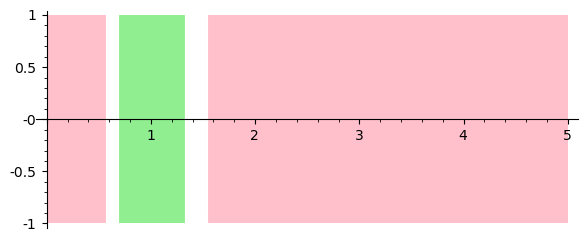

In [135]:
sig.plot()

### Polynomial plot

In [44]:
p + reach.sage_interval_plot('x', 'y',
                             poly=(x - 1)^2 + y^2 - 0.2,
                             aspect_ratio='automatic')

NameError: name 'reach' is not defined

## Context

In [140]:
kwargs = dict(
    order=5, step=(0.01, 0.5),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    verbosity=0,
    epsilon_ctx=0.1,
#    symbolic_composition=True,
)
args = (s, 7)

In [139]:
"[0.05, 0.1] Whelk" >> G(RIF(0,0.2), P)

C([0.05, 0.1] Whelk, G([0.0000000000000000 .. 0.20000000000000002], Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)))

In [141]:
sig = ("[0.05, 0.1] Whelk" >> G(RIF(0,0.2), P)
       ).signal_for_system(s, 10, **kwargs)

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([0.05, 0.1] Whelk)" "/tmp/bond-sage-script-0om64eby.py"' ...
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 103 flowpipes in 0.4015114439971512 sec
mask = None
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 15 flowpipes in 0.09006487899750937 sec
In G.signal
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc7467a0820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.09 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .

Computed 11 flowpipes in 0.04964320198632777 sec
In G.signal
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc7467a0820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^

Computed 7 flowpipes in 0.0377778859983664 sec
In G.signal
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc741b1a700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 

Computed 4 flowpipes in 0.03577295099967159 sec
In G.signal
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc741b1ab80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2

Computed 3 flowpipes in 0.018745852998108603 sec
In G.signal
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc741b1a4c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^

Computed 3 flowpipes in 0.030778672007727437 sec
In G.signal
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc74c415a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^

Computed 2 flowpipes in 0.013849715003743768 sec
In G.signal
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc741b1a3a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^

Computed 2 flowpipes in 0.026607097999658436 sec
In G.signal
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc741b1a280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^

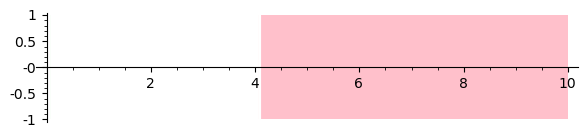

In [142]:
sig.plot()

In [143]:
sigM = ("[0.05, 0.1] Whelk" >> G(RIF(0,0.2), P)
       ).signal_for_system(s, 10, use_masks=True, **kwargs)
sigM

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([0.05, 0.1] Whelk)" "/tmp/bond-sage-script-eiax3kxg.py"' ...
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 103 flowpipes in 0.3956920080236159 sec
mask = Mask([0.0000000000000000 .. 10.002000000000001], [[0.0000000000000000 .. 10.002000000000001]])
mask = Mask([0.0000000000000000 .. 10.002000000000001], [[0.

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.6000000000000

Computed 12 flowpipes in 0.05490558399469592 sec
In G.signal
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc741b1a040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.0500000000

Computed 9 flowpipes in 0.05462123200413771 sec
In G.signal
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc741b1a3a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000

Computed 6 flowpipes in 0.044350680997013114 sec
In G.signal
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc7467a0820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.0500000000

Computed 3 flowpipes in 0.031762915998115204 sec
In G.signal
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc74c415280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.0500000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.04052209100336768 sec
In G.signal
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc741b1adc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mas

Computed 3 flowpipes in 0.025467008003033698 sec
In G.signal
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc741b1a4c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.0500000000

Computed 2 flowpipes in 0.015261555003235117 sec
In G.signal
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc74c415a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.0500000000

domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.014460885009611957 sec
In G.signal
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fc741b1a700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fpr

Signal([0.0000000000000000 .. 10.000000000000000], [([0.0000000000000000 .. 0.078140625000000006], True), ([4.0633125000000003 .. 10.000000000000000], False)], mask=Mask([0.0000000000000000 .. 10.000000000000000], [[0.0000000000000000 .. 10.000000000000000]]))

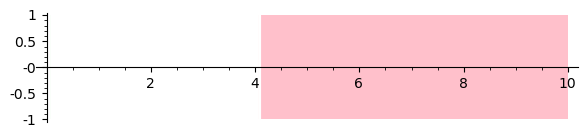

In [144]:
sigM.plot()

In [145]:
sigM.mask

Mask([0.0000000000000000 .. 10.000000000000000], [[0.0000000000000000 .. 10.000000000000000]])

In [146]:
%%time
sigG = G(RIF(10.2, 10.3), ("[0.05, 0.1] Whelk" >> G(RIF(0,0.2), P)),
         ).signal_for_system(vf, v3, 0, **kwargs)

AttributeError: 'System' object has no attribute 'as_process'

In [53]:
sigG(0)

False

In [54]:
%%time
sigG = G(RIF(10.2, 10.3), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
         ).signal_for_system(vf, v3, 0, use_masks=True, **kwargs)

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0000000000000000 .. 1.2000000000000000], [4 .. 6]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 145 flowpipes in 0.8676852030330338 sec
In G.signal
mask = Mask([0.0000000000000000 .. 10.302000000000002], [[10.199999999999999 .. 10.302000000000002]])
mask = Mask([0.0000000000000000 .. 10.302000000000002], [[10.199999999999999 .. 10.302000000000002]])
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99904786189732996 .. 1.0056246182309452], [-0.0062191321833736432 .. 0.010711199615616205]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Comp

In [55]:
%%time
sigG = F(RIF(5, 5.1),
         {y: RIF(1, 1.5)} >>
         G(RIF(10.2, 10.3),
           {x: RIF(0.05,0.1)} >>
            G(RIF(0,0.2), P)),
         ).signal_for_system(vf, v3, 0, **kwargs)

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0000000000000000 .. 1.2000000000000000], [4 .. 6]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 115 flowpipes in 0.7562671300256625 sec
mask = None
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99998486618648119 .. 1.5959882046269048], [-0.18566626515230495 .. 6.0001133420806650]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99998486618648119 .. 1.5959882046269048], [-0.18566626515230495 .. 6.0001133420806650]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.24

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.1185255552318211 .. 1.5926445232344713], [0.56000042373989789 .. 2.6853319965376721]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.1314800553260966 .. 1.5908737486895750], [0.42853433616268721 .. 2.4142172411619228]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.1415581562773222 .. 1.5836894912324125], [0.038820226933202278 .. 2.1866321656157882]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0705180096351416 .. 1.6356626199496154], [-0.35203482262442154 .. 1.7231668725461780]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0818274713698023 .. 1.6356626199496154], [-0.34693157138064612 .. 1.7231668725461780]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 15 flowpipes in 0.09265849500661716 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1

Computed 12 flowpipes in 0.07641118700848892 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4ca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0705180096351416 .. 1.4721458754365236], [-0.32897443683488964 .. 0.95994014479887225]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 9 flowpipes in 0.0627653370029293 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4ca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800000000

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0622475193310325 .. 1.4334781791958227], [-0.32418609700426077 .. 0.83791692274410224]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 8 flowpipes in 0.06335165700875223 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6aa040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000

Computed 6 flowpipes in 0.04186616398510523 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6aa4c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

system sfs = System(R, (x, y), [[1.0437854625392517 .. 1.2910611036873821], [-0.21899795180955792 .. 0.47621485781371015]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 6 flowpipes in 0.06010018297820352 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4dc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0331277022203628 .. 1.2543480840169235], [-0.20080855885835758 .. 0.40612444919327107]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.037400005996460095 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.08000000

Computed 3 flowpipes in 0.027770882996264845 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 3 flowpipes in 0.03227712897933088 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4dc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4ca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0098744684390161 .. 1.1369363380714280], [-0.12192820219081634 .. 0.21312808233184874]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.03618553199339658 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4b80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000

Computed 2 flowpipes in 0.02403191602206789 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.12500000000000000], [0.19885373692167901 .. 0.20599999999900002]]
domain = [0.000

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0256351988602487 .. 1.6198802697814044], [-0.31664843640126734 .. 2.3394556829507254]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0290254160723875 .. 1.6198802697814044], [-0.20787288574894828 .. 2.3394556829507254]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0309177673003735 .. 1.6198324187256088], [-0.13846335177706673 .. 2.3394556829507254]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.599

top-level root detection: 1 items in 0.11 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0332910021462400 .. 1.5272581768106129], [-0.41124710841346913 .. 1.4364168741912309]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 12 flowpipes in 0.08073493800475262 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000

top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0302026094970091 .. 1.4686451483373751], [-0.41156885756587425 .. 1.1788920259290113]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 11 flowpipes in 0.08188606597832404 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6aa280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000

Computed 9 flowpipes in 0.08568321101483889 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 8 flowpipes in 0.05925635897438042 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4ca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 6 flowpipes in 0.05287214199779555 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0042889259520548 .. 1.2267043171169004], [-0.25443566543521601 .. 0.45812983933421997]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 4 flowpipes in 0.03852508301497437 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf700>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000

Computed 3 flowpipes in 0.027435573982074857 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4ee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 3 flowpipes in 0.028149144985945895 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4b80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99597128364851372 .. 1.1478648179678342], [-0.17841912718550896 .. 0.29299261011975087]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.031142972002271563 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4ee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.98876234599246404 .. 1.1104803944558153], [-0.14571085900631664 .. 0.22294012493317717]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.027722064027329907 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c44c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800000

top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.12500000000000000]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.98542823751623087 .. 1.0889917044677784], [-0.12504036298458310 .. 0.18354400312959616]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 2 flowpipes in 0.03173012999468483 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.08000000

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0027573682151609 .. 1.3043891936049690], [0.20064700628998258 .. 1.9963828579457244]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 8 flowpipes in 0.06236039599752985 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfa60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.08000000000

Computed 8 flowpipes in 0.06572920299367979 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 7 flowpipes in 0.05429537399322726 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 6 flowpipes in 0.04175951500656083 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32641a13a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 6 flowpipes in 0.041369170998223126 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfa60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0162430782074420 .. 1.2527380085321503], [-0.061410513385836995 .. 0.91483807318856625]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 6 flowpipes in 0.04292195799644105 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c44c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.08000000

Computed 5 flowpipes in 0.03713991600670852 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0236780035200800 .. 1.2076682390413434], [-0.052516238780437819 .. 0.68415929853127378]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.03510061401175335 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.08000000

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0220936651070506 .. 1.1900049823162509], [-0.065335808598918327 .. 0.59982947897967954]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.035576025024056435 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4dc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000

Computed 3 flowpipes in 0.03215106501011178 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0186780571925728 .. 1.1179391584777490], [-0.055326014256698107 .. 0.33022902189372822]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.033394454017980024 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4b80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800000

Computed 2 flowpipes in 0.019095725001534447 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

In [56]:
%%time
sigG = F(RIF(5, 5.1),
         {y: RIF(1, 1.5)} >>
         G(RIF(10.2, 10.3),
           {x: RIF(0.05,0.1)} >>
            G(RIF(0,0.2), P)),
         ).signal_for_system(vf, v3, 0, use_masks=True, **kwargs)

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0000000000000000 .. 1.2000000000000000], [4 .. 6]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 115 flowpipes in 0.6783926930220332 sec
mask = Mask([0.0000000000000000 .. 5.1020000000000004], [[5.0000000000000000 .. 5.1020000000000004]])
mask = Mask([0.0000000000000000 .. 5.1020000000000004], [[5.0000000000000000 .. 5.1020000000000004]])
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0112459378983276 .. 1.0714985277268708], [-0.055412711766083589 .. 0.11028856279516558]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 70 flowpip

In [57]:
%%time
sigG = G(RIF(2, 2.5),
         {x: RIF(0.1, 0.2)} >>
         F(RIF(5, 5.1),
           {y: RIF(1, 1.5)} >>
           G(RIF(10.2, 10.3),
             {x: RIF(0.05,0.1)} >>
             G(RIF(0,0.2), P))),
         ).signal_for_system(vf, v3, 0, **kwargs)

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0000000000000000 .. 1.2000000000000000], [4 .. 6]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 92 flowpipes in 0.53905553300865 sec
In G.signal
mask = None
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99998486618648119 .. 1.5959882046269048], [-0.18566626515230495 .. 6.0001133420806650]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99998486618648119 .. 1.5959882046269048], [0.061157558039720075 .. 6.0001133420806650]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.1379828460313845 .. 1.5869430655648884], [0.061157558039720075 .. 2.2580610521084515]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.1379828460313845 .. 1.5869430655648884], [0.21554507936345740 .. 2.2580610521084515]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.1379828460313845 .. 1.5869430655648884], [0.34487875573252679 .. 2.2580610521084515]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.1137178683759991 .. 1.6296194935037780], [-0.39137916181722993 .. 1.0161697456904284]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 150 flowpipes in 0.9449377020064276 sec
In G.signal
mask = None
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.98606360609997245 .. 1.6862524350534658], [-0.47315672383846597 .. 2.5491027311019066]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.98606360609997245 .. 1.6862524350534658], [-0.47315672383846597 .. 2.5491027311019066]], (0.2999999999

top-level root detection: 1 items in 0.09 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0304674197679934 .. 1.6170754475596585], [-0.46577307045813777 .. 1.5073272068443738]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 15 flowpipes in 0.0969552859896794 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800000000

Computed 12 flowpipes in 0.0759874579962343 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfb80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 9 flowpipes in 0.07180737200542353 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4b80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 8 flowpipes in 0.05230188599671237 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4b80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 6 flowpipes in 0.03850070899352431 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32517e5700>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0038804457014580 .. 1.3033026584106338], [-0.35061039614235773 .. 0.59644656062394442]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 6 flowpipes in 0.046589267993113026 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.08000000

Computed 5 flowpipes in 0.0363619510026183 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf4c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [

Computed 3 flowpipes in 0.025309806980658323 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4ca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 3 flowpipes in 0.02446248900378123 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4ee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 3 flowpipes in 0.03675369199481793 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 3 flowpipes in 0.03845950201503001 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4ee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 3 flowpipes in 0.025535604974720627 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32641a13a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 3 flowpipes in 0.032101757009513676 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4b80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 133 flowpipes in 0.7129948470101226 sec
In G.signal
mask = None
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99424974993804882 .. 1.6100819298151159], [-0.37376179542620925 .. 2.3860314859086347]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99528879934559066 .. 1.6100819298151159], [-0.37376179542620925 .. 2.3860314859086347]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0095066209323189 .. 1.6100819298151159], [-0.37376179542620925 .. 2.3860314859086347]], (0.2999999999

Computed 15 flowpipes in 0.09131823599454947 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4a60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.08 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 12 flowpipes in 0.08397984597831964 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c44c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0366808100178386 .. 1.4702043531914244], [-0.36737285688618371 .. 1.1056287195892949]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 9 flowpipes in 0.06126590899657458 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800000000

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0176761653883632 .. 1.3973811572637498], [-0.35161195257736100 .. 0.87202742744612672]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 8 flowpipes in 0.05278449199977331 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf3a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0230188594100200 .. 1.3656384858616393], [-0.34709144000435055 .. 0.78232459582243530]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 7 flowpipes in 0.06051518299500458 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*

Computed 6 flowpipes in 0.04084487000363879 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4ca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0137654172990113 .. 1.2621536691338536], [-0.28079014037453349 .. 0.53100762298805915]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 6 flowpipes in 0.053497015993343666 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.08000000

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0126531149499404 .. 1.2229909132627149], [-0.23732355200711825 .. 0.44062967685408667]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.028616733994567767 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0042746625524225 .. 1.1898653534822155], [-0.21400472620526981 .. 0.37462997724864078]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.02897096998640336 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfa60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*

Computed 3 flowpipes in 0.028384231991367415 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

Computed 3 flowpipes in 0.026934600988170132 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32517e5700>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 124 flowpipes in 0.6801290930015966 sec
In G.signal
mask = None
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99563745816665161 .. 1.5500790644219392], [-0.32307754290652819 .. 2.2533640862234790]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99657902197743719 .. 1.5500790644219392], [-0.32307754290652819 .. 2.2533640862234790]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0093920269153593 .. 1.5500790644219392], [-0.32307754290652819 .. 2.2533640862234790]], (0.2999999999

top-level root detection: 1 items in 0.09 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0398061331492216 .. 1.5479615084763641], [0.12255012071524516 .. 2.0475166097794971]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 14 flowpipes in 0.0951101430109702 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4a60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.08000000000

top-level root detection: 1 items in 0.11 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0217188368885663 .. 1.5313679747748068], [-0.21989805330004031 .. 1.5896159348042254]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 12 flowpipes in 0.11087519401917234 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfdc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000

Computed 12 flowpipes in 0.09112554299645126 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32517e5700>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfa60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

Computed 8 flowpipes in 0.061361033003777266 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32517e5700>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0181091722438901 .. 1.3365510565806734], [-0.30450452603804846 .. 0.77884784426972909]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 6 flowpipes in 0.06204226799309254 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0179754502578084 .. 1.3182700801881265], [-0.30166425272426195 .. 0.72664982338072016]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 6 flowpipes in 0.05793684200034477 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfa60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*

Computed 6 flowpipes in 0.05122374201891944 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 3 flowpipes in 0.0396167770086322 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32517e5700>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

Computed 3 flowpipes in 0.02647825499298051 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4a60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0025507516920113 .. 1.1281134225606220], [-0.15411136520576194 .. 0.27390562529924035]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.02599369501695037 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000

Computed 3 flowpipes in 0.030439599009696394 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 115 flowpipes in 0.5480869520106353 sec
In G.signal
mask = None
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99469277105650333 .. 1.4494635002128263], [-0.24974010564707700 .. 2.0886365971242445]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 14 flowpipes in 0.10975395803689025 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.5999999999

Computed 12 flowpipes in 0.08328205801080912 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4ca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 12 flowpipes in 0.11253400100395083 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32641a13a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99651535540107349 .. 1.4420372935042792], [-0.044680598376732925 .. 1.5511047631164579]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 11 flowpipes in 0.07669083200744353 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800000

Computed 9 flowpipes in 0.06445913398056291 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 8 flowpipes in 0.07039741100743413 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32641a13a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0086349802796306 .. 1.3240672378105032], [-0.24597362862846817 .. 0.91779133657647727]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 6 flowpipes in 0.048171876987908036 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf3a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.08000000

Computed 6 flowpipes in 0.04999355401378125 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0104590201788570 .. 1.2463363711230589], [-0.22288240753315237 .. 0.64491164175077876]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 6 flowpipes in 0.0547618459968362 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4ca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800000000

Computed 5 flowpipes in 0.036923337989719585 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 3 flowpipes in 0.026653417997295037 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 3 flowpipes in 0.03440247700200416 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 3 flowpipes in 0.028411539999069646 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32641a13a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 3 flowpipes in 0.03332552098436281 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 3 flowpipes in 0.03186534298583865 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c44c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99793677820632598 .. 1.2260384317191500], [0.0064693832784032470 .. 1.7384497888444615]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 7 flowpipes in 0.054247182997642085 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000

Computed 6 flowpipes in 0.0445634440111462 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0021238448248435 .. 1.2240468806733658], [0.40060388341445524 .. 1.4231847473281308]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 6 flowpipes in 0.048855624976567924 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf4c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800000000

Computed 6 flowpipes in 0.05047385499347001 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfdc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

Computed 4 flowpipes in 0.03416306001599878 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf4c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0210769252861813 .. 1.1847103146041212], [0.077860933352085839 .. 0.74174606569434954]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.02825928499805741 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*

Computed 3 flowpipes in 0.03582137799821794 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 3 flowpipes in 0.029212552006356418 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf4c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 3 flowpipes in 0.02757253299932927 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 3 flowpipes in 0.028127982979640365 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0116809871557932 .. 1.0591689734140977], [-0.0066329805071288721 .. 0.16960501538388371]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 2 flowpipes in 0.02924335200805217 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.1422382765576570 .. 1.7228680210833232], [-0.35968926133592611 .. 1.3082139122167150]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.1306031449446849 .. 1.6980468816645729], [-0.38151135372139728 .. 1.2059583073716905]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.1171343357473257 .. 1.6635925587231349], [-0.38659171909586454 .. 1.0879515459089589]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.599

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0291112637114934 .. 1.6109085195969069], [-0.45801863266662119 .. 1.4736338805802379]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 15 flowpipes in 0.09842021300573833 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32641a13a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*

top-level root detection: 1 items in 0.08 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0357245919009858 .. 1.5645075180054676], [-0.45801863266662119 .. 1.3043992742098576]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 13 flowpipes in 0.08843741100281477 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfa60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0291112637114934 .. 1.4679947891102685], [-0.43276467812767889 .. 0.99457056622556706]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 9 flowpipes in 0.06143527399399318 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*

Computed 9 flowpipes in 0.058675206993939355 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfa60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

Computed 6 flowpipes in 0.05339944700244814 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf3a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 6 flowpipes in 0.04683839299832471 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 4 flowpipes in 0.031710156006738544 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4dc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 3 flowpipes in 0.025638899998739362 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf3a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

Computed 3 flowpipes in 0.027730234985938296 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 3 flowpipes in 0.031649114011088386 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfb80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 2 flowpipes in 0.02341807898483239 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfb80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.12500000000000000], [0.18776184563054715 .. 0.20599999999900002]]
domain = [0.000

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0338393671953298 .. 1.6456167825042763], [0.10079609121681516 .. 2.4608871465126474]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0518557648342292 .. 1.6272295105770843], [0.30802985021758871 .. 2.4608871465126474]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0338393671953298 .. 1.6456167825042763], [0.10079609121681516 .. 2.3594619566273743]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.599999

top-level root detection: 1 items in 0.10 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0027251016815343 .. 1.5735666797270882], [-0.47277559964231176 .. 1.4623037402536921]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 15 flowpipes in 0.08495399498497136 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000

top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0062112863081116 .. 1.5047883640419495], [-0.50052036642218079 .. 1.2315511650521387]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 12 flowpipes in 0.08035409197327681 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99176421107312728 .. 1.4288382945093612], [-0.46881116734001322 .. 0.98957081243611600]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 9 flowpipes in 0.0691330699773971 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfdc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99672566283713825 .. 1.3943081893567205], [-0.46537869705962188 .. 0.89453871117446871]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 8 flowpipes in 0.05998501501744613 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.08000000

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99176421107312728 .. 1.3298159458951580], [-0.41950376832002784 .. 0.73174681409841436]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 7 flowpipes in 0.05105179300880991 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.08000000

Computed 6 flowpipes in 0.046898806001991034 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf700>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 6 flowpipes in 0.04310731700388715 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf3a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.98244439668590777 .. 1.2229859674006729], [-0.32963322137407570 .. 0.49546488697302743]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 5 flowpipes in 0.04209587199147791 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfdc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?

Computed 3 flowpipes in 0.033891446015331894 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf700>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

Computed 3 flowpipes in 0.040094912983477116 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.98072794260776219 .. 1.1153675150648091], [-0.19225637899987858 .. 0.26438712674479576]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.03368674099328928 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfa60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.08000000

Computed 3 flowpipes in 0.027488304011058062 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 3 flowpipes in 0.03127546200994402 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4ca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 114 flowpipes in 0.5995236419839785 sec
In G.signal
mask = None
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99343996097592401 .. 1.4374748635471626], [-0.24120931541528801 .. 2.0626424715118934]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 12 flowpipes in 0.08504681402700953 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.5999999999

top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0075805467346252 .. 1.4284186194651459], [0.37799084535546323 .. 2.0626424715118934]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 12 flowpipes in 0.09094472401193343 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800000000

top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99371772308596684 .. 1.4374748635471626], [-0.075627980144634927 .. 1.7192462238416573]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 12 flowpipes in 0.08162925799842924 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfa60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800000

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99381307923632078 .. 1.4257740899402962], [-0.075627980144634927 .. 1.4743697339793791]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 11 flowpipes in 0.07955070500611328 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf700>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfb80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

Computed 8 flowpipes in 0.053625524014933035 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf3a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 6 flowpipes in 0.04258273800951429 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0078303094255165 .. 1.2754591507171947], [-0.23169783041913964 .. 0.75919895657177839]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 6 flowpipes in 0.06507115601561964 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000

Computed 6 flowpipes in 0.04912863700883463 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfb80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 4 flowpipes in 0.03392077999887988 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 3 flowpipes in 0.02998046000720933 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 3 flowpipes in 0.04473609200795181 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c44c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 3 flowpipes in 0.026750638004159555 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfdc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 3 flowpipes in 0.03112076298566535 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 2 flowpipes in 0.019555423001293093 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfdc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99785563896328288 .. 1.2179580399627106], [0.015714737633166938 .. 1.7262489559888568]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 7 flowpipes in 0.04691074800211936 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*

Computed 6 flowpipes in 0.043867681990377605 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfb80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.030044160730715616 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots

Computed 6 flowpipes in 0.04196722499909811 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0085947193343265 .. 1.2152954283056070], [0.26834550404509144 .. 1.2206069393779569]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 6 flowpipes in 0.0663907419948373 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0132563447378106 .. 1.2073216442388362], [0.15906092114550487 .. 0.98981920705836568]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 5 flowpipes in 0.06045476999133825 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4a60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800000000

Computed 3 flowpipes in 0.03196780101279728 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 3 flowpipes in 0.03185738201136701 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfb80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 3 flowpipes in 0.03741914301645011 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 3 flowpipes in 0.032755893014837056 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0246840015287925 .. 1.1228305338368104], [0.015714737633166938 .. 0.41229477725515457]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.037967398995533586 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?

Computed 3 flowpipes in 0.030107710976153612 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0207625104700157 .. 1.0920066435489111], [-0.000089472927541632206 .. 0.28559281264505049]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 2 flowpipes in 0.028807052003685385 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0

Computed 95 flowpipes in 0.6793477759929374 sec
mask = None
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99101766104973454 .. 1.7346283718401863], [-0.45723046944963703 .. 1.5897910720576656]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0027818854375012 .. 1.7346283718401863], [-0.45723046944963703 .. 1.5897910720576656]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0410861351862721 .. 1.7346283718401863], [-0.45723046944963703 .. 1.5897910720576656]], (0.29999999999999999?*x^2*y

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0316277430453848 .. 1.6366357039209661], [0.063783222566223291 .. 2.4725172413473860]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0501247514427782 .. 1.6180208861247161], [0.26265372925423291 .. 2.4725172413473860]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0316277430453848 .. 1.6366357039209661], [0.063783222566223291 .. 2.3706375124901303]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.5999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.09 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

Computed 12 flowpipes in 0.08426486898679286 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfa60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 9 flowpipes in 0.06085740600246936 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 8 flowpipes in 0.050620940019143745 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 6 flowpipes in 0.04274002098827623 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 6 flowpipes in 0.04678733801119961 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4b80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfb80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

Computed 3 flowpipes in 0.03562226000940427 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfa60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

Computed 3 flowpipes in 0.028175754996482283 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfb80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 164 flowpipes in 0.9769817000196781 sec
In G.signal
mask = None
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.96415207435824756 .. 1.6233433392912898], [-0.54252508387152787 .. 2.4282776909389790]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.96415207435824756 .. 1.6233433392912898], [-0.54252508387152787 .. 2.4282776909389790]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.96791202291624556 .. 1.6233433392912898], [-0.54252508387152787 .. 2.4282776909389790]], (0.299999999

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.97185596462881274 .. 1.5801430980948786], [-0.46591419154411901 .. 1.6323477595648115]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.97330356445366705 .. 1.5619789080277636], [-0.49932427832109072 .. 1.5474318024041867]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 15 flowpipes in 0.09448401298141107 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 -

Computed 12 flowpipes in 0.0857695350132417 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfa60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 11 flowpipes in 0.06360127101652324 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 8 flowpipes in 0.05621392102329992 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf4c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 8 flowpipes in 0.05114922099164687 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfa60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.97055130218868523 .. 1.2886014842104841], [-0.44741489986766192 .. 0.71179803103126949]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 6 flowpipes in 0.049544821988092735 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800000

Computed 6 flowpipes in 0.04240952999680303 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.96673198828555817 .. 1.2262671841156759], [-0.38284337377618983 .. 0.56168019382329227]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 6 flowpipes in 0.0546073560253717 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.96595810338756094 .. 1.1967690578537478], [-0.33840729168206480 .. 0.48811877104456303]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 4 flowpipes in 0.051698246999876574 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000

Computed 3 flowpipes in 0.03558545300620608 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 3 flowpipes in 0.029254945984575897 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.96890400854666836 .. 1.1316191767198212], [-0.25173044963983022 .. 0.33758996252158497]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.03428947401698679 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.08000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.96782045415143114 .. 1.1164003450197826], [-0.23164266753163990 .. 0.30313367403705166]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.03317801500088535 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfb80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.08000000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

Computed 3 flowpipes in 0.030622652993770316 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 3 flowpipes in 0.03740140298032202 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 116 flowpipes in 0.6508154800103512 sec
In G.signal
mask = None
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.97400544713561709 .. 1.4189938402328358], [-0.26552841165133706 .. 2.0858130548926499]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 12 flowpipes in 0.07192128401948139 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.5999999999

Computed 12 flowpipes in 0.07344180400832556 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c44c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.98034098574418560 .. 1.4168162816998667], [0.15346612640753348 .. 1.8581550473933506]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 12 flowpipes in 0.10789575500530191 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000

Computed 11 flowpipes in 0.07755281700519845 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.97452102162056664 .. 1.4053691882365389], [-0.12979332188683499 .. 1.4626182357637703]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 11 flowpipes in 0.06854605200351216 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.08000000

Computed 8 flowpipes in 0.05436626300797798 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 7 flowpipes in 0.06402059897664003 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99529211320881816 .. 1.2902210464213957], [-0.26220243265764743 .. 0.88665281898882320]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 6 flowpipes in 0.061632436991203576 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000

Computed 6 flowpipes in 0.04053400599514134 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4ee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 5 flowpipes in 0.04210236799553968 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4ee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

Computed 3 flowpipes in 0.029846295015886426 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf3a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99943279189095601 .. 1.1455529944485430], [-0.17754341191056797 .. 0.39997534511980904]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.032612787996185943 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf3a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0003597740463361 .. 1.1176847089151501], [-0.14820692900485855 .. 0.32150364333969489]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.02757972598192282 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf3a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfca0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

Computed 82 flowpipes in 0.34833259801962413 sec
In G.signal
mask = None
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.98919397399469155 .. 1.2183853508470027], [-0.015919865775696874 .. 1.7688099173498895]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 7 flowpipes in 0.06866275705397129 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.5999999999

Computed 6 flowpipes in 0.05236830600188114 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99254620297062579 .. 1.2183853508470027], [0.31058280640723479 .. 1.5106239595295559]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 6 flowpipes in 0.07300403801491484 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800000000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4dc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0007375096640278 .. 1.2166905792861012], [0.17865773146437416 .. 1.1473871587313767]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 6 flowpipes in 0.05495314201107249 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfdc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.08000000000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfb80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [

Computed 4 flowpipes in 0.046122934989398345 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf3a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

Computed 3 flowpipes in 0.04683769401162863 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = 

Computed 3 flowpipes in 0.028664575977018103 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4040>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0192959172732793 .. 1.1345389230621830], [-0.00050922225050641784 .. 0.47876208409440680]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.028269900009036064 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4b80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800000000000

Computed 3 flowpipes in 0.028281074977712706 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f32416c4940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots =

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0164466293526845 .. 1.1021270195843640], [-0.015811501228325614 .. 0.33221998105772194]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 3 flowpipes in 0.03582228600862436 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bfee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x7f323f6bf280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.12500000000000000]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000]]
seg_domain = [

In [58]:
%%time
sigG = G(RIF(2, 2.5),
         {x: RIF(0.1, 0.2)} >>
         F(RIF(5, 5.1),
           {y: RIF(1, 1.5)} >>
           G(RIF(10.2, 10.3),
             {x: RIF(0.05,0.1)} >>
             G(RIF(0,0.2), P))),
         ).signal_for_system(vf, v3, 0, use_masks=True, **kwargs)

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0000000000000000 .. 1.2000000000000000], [4 .. 6]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 92 flowpipes in 0.5359357810229994 sec
In G.signal
mask = Mask([0.0000000000000000 .. 2.5020000000000003], [[2.0000000000000000 .. 2.5020000000000003]])
mask = Mask([0.0000000000000000 .. 2.5020000000000003], [[2.0000000000000000 .. 2.5020000000000003]])
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.1024292680261309 .. 1.3432583110108876], [-0.17123410778533238 .. 0.71938507293036880]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 

In [59]:
sigG(0)

False

In [60]:
sigG

Signal([0.0000000000000000 .. -0.0000000000000000], [([0.0000000000000000 .. -0.0000000000000000], False)], mask=Mask([0.0000000000000000 .. -0.0000000000000000], [[0.0000000000000000 .. -0.0000000000000000]]))

In [64]:
%%time
sigG = G(RIF(2, 2.5),
         {x: RIF(0.1, 0.2)} >>
         F(RIF(5, 5.1),
           {y: RIF(1, 1.5)} >>
           G(RIF(10.2, 10.3),
             {x: RIF(0.05,0.1)} >>
             G(RIF(0,0.2), P))),
         ).signal_for_system(vf, v3, 10, use_masks=True, **kwargs)

phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[1.0000000000000000 .. 1.2000000000000000], [4 .. 6]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Computed 155 flowpipes in 0.6689591480244417 sec
In G.signal
mask = Mask([0.0000000000000000 .. 12.502000000000001], [[2.0000000000000000 .. 12.502000000000001]])
mask = Mask([0.0000000000000000 .. 12.502000000000001], [[2.0000000000000000 .. 12.502000000000001]])
phi variables sfs = {y, x}
system sfs = System(R, (x, y), [[0.99863734049121122 .. 1.3432583110108876], [-0.17123410778533238 .. 0.71938507293036880]], (0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x, -2*x^2*y + 1.6000000000000001?*x*y - 0.050000000000000003?*y^2 - 0.050000000000000003?*y), varmap=bidict({'x': x, 'y': y}))
Compute

/usr/lib64/python3.8/site-packages/sage/plot/contour_plot.py:203: UserWarning: No contour levels were found within the data range.
  CS = subplot.contour(self.xy_data_array, contours, cmap=cmap,


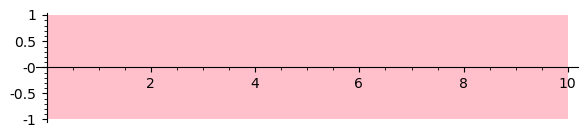

In [62]:
sigG.plot()

## Context signal (masked)

In [ ]:
sigG = G(RIF(1, 1.1), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
         ).signal_for_system(vf, v3, 10, use_masks=True, **kwargs)

In [ ]:
sigG.plot()

In [ ]:
csigG = G(RIF(1, 1.1), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
          ).context_signal_for_system(vf, v3, 10, use_masks=True, **kwargs)

In [ ]:
csigG.signal.plot()

In [ ]:
csigG.refined_signal(1).plot()

In [ ]:
csigG = G(RIF(1, 1.1), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
          ).context_signal_for_system(vf, v3, 10, use_masks=True, refine=1, **kwargs)

In [ ]:
csigG.refined_signal(0).plot()

In [ ]:
csigG.refined_signal(1).plot()

In [ ]:
csigG = G(RIF(1, 1.1), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
          ).context_signal_for_system(vf, v3, 10, use_masks=True, refine=2, **kwargs)

In [ ]:
csigG.refined_signal(0).plot()

In [ ]:
csigG.refined_signal(1).plot()

## Differential Context

In [ ]:
{x: RIF(6,7)} % G(RIF(0,0.2), P)

In [ ]:
# Use symbolic remainders for context jump 
kwargs['integrationScheme'] = 7

In [ ]:
kwargs['verbosity'] = 10

In [ ]:
kwargs['symbolic_composition'] = True

In [ ]:
sig = ({x: RIF(6)} % G(RIF(0,0.2), P)
       ).signal_for_system(vf, v3, 2*pi, **kwargs)

In [ ]:
sig.plot()

In [ ]:
sig = ({x: RIF(6, 6.1)} % G(RIF(0,0.2), P)
       ).signal_for_system(vf, v3, 2*pi, **kwargs)

In [ ]:
sig.plot()

In [ ]:
sig = ({x: RIF(10, 10.05)} % G(RIF(0,0.2), P)
       ).signal_for_system(vf, v3, 2*pi, **kwargs)

In [ ]:
sig.plot()

In [ ]:
{x: 1, y: 2}

In [ ]:
kxs = [[('x', RIF(1,2)), ('y', RIF(5,6))], [('x', RIF(2,3)), ('y', RIF(6,7))], [('x', RIF(1,2)), ('y', RIF(5,6))], [('x', RIF(2,3)), ('y', RIF(6,7))]]

In [ ]:
sorted(kxs)

In [ ]:
sorted(kxs,
       key=lambda xs: [(k, x.endpoints()) for k, x in xs])